<a href="https://colab.research.google.com/github/rajy4683/EVAP2/blob/master/IndianCars_R1GAN3_StepLR_cl1_rembg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Implementation of Deep Convolutional GANs
Reference: https://arxiv.org/pdf/1511.06434.pdf

In [ ]:
!nvidia-smi

Fri Sep 18 16:07:41 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.66       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P8    28W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# Run the comment below only when using Google Colab
# !pip install torch torchvision

In [ ]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F

In [ ]:
from torch.utils.data import DataLoader
from torch.utils.data.dataset import Dataset
from torchvision import datasets
from torchvision import transforms
from torchvision.utils import save_image

In [ ]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import grad

In [ ]:
import numpy as np
import datetime
import os, sys

In [ ]:
import glob

In [ ]:
from PIL import Image
from matplotlib import pyplot as plt

In [ ]:
from matplotlib.pyplot import imshow, imsave
%matplotlib inline
# Set random seed for reproducibility
import random
manualSeed = 0xdeadbeef
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  3735928559


In [ ]:
MODEL_NAME = 'R1GAN'
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
IMAGE_DIM = (128, 128, 3)

In [ ]:
def get_sample_image(G, n_noise):
    """
        save sample 100 images
    """
    z = torch.randn(10, n_noise).to(DEVICE)
    y_hat = G(z).view(10, 3, 28, 28).permute(0, 2, 3, 1) # (100, 28, 28)
    result = (y_hat.detach().cpu().numpy()+1)/2.
    return result

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
!cp /content/drive/My\ Drive/EVA4/S2GAN/allCars.tar.gz /content
!cp /content/drive/My\ Drive/EVA4/S2GAN/allCars_nobg.tar.gz /content
!tar -zxvf allCars.tar.gz
!tar -zxvf allCars_nobg.tar.gz



Mounted at /content/drive
allCars/
allCars/duster_00000002.jpg
allCars/duster_00000003.jpg
allCars/duster_00000004.jpg
allCars/duster_00000005.jpg
allCars/duster_00000006.jpg
allCars/duster_00000008.jpg
allCars/duster_00000009.jpg
allCars/duster_00000010.jpg
allCars/duster_00000013.jpg
allCars/duster_00000014.jpg
allCars/duster_00000015.jpg
allCars/duster_00000016.jpg
allCars/duster_00000017.jpg
allCars/duster_00000018.jpg
allCars/duster_00000019.jpg
allCars/duster_00000020.jpg
allCars/duster_00000022.jpg
allCars/duster_00000024.jpg
allCars/duster_00000025.jpg
allCars/duster_00000026.jpg
allCars/duster_00000032.jpg
allCars/duster_00000033.jpg
allCars/duster_00000034.jpg
allCars/duster_00000035.jpg
allCars/duster_00000036.jpg
allCars/duster_00000037.jpg
allCars/duster_00000040.jpg
allCars/duster_00000041.jpg
allCars/duster_00000042.jpg
allCars/duster_00000044.jpg
allCars/duster_00000045.jpg
allCars/duster_00000046.jpg
allCars/duster_00000047.jpg
allCars/duster_00000048.jpg
allCars/duste

In [ ]:
!mv content/allCars_nobg .

In [ ]:
# Root directory for dataset
dataroot = "/content/allCars_nobg"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 64

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 100

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1


In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
############## PyTorch DCGAN ####################



class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)


In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self, inplanes, planes, kernel_size=3, stride=1, downsample=None, groups=1):
        super(ResidualBlock, self).__init__()
        p = kernel_size//2
        self.conv1 = nn.Sequential(
            nn.Conv2d(inplanes, planes, kernel_size, stride=stride, padding=p),
            nn.LeakyReLU(0.2)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(planes, planes, kernel_size, padding=p),
            nn.LeakyReLU(0.2)
        )
        self.proj = nn.Conv2d(inplanes, planes, 1) if inplanes != planes else None
    
    def forward(self, x):
        identity = x
        
        y = self.conv1(x)
        y = self.conv2(y)
        
        identity = identity if self.proj is None else self.proj(identity)
        y = y + identity
        return y
class Discriminator(nn.Module):
    """
        Convolutional Discriminator
    """
    def __init__(self, in_channel=1, ngpu=1):
        self.ngpu = ngpu
        super(Discriminator, self).__init__()
        self.D = nn.Sequential(
            nn.Conv2d(in_channel, 64, 3, padding=1), # (N, 64, 64, 64)
            ResidualBlock(64, 128),
            nn.AvgPool2d(3, 2, padding=1), # (N, 128, 32, 32)
            ResidualBlock(128, 256),
            nn.AvgPool2d(3, 2, padding=1), # (N, 256, 16, 16)
            ResidualBlock(256, 512),
            nn.AvgPool2d(3, 2, padding=1), # (N, 512, 8, 8)
            ResidualBlock(512, 1024),
            nn.AvgPool2d(3, 2, padding=1) # (N, 1024, 4, 4)
        )
        self.fc = nn.Linear(1024*4*4, 1) # (N, 1)
        
    def forward(self, x):
        B = x.size(0)
        h = self.D(x)
        h = h.view(B, -1)
        y = self.fc(h)
        return y

class Generator(nn.Module):
    """
        Convolutional Generator
    """
    def __init__(self, out_channel=1, n_filters=128, n_noise=512,ngpu=1):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.fc = nn.Linear(n_noise, 1024*4*4)
        self.G = nn.Sequential(
            ResidualBlock(1024, 512),
            nn.Upsample(scale_factor=2, mode='bilinear'), # (N, 512, 8, 8)
            ResidualBlock(512, 256),
            nn.Upsample(scale_factor=2, mode='bilinear'), # (N, 256, 16, 16)
            ResidualBlock(256, 128),
            nn.Upsample(scale_factor=2, mode='bilinear'), # (N, 128, 32, 32)
            ResidualBlock(128, 64),
            nn.Upsample(scale_factor=2, mode='bilinear'), # (N, 64, 64, 64)
            ResidualBlock(64, 64),
            nn.Conv2d(64, out_channel, 3, padding=1) # (N, 3, 64, 64)
        )
        
    def forward(self, z):
        B = z.size(0)
        h = self.fc(z)
        h = h.view(B, 1024, 4, 4)
        x = self.G(h)
        return x

In [ ]:
class CARS(Dataset):
    '''
    CARS Dataset
    You should download this dataset from below url.
    url: https://ai.stanford.edu/~jkrause/cars/car_dataset.html
    '''
    def __init__(self, data_path, transform=None):
        '''
        Args:
            data_path (str): path to dataset
        '''
        self.data_path = data_path
        self.transform = transform
        self.fpaths = sorted(glob.glob(os.path.join(data_path, '*.jpg')))
        #gray_lst = [266, 1085, 2176, 3048, 3439, 3469, 3539, 4577, 4848, 5177, 5502, 5713, 6947, 7383, 7693, 7774, 8137, 8144]
        #for num in gray_lst:
        #    self.fpaths.remove(os.path.join(data_path, '{:05d}.jpg'.format(num)))
        
    def __getitem__(self, idx):
        img = self.transform(Image.open(self.fpaths[idx]))
        return img

    def __len__(self):
        return len(self.fpaths)

In [ ]:
image_size=64
transform = transforms.Compose([transforms.Resize((image_size,image_size)),
                                transforms.CenterCrop(image_size),
                                transforms.ToTensor(),                                
                                transforms.Normalize(mean=(0.5, 0.5, 0.5),
                                std=(0.5, 0.5, 0.5))
                               ]
)

In [ ]:
# #dataset = CARS(data_path='/home/yangyangii/git/cars_train', transform=transform)
# dataset = CARS(data_path='/content/allCars', transform=transform)
# data_loader = DataLoader(dataset=dataset, batch_size=batch_size, shuffle=True, drop_last=True, num_workers=8)

dataset = CARS(data_path='/content/allCars_nobg', transform=transform)
data_loader = DataLoader(dataset=dataset, batch_size=batch_size, shuffle=True, drop_last=True, num_workers=8)

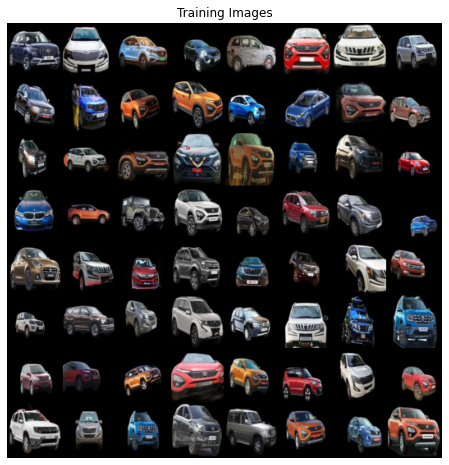

In [ ]:
import torchvision.utils as vutils

real_batch = next(iter(data_loader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [ ]:
#netD = Discriminator(ngpu).to(device)
IMAGE_DIM=(64,64,3)
n_noise = 256
netD = Discriminator(in_channel=IMAGE_DIM[-1]).to(DEVICE)

#G = 


# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

# Create the generator
#netG = Generator(ngpu).to(device)
netG =Generator(out_channel=IMAGE_DIM[-1], n_noise=n_noise).to(DEVICE)
# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)



Discriminator(
  (D): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ResidualBlock(
      (conv1): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): LeakyReLU(negative_slope=0.2)
      )
      (conv2): Sequential(
        (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): LeakyReLU(negative_slope=0.2)
      )
      (proj): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1))
    )
    (2): AvgPool2d(kernel_size=3, stride=2, padding=1)
    (3): ResidualBlock(
      (conv1): Sequential(
        (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): LeakyReLU(negative_slope=0.2)
      )
      (conv2): Sequential(
        (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): LeakyReLU(negative_slope=0.2)
      )
      (proj): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1))
    )
    (4): Av

In [ ]:
D = netD
G = netG
D_opt = torch.optim.RMSprop(D.parameters(), lr=1e-4, alpha=0.99)
G_opt = torch.optim.RMSprop(G.parameters(), lr=1e-4, alpha=0.99)


def r1loss(inputs, label=None):
    # non-saturating loss with R1 regularization
    l = -1 if label else 1
    return F.softplus(l*inputs).mean()

max_epoch = 100
step = 0

log_term = 1000
save_term = 1000

r1_gamma = 10

steps_per_epoch = len(data_loader.dataset) // batch_size
steps_per_epoch

import os
if not os.path.exists('samples'):
    os.makedirs('samples')
    
if not os.path.exists('ckpt'):
    os.makedirs('ckpt')

def save_checkpoint(state, file_name='checkpoint.pth.tar'):
    torch.save(state, file_name)


In [ ]:
def tensor2img(tensor):
    img = (np.transpose(tensor.detach().cpu().numpy(), [1,2,0])+1)/2.
    return img
def get_sample_image(G, n_noise=100, n_samples=64):
    """
        save sample 100 images
    """
    n_rows = int(np.sqrt(n_samples))
    z = (torch.rand(size=[n_samples, n_noise])*2-1).to(DEVICE) # U[-1, 1]
    x_fake = G(z)
    x_fake = torch.cat([torch.cat([x_fake[n_rows*j+i] for i in range(n_rows)], dim=1) for j in range(n_rows)], dim=2)
    result = tensor2img(x_fake)
    return result, z

In [ ]:
my_rand = (torch.rand(size=[64, 100])*2 )

In [ ]:
my_rand.shape

torch.Size([64, 100])

In [ ]:
from tqdm import tqdm_notebook as tqdm
#import tqdm.notebook.tqdm
import datetime

log_term = 10
save_term = 200
max_epoch = 200

G_losses = []
D_losses = []
img_list = []

for epoch in range(max_epoch):
    for idx, images in enumerate(tqdm(data_loader, total=len(data_loader)),0):
        G.zero_grad()
        # Training Discriminator
        
        x = images.to(DEVICE)
        b_size = x.size(0)
        labels = torch.full((b_size,), 1., dtype=torch.float, device=device)

        x.requires_grad = True
        x_outputs = D(x)
        d_real_loss = r1loss(x_outputs, True)
        # Reference >> https://github.com/rosinality/style-based-gan-pytorch/blob/a3d000e707b70d1a5fc277912dc9d7432d6e6069/train.py
        # little different with original DiracGAN
        grad_real = grad(outputs=x_outputs.sum(), inputs=x, create_graph=True)[0]
        grad_penalty = (grad_real.view(grad_real.size(0), -1).norm(2, dim=1) ** 2).mean()
        grad_penalty = 0.5*r1_gamma*grad_penalty
        D_x_loss = d_real_loss + grad_penalty

        z = (torch.rand(size=[batch_size, n_noise])*2-1).to(DEVICE)
        x_fake = G(z)
        z_outputs = D(x_fake.detach())
        D_z_loss = r1loss(z_outputs, False)
        D_loss = D_x_loss + D_z_loss
        
        D.zero_grad()
        D_loss.backward()
        D_opt.step()

        # Training Generator
        z = (torch.rand(size=[batch_size, n_noise])*2-1).to(DEVICE)
        x_fake = G(z)
        z_outputs = D(x_fake)
        G_loss = r1loss(z_outputs, True)
        
        G.zero_grad()
        G_loss.backward()
        G_opt.step()
        
        G_losses.append(G_loss.item())
        D_losses.append(D_loss.item())

        if step % save_term == 0:
            save_checkpoint({'global_step': step,
                 'D':D.state_dict(),
                 'G':G.state_dict(),
                 'd_optim': D_opt.state_dict(),
                 'g_optim' : G_opt.state_dict()},
                'ckpt/r1gan{:06d}.pth.tar'.format(step))
        
        if step % log_term == 0:
            dt = datetime.datetime.now().strftime('%H:%M:%S')
            print('Epoch: {}/{}, Step: {}, D Loss: {:.4f}, G Loss: {:.4f}, gp: {:.4f}, Time:{}'.format(epoch, max_epoch, step, D_loss.item(), G_loss.item(), grad_penalty.item(), dt))
            
            # with torch.no_grad():
            #     fake = G(n_noise).detach().cpu()
            # img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            G.eval()
            img,rnd_z = get_sample_image(G, n_noise, n_samples=64)
            img_data_np = img#.eval()
            min_val = np.min(img_data_np)
            max_val = np.max(img_data_np)
            img_data_clamped = (img_data_np - min_val) / (max_val - min_val)
            #img_list.append(vutils.make_grid(img, padding=2, normalize=True))
            img_list.append(img_data_clamped)
            #imsave('samples/{}_step{:06d}.jpg'.format(MODEL_NAME, step), img_data_clamped)
            G.train()
        
        step += 1
#     D_scheduler.step()
#     G_scheduler.step()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3121: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


Epoch: 0/200, Step: 0, D Loss: 1.3872, G Loss: 0.0015, gp: 0.0000, Time:10:21:19
Epoch: 0/200, Step: 10, D Loss: 1.2624, G Loss: 0.8548, gp: 0.0001, Time:10:21:31



Epoch: 1/200, Step: 20, D Loss: 0.7603, G Loss: 0.8470, gp: 0.0100, Time:10:21:46



Epoch: 2/200, Step: 30, D Loss: 0.3298, G Loss: 1.9877, gp: 0.0539, Time:10:22:01
Epoch: 2/200, Step: 40, D Loss: 0.9286, G Loss: 1.7963, gp: 0.0154, Time:10:22:14



Epoch: 3/200, Step: 50, D Loss: 0.5285, G Loss: 1.9080, gp: 0.0531, Time:10:22:29



Epoch: 4/200, Step: 60, D Loss: 1.0918, G Loss: 1.2721, gp: 0.0632, Time:10:22:44
Epoch: 4/200, Step: 70, D Loss: 1.6744, G Loss: 0.9733, gp: 0.0085, Time:10:22:57



Epoch: 5/200, Step: 80, D Loss: 1.2275, G Loss: 0.9419, gp: 0.0014, Time:10:23:12



Epoch: 6/200, Step: 90, D Loss: 1.2799, G Loss: 1.0301, gp: 0.0052, Time:10:23:27
Epoch: 6/200, Step: 100, D Loss: 0.5300, G Loss: 2.4260, gp: 0.0346, Time:10:23:40



Epoch: 7/200, Step: 110, D Loss: 1.3418, G Loss: 0.7244, gp: 0.0036, Time:10:23:55



Epoch: 8/200, Step: 120, D Loss: 1.1887, G Loss: 0.8036, gp: 0.0074, Time:10:24:10
Epoch: 8/200, Step: 130, D Loss: 1.8824, G Loss: 1.0238, gp: 0.0255, Time:10:24:23



Epoch: 9/200, Step: 140, D Loss: 1.3170, G Loss: 1.2434, gp: 0.0227, Time:10:24:38



Epoch: 10/200, Step: 150, D Loss: 1.2078, G Loss: 1.3763, gp: 0.0546, Time:10:24:53
Epoch: 10/200, Step: 160, D Loss: 1.4115, G Loss: 1.3437, gp: 0.0541, Time:10:25:06



Epoch: 11/200, Step: 170, D Loss: 1.2527, G Loss: 1.3734, gp: 0.0551, Time:10:25:21



Epoch: 12/200, Step: 180, D Loss: 0.7672, G Loss: 2.6180, gp: 0.0629, Time:10:25:37
Epoch: 12/200, Step: 190, D Loss: 1.1774, G Loss: 0.9663, gp: 0.0263, Time:10:25:50



Epoch: 13/200, Step: 200, D Loss: 1.1561, G Loss: 1.9770, gp: 0.0259, Time:10:26:06



Epoch: 14/200, Step: 210, D Loss: 0.9493, G Loss: 1.5808, gp: 0.0315, Time:10:26:21
Epoch: 14/200, Step: 220, D Loss: 0.6753, G Loss: 2.6813, gp: 0.1100, Time:10:26:34



Epoch: 15/200, Step: 230, D Loss: 0.2093, G Loss: 3.4415, gp: 0.0870, Time:10:26:49



Epoch: 16/200, Step: 240, D Loss: 1.1497, G Loss: 0.8680, gp: 0.0098, Time:10:27:04
Epoch: 16/200, Step: 250, D Loss: 1.5311, G Loss: 0.8468, gp: 0.0400, Time:10:27:17



Epoch: 17/200, Step: 260, D Loss: 1.2646, G Loss: 0.8467, gp: 0.0117, Time:10:27:32



Epoch: 18/200, Step: 270, D Loss: 1.3279, G Loss: 0.8196, gp: 0.0253, Time:10:27:48
Epoch: 18/200, Step: 280, D Loss: 1.0547, G Loss: 1.5032, gp: 0.0345, Time:10:28:01



Epoch: 19/200, Step: 290, D Loss: 0.2413, G Loss: 2.7393, gp: 0.0492, Time:10:28:16



Epoch: 20/200, Step: 300, D Loss: 0.1196, G Loss: 3.7923, gp: 0.0590, Time:10:28:31
Epoch: 20/200, Step: 310, D Loss: 0.0653, G Loss: 4.9661, gp: 0.0392, Time:10:28:44



Epoch: 21/200, Step: 320, D Loss: 1.1283, G Loss: 0.6160, gp: 0.0097, Time:10:28:59



Epoch: 22/200, Step: 330, D Loss: 1.1479, G Loss: 0.8042, gp: 0.0054, Time:10:29:13
Epoch: 22/200, Step: 340, D Loss: 1.7075, G Loss: 0.9296, gp: 0.0237, Time:10:29:26



Epoch: 23/200, Step: 350, D Loss: 1.2455, G Loss: 0.5341, gp: 0.0688, Time:10:29:42



Epoch: 24/200, Step: 360, D Loss: 1.0783, G Loss: 1.4440, gp: 0.0789, Time:10:29:56
Epoch: 24/200, Step: 370, D Loss: 1.1279, G Loss: 1.4873, gp: 0.0618, Time:10:30:10



Epoch: 25/200, Step: 380, D Loss: 1.3105, G Loss: 0.7377, gp: 0.0048, Time:10:30:24



Epoch: 26/200, Step: 390, D Loss: 1.5621, G Loss: 0.6890, gp: 0.0268, Time:10:30:39
Epoch: 26/200, Step: 400, D Loss: 1.2310, G Loss: 0.9771, gp: 0.0079, Time:10:30:53



Epoch: 27/200, Step: 410, D Loss: 1.0758, G Loss: 1.1811, gp: 0.1553, Time:10:31:09



Epoch: 28/200, Step: 420, D Loss: 1.2243, G Loss: 0.8429, gp: 0.0069, Time:10:31:24
Epoch: 28/200, Step: 430, D Loss: 1.4940, G Loss: 1.4359, gp: 0.0461, Time:10:31:37



Epoch: 29/200, Step: 440, D Loss: 1.3343, G Loss: 1.6118, gp: 0.0570, Time:10:31:52



Epoch: 30/200, Step: 450, D Loss: 1.0243, G Loss: 1.0848, gp: 0.0185, Time:10:32:07
Epoch: 30/200, Step: 460, D Loss: 0.9916, G Loss: 1.2133, gp: 0.0463, Time:10:32:20



Epoch: 31/200, Step: 470, D Loss: 1.0820, G Loss: 1.0271, gp: 0.0171, Time:10:32:35



Epoch: 32/200, Step: 480, D Loss: 0.9575, G Loss: 1.0144, gp: 0.0768, Time:10:32:50
Epoch: 32/200, Step: 490, D Loss: 1.0706, G Loss: 1.4714, gp: 0.1005, Time:10:33:03



Epoch: 33/200, Step: 500, D Loss: 0.9656, G Loss: 2.0277, gp: 0.1926, Time:10:33:19



Epoch: 34/200, Step: 510, D Loss: 0.5559, G Loss: 2.5908, gp: 0.1349, Time:10:33:34
Epoch: 34/200, Step: 520, D Loss: 0.4021, G Loss: 6.2998, gp: 0.0810, Time:10:33:47



Epoch: 35/200, Step: 530, D Loss: 0.4445, G Loss: 4.9818, gp: 0.0844, Time:10:34:02



Epoch: 36/200, Step: 540, D Loss: 0.8726, G Loss: 1.4443, gp: 0.0201, Time:10:34:17
Epoch: 36/200, Step: 550, D Loss: 0.3456, G Loss: 3.2347, gp: 0.0858, Time:10:34:30



Epoch: 37/200, Step: 560, D Loss: 0.1613, G Loss: 3.9902, gp: 0.0703, Time:10:34:45



Epoch: 38/200, Step: 570, D Loss: 0.8969, G Loss: 1.3708, gp: 0.0143, Time:10:35:00
Epoch: 38/200, Step: 580, D Loss: 1.0398, G Loss: 1.0102, gp: 0.0144, Time:10:35:13



Epoch: 39/200, Step: 590, D Loss: 0.7994, G Loss: 1.6428, gp: 0.0375, Time:10:35:28



Epoch: 40/200, Step: 600, D Loss: 1.2017, G Loss: 3.8105, gp: 0.0636, Time:10:35:44
Epoch: 40/200, Step: 610, D Loss: 0.8400, G Loss: 1.3714, gp: 0.0501, Time:10:35:57



Epoch: 41/200, Step: 620, D Loss: 2.5968, G Loss: 0.6530, gp: 0.4264, Time:10:36:12



Epoch: 42/200, Step: 630, D Loss: 1.0174, G Loss: 1.0273, gp: 0.0215, Time:10:36:27
Epoch: 42/200, Step: 640, D Loss: 0.9469, G Loss: 1.3069, gp: 0.0546, Time:10:36:40



Epoch: 43/200, Step: 650, D Loss: 1.3877, G Loss: 2.4942, gp: 0.1126, Time:10:36:55



Epoch: 44/200, Step: 660, D Loss: 0.9531, G Loss: 2.0498, gp: 0.0890, Time:10:37:11
Epoch: 44/200, Step: 670, D Loss: 1.1175, G Loss: 0.9800, gp: 0.0281, Time:10:37:24



Epoch: 45/200, Step: 680, D Loss: 0.9759, G Loss: 1.2574, gp: 0.0525, Time:10:37:40



Epoch: 46/200, Step: 690, D Loss: 1.0114, G Loss: 1.1807, gp: 0.0432, Time:10:37:55
Epoch: 46/200, Step: 700, D Loss: 1.5827, G Loss: 1.4931, gp: 0.2339, Time:10:38:08



Epoch: 47/200, Step: 710, D Loss: 1.0249, G Loss: 3.1306, gp: 0.0501, Time:10:38:23



Epoch: 48/200, Step: 720, D Loss: 1.0545, G Loss: 0.9481, gp: 0.0287, Time:10:38:38
Epoch: 48/200, Step: 730, D Loss: 0.9896, G Loss: 1.4586, gp: 0.0681, Time:10:38:51



Epoch: 49/200, Step: 740, D Loss: 0.9885, G Loss: 1.1852, gp: 0.0875, Time:10:39:06



Epoch: 50/200, Step: 750, D Loss: 1.2002, G Loss: 0.9595, gp: 0.0201, Time:10:39:21
Epoch: 50/200, Step: 760, D Loss: 1.5589, G Loss: 1.2979, gp: 0.0405, Time:10:39:34



Epoch: 51/200, Step: 770, D Loss: 1.0218, G Loss: 1.4510, gp: 0.0522, Time:10:39:49



Epoch: 52/200, Step: 780, D Loss: 1.1279, G Loss: 2.3077, gp: 0.1025, Time:10:40:04
Epoch: 52/200, Step: 790, D Loss: 1.0816, G Loss: 2.2782, gp: 0.0633, Time:10:40:17



Epoch: 53/200, Step: 800, D Loss: 1.0355, G Loss: 1.3673, gp: 0.1687, Time:10:40:33



Epoch: 54/200, Step: 810, D Loss: 1.1251, G Loss: 0.9076, gp: 0.0464, Time:10:40:48
Epoch: 54/200, Step: 820, D Loss: 1.1658, G Loss: 1.3877, gp: 0.0752, Time:10:41:01



Epoch: 55/200, Step: 830, D Loss: 1.3264, G Loss: 1.2396, gp: 0.1545, Time:10:41:16



Epoch: 56/200, Step: 840, D Loss: 1.0336, G Loss: 1.7485, gp: 0.1270, Time:10:41:31
Epoch: 56/200, Step: 850, D Loss: 1.2696, G Loss: 0.7012, gp: 0.0552, Time:10:41:45



Epoch: 57/200, Step: 860, D Loss: 1.2772, G Loss: 1.1947, gp: 0.0277, Time:10:42:00



Epoch: 58/200, Step: 870, D Loss: 1.2479, G Loss: 1.2870, gp: 0.0355, Time:10:42:14
Epoch: 58/200, Step: 880, D Loss: 1.4032, G Loss: 2.0217, gp: 0.0717, Time:10:42:28



Epoch: 59/200, Step: 890, D Loss: 1.0937, G Loss: 0.9252, gp: 0.0596, Time:10:42:42



Epoch: 60/200, Step: 900, D Loss: 1.0743, G Loss: 1.6795, gp: 0.0521, Time:10:42:57
Epoch: 60/200, Step: 910, D Loss: 0.8988, G Loss: 1.3887, gp: 0.1204, Time:10:43:11



Epoch: 61/200, Step: 920, D Loss: 1.0951, G Loss: 1.1523, gp: 0.1672, Time:10:43:25



Epoch: 62/200, Step: 930, D Loss: 0.6758, G Loss: 1.7051, gp: 0.0668, Time:10:43:40
Epoch: 62/200, Step: 940, D Loss: 1.0328, G Loss: 0.9889, gp: 0.0439, Time:10:43:54



Epoch: 63/200, Step: 950, D Loss: 0.8204, G Loss: 1.8179, gp: 0.0827, Time:10:44:08



Epoch: 64/200, Step: 960, D Loss: 0.9976, G Loss: 1.3348, gp: 0.1138, Time:10:44:23
Epoch: 64/200, Step: 970, D Loss: 1.5042, G Loss: 0.8592, gp: 0.2323, Time:10:44:36



Epoch: 65/200, Step: 980, D Loss: 1.5242, G Loss: 0.7789, gp: 0.1073, Time:10:44:51



Epoch: 66/200, Step: 990, D Loss: 1.2010, G Loss: 0.8617, gp: 0.0441, Time:10:45:06
Epoch: 66/200, Step: 1000, D Loss: 0.9339, G Loss: 1.9391, gp: 0.2394, Time:10:45:20



Epoch: 67/200, Step: 1010, D Loss: 1.0239, G Loss: 1.2549, gp: 0.2062, Time:10:45:35



Epoch: 68/200, Step: 1020, D Loss: 0.9234, G Loss: 2.1805, gp: 0.1288, Time:10:45:50
Epoch: 68/200, Step: 1030, D Loss: 1.0179, G Loss: 1.8664, gp: 0.0959, Time:10:46:03



Epoch: 69/200, Step: 1040, D Loss: 1.2030, G Loss: 0.8405, gp: 0.1196, Time:10:46:18



Epoch: 70/200, Step: 1050, D Loss: 1.0192, G Loss: 1.1259, gp: 0.0580, Time:10:46:33
Epoch: 70/200, Step: 1060, D Loss: 1.1295, G Loss: 0.9918, gp: 0.0339, Time:10:46:47



Epoch: 71/200, Step: 1070, D Loss: 1.0879, G Loss: 1.5563, gp: 0.1381, Time:10:47:02



Epoch: 72/200, Step: 1080, D Loss: 1.3649, G Loss: 2.1851, gp: 0.1425, Time:10:47:17
Epoch: 72/200, Step: 1090, D Loss: 1.1572, G Loss: 1.3199, gp: 0.0643, Time:10:47:30



Epoch: 73/200, Step: 1100, D Loss: 1.2579, G Loss: 1.6725, gp: 0.0664, Time:10:47:45



Epoch: 74/200, Step: 1110, D Loss: 1.0808, G Loss: 1.5765, gp: 0.1089, Time:10:48:00
Epoch: 74/200, Step: 1120, D Loss: 1.0112, G Loss: 1.3656, gp: 0.1004, Time:10:48:13



Epoch: 75/200, Step: 1130, D Loss: 1.0401, G Loss: 1.4623, gp: 0.1161, Time:10:48:28



Epoch: 76/200, Step: 1140, D Loss: 1.0660, G Loss: 1.3869, gp: 0.0854, Time:10:48:42
Epoch: 76/200, Step: 1150, D Loss: 1.2679, G Loss: 1.1881, gp: 0.1824, Time:10:48:56



Epoch: 77/200, Step: 1160, D Loss: 1.5440, G Loss: 0.7617, gp: 0.0900, Time:10:49:11



Epoch: 78/200, Step: 1170, D Loss: 1.0227, G Loss: 1.6885, gp: 0.1209, Time:10:49:26
Epoch: 78/200, Step: 1180, D Loss: 1.2568, G Loss: 1.5396, gp: 0.0588, Time:10:49:39



Epoch: 79/200, Step: 1190, D Loss: 1.1611, G Loss: 1.3661, gp: 0.0976, Time:10:49:54



Epoch: 80/200, Step: 1200, D Loss: 0.9909, G Loss: 1.4328, gp: 0.2335, Time:10:50:10
Epoch: 80/200, Step: 1210, D Loss: 1.1161, G Loss: 1.0169, gp: 0.2073, Time:10:50:23



Epoch: 81/200, Step: 1220, D Loss: 1.0809, G Loss: 1.4196, gp: 0.2374, Time:10:50:38



Epoch: 82/200, Step: 1230, D Loss: 1.3867, G Loss: 0.8889, gp: 0.1233, Time:10:50:53
Epoch: 82/200, Step: 1240, D Loss: 1.1768, G Loss: 1.1401, gp: 0.1454, Time:10:51:06



Epoch: 83/200, Step: 1250, D Loss: 1.1848, G Loss: 0.7984, gp: 0.0503, Time:10:51:21



Epoch: 84/200, Step: 1260, D Loss: 1.0812, G Loss: 0.9511, gp: 0.0572, Time:10:51:36
Epoch: 84/200, Step: 1270, D Loss: 1.0493, G Loss: 1.2561, gp: 0.0696, Time:10:51:49



Epoch: 85/200, Step: 1280, D Loss: 1.0658, G Loss: 1.3062, gp: 0.0573, Time:10:52:04



Epoch: 86/200, Step: 1290, D Loss: 1.0565, G Loss: 1.4974, gp: 0.0742, Time:10:52:19
Epoch: 86/200, Step: 1300, D Loss: 1.1344, G Loss: 1.7292, gp: 0.1032, Time:10:52:32



Epoch: 87/200, Step: 1310, D Loss: 1.3310, G Loss: 1.2281, gp: 0.0510, Time:10:52:47



Epoch: 88/200, Step: 1320, D Loss: 1.1065, G Loss: 1.4526, gp: 0.0707, Time:10:53:03
Epoch: 88/200, Step: 1330, D Loss: 1.0933, G Loss: 1.6019, gp: 0.0679, Time:10:53:16



Epoch: 89/200, Step: 1340, D Loss: 1.2409, G Loss: 0.8024, gp: 0.0886, Time:10:53:31



Epoch: 90/200, Step: 1350, D Loss: 1.0014, G Loss: 1.1872, gp: 0.0688, Time:10:53:46
Epoch: 90/200, Step: 1360, D Loss: 0.8826, G Loss: 2.0336, gp: 0.0894, Time:10:53:59



Epoch: 91/200, Step: 1370, D Loss: 1.2317, G Loss: 1.7268, gp: 0.0809, Time:10:54:14



Epoch: 92/200, Step: 1380, D Loss: 1.0597, G Loss: 1.1708, gp: 0.0754, Time:10:54:29
Epoch: 92/200, Step: 1390, D Loss: 1.2850, G Loss: 1.1726, gp: 0.1503, Time:10:54:43



Epoch: 93/200, Step: 1400, D Loss: 1.1423, G Loss: 1.4870, gp: 0.1168, Time:10:54:59



Epoch: 94/200, Step: 1410, D Loss: 1.2055, G Loss: 1.6292, gp: 0.1003, Time:10:55:14
Epoch: 94/200, Step: 1420, D Loss: 1.1783, G Loss: 0.7940, gp: 0.0959, Time:10:55:27



Epoch: 95/200, Step: 1430, D Loss: 1.0719, G Loss: 1.6268, gp: 0.1065, Time:10:55:42



Epoch: 96/200, Step: 1440, D Loss: 1.1784, G Loss: 0.9481, gp: 0.0639, Time:10:55:57
Epoch: 96/200, Step: 1450, D Loss: 1.0471, G Loss: 1.2671, gp: 0.1357, Time:10:56:11



Epoch: 97/200, Step: 1460, D Loss: 1.1303, G Loss: 1.9268, gp: 0.0818, Time:10:56:26



Epoch: 98/200, Step: 1470, D Loss: 1.3729, G Loss: 0.9518, gp: 0.2041, Time:10:56:40
Epoch: 98/200, Step: 1480, D Loss: 1.2473, G Loss: 2.1293, gp: 0.0870, Time:10:56:54



Epoch: 99/200, Step: 1490, D Loss: 1.0817, G Loss: 2.1224, gp: 0.1486, Time:10:57:08



Epoch: 100/200, Step: 1500, D Loss: 1.1064, G Loss: 1.5196, gp: 0.1139, Time:10:57:24
Epoch: 100/200, Step: 1510, D Loss: 1.2264, G Loss: 1.2855, gp: 0.0802, Time:10:57:37



Epoch: 101/200, Step: 1520, D Loss: 1.4129, G Loss: 1.1424, gp: 0.2954, Time:10:57:52



Epoch: 102/200, Step: 1530, D Loss: 1.2510, G Loss: 1.5056, gp: 0.1034, Time:10:58:07
Epoch: 102/200, Step: 1540, D Loss: 1.2934, G Loss: 1.3322, gp: 0.0676, Time:10:58:21



Epoch: 103/200, Step: 1550, D Loss: 1.0431, G Loss: 1.5617, gp: 0.1003, Time:10:58:36



Epoch: 104/200, Step: 1560, D Loss: 1.1704, G Loss: 0.9199, gp: 0.0526, Time:10:58:51
Epoch: 104/200, Step: 1570, D Loss: 1.1903, G Loss: 1.3705, gp: 0.1472, Time:10:59:04



Epoch: 105/200, Step: 1580, D Loss: 1.1642, G Loss: 0.8709, gp: 0.0760, Time:10:59:19



Epoch: 106/200, Step: 1590, D Loss: 1.2470, G Loss: 0.8295, gp: 0.0865, Time:10:59:34
Epoch: 106/200, Step: 1600, D Loss: 1.2132, G Loss: 0.9410, gp: 0.1490, Time:10:59:48



Epoch: 107/200, Step: 1610, D Loss: 1.2468, G Loss: 1.1467, gp: 0.1210, Time:11:00:03



Epoch: 108/200, Step: 1620, D Loss: 1.0431, G Loss: 1.3480, gp: 0.1029, Time:11:00:18
Epoch: 108/200, Step: 1630, D Loss: 1.1707, G Loss: 0.8494, gp: 0.0666, Time:11:00:32



Epoch: 109/200, Step: 1640, D Loss: 1.1045, G Loss: 1.3375, gp: 0.1430, Time:11:00:47



Epoch: 110/200, Step: 1650, D Loss: 1.1744, G Loss: 1.2033, gp: 0.1210, Time:11:01:02
Epoch: 110/200, Step: 1660, D Loss: 1.0698, G Loss: 1.1800, gp: 0.0753, Time:11:01:15



Epoch: 111/200, Step: 1670, D Loss: 1.2230, G Loss: 1.3696, gp: 0.0657, Time:11:01:30



Epoch: 112/200, Step: 1680, D Loss: 1.2320, G Loss: 0.7769, gp: 0.1543, Time:11:01:46
Epoch: 112/200, Step: 1690, D Loss: 1.1199, G Loss: 1.0668, gp: 0.0902, Time:11:01:59



Epoch: 113/200, Step: 1700, D Loss: 1.1516, G Loss: 1.1156, gp: 0.1311, Time:11:02:14



Epoch: 114/200, Step: 1710, D Loss: 1.0571, G Loss: 1.3373, gp: 0.1104, Time:11:02:29
Epoch: 114/200, Step: 1720, D Loss: 1.0727, G Loss: 1.8265, gp: 0.0723, Time:11:02:42



Epoch: 115/200, Step: 1730, D Loss: 1.2998, G Loss: 1.1473, gp: 0.1370, Time:11:02:57



Epoch: 116/200, Step: 1740, D Loss: 1.1673, G Loss: 1.3778, gp: 0.1215, Time:11:03:12
Epoch: 116/200, Step: 1750, D Loss: 1.1160, G Loss: 0.8641, gp: 0.0751, Time:11:03:26



Epoch: 117/200, Step: 1760, D Loss: 1.1322, G Loss: 1.4840, gp: 0.0990, Time:11:03:41



Epoch: 118/200, Step: 1770, D Loss: 1.0825, G Loss: 1.5609, gp: 0.1269, Time:11:03:55
Epoch: 118/200, Step: 1780, D Loss: 1.1216, G Loss: 1.3351, gp: 0.1159, Time:11:04:09



Epoch: 119/200, Step: 1790, D Loss: 1.4246, G Loss: 1.7781, gp: 0.1636, Time:11:04:24



Epoch: 120/200, Step: 1800, D Loss: 1.1997, G Loss: 1.4827, gp: 0.1236, Time:11:04:40
Epoch: 120/200, Step: 1810, D Loss: 1.4539, G Loss: 2.0420, gp: 0.1699, Time:11:04:53



Epoch: 121/200, Step: 1820, D Loss: 1.1387, G Loss: 0.9299, gp: 0.0575, Time:11:05:08



Epoch: 122/200, Step: 1830, D Loss: 1.0917, G Loss: 1.1047, gp: 0.1196, Time:11:05:23
Epoch: 122/200, Step: 1840, D Loss: 1.1345, G Loss: 1.0590, gp: 0.0644, Time:11:05:36



Epoch: 123/200, Step: 1850, D Loss: 1.2024, G Loss: 1.4310, gp: 0.1096, Time:11:05:51



Epoch: 124/200, Step: 1860, D Loss: 1.2004, G Loss: 0.9729, gp: 0.0914, Time:11:06:06
Epoch: 124/200, Step: 1870, D Loss: 1.1729, G Loss: 1.2349, gp: 0.0635, Time:11:06:19



Epoch: 125/200, Step: 1880, D Loss: 1.2183, G Loss: 0.9531, gp: 0.1221, Time:11:06:34



Epoch: 126/200, Step: 1890, D Loss: 1.2910, G Loss: 0.9804, gp: 0.0557, Time:11:06:49
Epoch: 126/200, Step: 1900, D Loss: 1.1888, G Loss: 1.4672, gp: 0.1288, Time:11:07:03



Epoch: 127/200, Step: 1910, D Loss: 1.3409, G Loss: 0.8041, gp: 0.1001, Time:11:07:18



Epoch: 128/200, Step: 1920, D Loss: 1.2316, G Loss: 1.2034, gp: 0.1018, Time:11:07:33
Epoch: 128/200, Step: 1930, D Loss: 1.1798, G Loss: 1.0434, gp: 0.0582, Time:11:07:46



Epoch: 129/200, Step: 1940, D Loss: 1.2724, G Loss: 1.0051, gp: 0.0586, Time:11:08:01



Epoch: 130/200, Step: 1950, D Loss: 1.1463, G Loss: 1.0100, gp: 0.1288, Time:11:08:16
Epoch: 130/200, Step: 1960, D Loss: 1.2254, G Loss: 0.9603, gp: 0.0939, Time:11:08:29



Epoch: 131/200, Step: 1970, D Loss: 1.1996, G Loss: 1.3114, gp: 0.0499, Time:11:08:45



Epoch: 132/200, Step: 1980, D Loss: 1.2084, G Loss: 1.2954, gp: 0.0788, Time:11:09:00
Epoch: 132/200, Step: 1990, D Loss: 1.3720, G Loss: 0.8855, gp: 0.1028, Time:11:09:13



Epoch: 133/200, Step: 2000, D Loss: 1.1167, G Loss: 1.0564, gp: 0.0654, Time:11:09:29



Epoch: 134/200, Step: 2010, D Loss: 1.1452, G Loss: 1.3820, gp: 0.0735, Time:11:09:44
Epoch: 134/200, Step: 2020, D Loss: 1.1699, G Loss: 1.1496, gp: 0.0689, Time:11:09:57



Epoch: 135/200, Step: 2030, D Loss: 1.2206, G Loss: 1.5086, gp: 0.0802, Time:11:10:12



Epoch: 136/200, Step: 2040, D Loss: 1.1293, G Loss: 1.0342, gp: 0.0629, Time:11:10:27
Epoch: 136/200, Step: 2050, D Loss: 1.4014, G Loss: 0.8113, gp: 0.1580, Time:11:10:40



Epoch: 137/200, Step: 2060, D Loss: 1.1296, G Loss: 1.2913, gp: 0.1737, Time:11:10:56



Epoch: 138/200, Step: 2070, D Loss: 1.4140, G Loss: 1.0042, gp: 0.1615, Time:11:11:10
Epoch: 138/200, Step: 2080, D Loss: 1.2123, G Loss: 0.7170, gp: 0.1214, Time:11:11:24



Epoch: 139/200, Step: 2090, D Loss: 1.1567, G Loss: 1.0995, gp: 0.0855, Time:11:11:39



Epoch: 140/200, Step: 2100, D Loss: 1.2773, G Loss: 1.0782, gp: 0.1615, Time:11:11:54
Epoch: 140/200, Step: 2110, D Loss: 1.1645, G Loss: 1.2049, gp: 0.0881, Time:11:12:08



Epoch: 141/200, Step: 2120, D Loss: 1.2142, G Loss: 0.8943, gp: 0.1033, Time:11:12:23



Epoch: 142/200, Step: 2130, D Loss: 1.1226, G Loss: 0.9298, gp: 0.1196, Time:11:12:38
Epoch: 142/200, Step: 2140, D Loss: 1.0960, G Loss: 1.1124, gp: 0.0787, Time:11:12:51



Epoch: 143/200, Step: 2150, D Loss: 1.1111, G Loss: 1.4271, gp: 0.0740, Time:11:13:06



Epoch: 144/200, Step: 2160, D Loss: 1.1509, G Loss: 0.9038, gp: 0.0539, Time:11:13:21
Epoch: 144/200, Step: 2170, D Loss: 1.1587, G Loss: 1.3532, gp: 0.1159, Time:11:13:34



Epoch: 145/200, Step: 2180, D Loss: 1.3749, G Loss: 0.6187, gp: 0.0792, Time:11:13:49



Epoch: 146/200, Step: 2190, D Loss: 1.0997, G Loss: 1.8920, gp: 0.1041, Time:11:14:04
Epoch: 146/200, Step: 2200, D Loss: 1.2210, G Loss: 1.2104, gp: 0.1172, Time:11:14:19



Epoch: 147/200, Step: 2210, D Loss: 1.1727, G Loss: 1.4195, gp: 0.1242, Time:11:14:34



Epoch: 148/200, Step: 2220, D Loss: 1.0892, G Loss: 1.0169, gp: 0.0611, Time:11:14:49
Epoch: 148/200, Step: 2230, D Loss: 1.1739, G Loss: 1.1872, gp: 0.1014, Time:11:15:02



Epoch: 149/200, Step: 2240, D Loss: 1.1561, G Loss: 0.9145, gp: 0.0826, Time:11:15:17



Epoch: 150/200, Step: 2250, D Loss: 1.1309, G Loss: 1.3183, gp: 0.1254, Time:11:15:32
Epoch: 150/200, Step: 2260, D Loss: 1.1759, G Loss: 0.8776, gp: 0.0843, Time:11:15:45



Epoch: 151/200, Step: 2270, D Loss: 1.1712, G Loss: 1.0178, gp: 0.1059, Time:11:16:00



Epoch: 152/200, Step: 2280, D Loss: 1.2962, G Loss: 1.1998, gp: 0.0869, Time:11:16:15
Epoch: 152/200, Step: 2290, D Loss: 1.2691, G Loss: 1.7577, gp: 0.1250, Time:11:16:28



Epoch: 153/200, Step: 2300, D Loss: 1.0852, G Loss: 1.1249, gp: 0.0833, Time:11:16:43



Epoch: 154/200, Step: 2310, D Loss: 1.2105, G Loss: 1.3142, gp: 0.1163, Time:11:16:58
Epoch: 154/200, Step: 2320, D Loss: 1.1763, G Loss: 1.1567, gp: 0.1287, Time:11:17:11



Epoch: 155/200, Step: 2330, D Loss: 1.2782, G Loss: 1.2601, gp: 0.1562, Time:11:17:26



Epoch: 156/200, Step: 2340, D Loss: 1.1113, G Loss: 1.6485, gp: 0.0858, Time:11:17:41
Epoch: 156/200, Step: 2350, D Loss: 1.1337, G Loss: 1.2073, gp: 0.1117, Time:11:17:55



Epoch: 157/200, Step: 2360, D Loss: 1.1476, G Loss: 1.5252, gp: 0.0939, Time:11:18:10



Epoch: 158/200, Step: 2370, D Loss: 1.1115, G Loss: 1.1376, gp: 0.1235, Time:11:18:25
Epoch: 158/200, Step: 2380, D Loss: 1.2085, G Loss: 1.2151, gp: 0.0733, Time:11:18:38



Epoch: 159/200, Step: 2390, D Loss: 1.2098, G Loss: 0.8678, gp: 0.1402, Time:11:18:53



Epoch: 160/200, Step: 2400, D Loss: 1.2183, G Loss: 1.4258, gp: 0.0717, Time:11:19:09
Epoch: 160/200, Step: 2410, D Loss: 1.1899, G Loss: 1.5408, gp: 0.0994, Time:11:19:22



Epoch: 161/200, Step: 2420, D Loss: 1.1544, G Loss: 1.2842, gp: 0.0754, Time:11:19:37



Epoch: 162/200, Step: 2430, D Loss: 1.0661, G Loss: 1.1833, gp: 0.0973, Time:11:19:52
Epoch: 162/200, Step: 2440, D Loss: 1.2848, G Loss: 0.9593, gp: 0.1863, Time:11:20:05



Epoch: 163/200, Step: 2450, D Loss: 1.2982, G Loss: 0.9395, gp: 0.1184, Time:11:20:20



Epoch: 164/200, Step: 2460, D Loss: 1.1880, G Loss: 0.9119, gp: 0.0692, Time:11:20:35
Epoch: 164/200, Step: 2470, D Loss: 1.2448, G Loss: 1.3052, gp: 0.1398, Time:11:20:48



Epoch: 165/200, Step: 2480, D Loss: 1.1401, G Loss: 0.9159, gp: 0.0734, Time:11:21:03



Epoch: 166/200, Step: 2490, D Loss: 1.1236, G Loss: 1.2637, gp: 0.1053, Time:11:21:19
Epoch: 166/200, Step: 2500, D Loss: 1.1616, G Loss: 0.8982, gp: 0.1230, Time:11:21:32



Epoch: 167/200, Step: 2510, D Loss: 1.3641, G Loss: 1.7683, gp: 0.1133, Time:11:21:47



Epoch: 168/200, Step: 2520, D Loss: 1.2647, G Loss: 0.7101, gp: 0.0824, Time:11:22:02
Epoch: 168/200, Step: 2530, D Loss: 1.1982, G Loss: 0.7672, gp: 0.1104, Time:11:22:15



Epoch: 169/200, Step: 2540, D Loss: 1.2107, G Loss: 1.6387, gp: 0.1657, Time:11:22:30



Epoch: 170/200, Step: 2550, D Loss: 1.1744, G Loss: 1.0148, gp: 0.0895, Time:11:22:45
Epoch: 170/200, Step: 2560, D Loss: 1.1264, G Loss: 1.1992, gp: 0.1031, Time:11:22:58



Epoch: 171/200, Step: 2570, D Loss: 1.1526, G Loss: 1.0900, gp: 0.1056, Time:11:23:14



Epoch: 172/200, Step: 2580, D Loss: 1.1769, G Loss: 0.9148, gp: 0.0775, Time:11:23:29
Epoch: 172/200, Step: 2590, D Loss: 1.1299, G Loss: 1.3430, gp: 0.1116, Time:11:23:42



Epoch: 173/200, Step: 2600, D Loss: 1.1388, G Loss: 1.1231, gp: 0.0779, Time:11:23:58



Epoch: 174/200, Step: 2610, D Loss: 1.2041, G Loss: 0.9136, gp: 0.1182, Time:11:24:13
Epoch: 174/200, Step: 2620, D Loss: 1.3840, G Loss: 0.8081, gp: 0.0654, Time:11:24:27



Epoch: 175/200, Step: 2630, D Loss: 1.2826, G Loss: 0.7992, gp: 0.0795, Time:11:24:42



Epoch: 176/200, Step: 2640, D Loss: 1.2177, G Loss: 1.1891, gp: 0.0856, Time:11:24:57
Epoch: 176/200, Step: 2650, D Loss: 1.1867, G Loss: 0.8312, gp: 0.0916, Time:11:25:10



Epoch: 177/200, Step: 2660, D Loss: 1.1267, G Loss: 1.0546, gp: 0.1315, Time:11:25:25



Epoch: 178/200, Step: 2670, D Loss: 1.0945, G Loss: 1.5289, gp: 0.1205, Time:11:25:40
Epoch: 178/200, Step: 2680, D Loss: 1.1540, G Loss: 0.9804, gp: 0.1439, Time:11:25:53



Epoch: 179/200, Step: 2690, D Loss: 1.1485, G Loss: 1.2996, gp: 0.1136, Time:11:26:08



Epoch: 180/200, Step: 2700, D Loss: 1.1325, G Loss: 1.1926, gp: 0.0799, Time:11:26:23
Epoch: 180/200, Step: 2710, D Loss: 1.2532, G Loss: 1.4336, gp: 0.1182, Time:11:26:36



Epoch: 181/200, Step: 2720, D Loss: 1.1122, G Loss: 0.8052, gp: 0.0943, Time:11:26:52



Epoch: 182/200, Step: 2730, D Loss: 1.0961, G Loss: 1.1255, gp: 0.1450, Time:11:27:06
Epoch: 182/200, Step: 2740, D Loss: 1.1421, G Loss: 1.1492, gp: 0.1078, Time:11:27:20



Epoch: 183/200, Step: 2750, D Loss: 1.1508, G Loss: 1.1823, gp: 0.1635, Time:11:27:35



Epoch: 184/200, Step: 2760, D Loss: 1.0403, G Loss: 1.1964, gp: 0.0982, Time:11:27:50
Epoch: 184/200, Step: 2770, D Loss: 1.2803, G Loss: 1.2034, gp: 0.0659, Time:11:28:03



Epoch: 185/200, Step: 2780, D Loss: 1.1405, G Loss: 1.5410, gp: 0.0878, Time:11:28:18



Epoch: 186/200, Step: 2790, D Loss: 1.1770, G Loss: 1.2723, gp: 0.1220, Time:11:28:33
Epoch: 186/200, Step: 2800, D Loss: 1.0799, G Loss: 1.1519, gp: 0.1140, Time:11:28:48



Epoch: 187/200, Step: 2810, D Loss: 1.1384, G Loss: 1.0562, gp: 0.1017, Time:11:29:03



Epoch: 188/200, Step: 2820, D Loss: 1.4810, G Loss: 1.7807, gp: 0.1538, Time:11:29:18
Epoch: 188/200, Step: 2830, D Loss: 1.1871, G Loss: 1.2869, gp: 0.0733, Time:11:29:31



Epoch: 189/200, Step: 2840, D Loss: 1.2429, G Loss: 0.8338, gp: 0.1336, Time:11:29:46



Epoch: 190/200, Step: 2850, D Loss: 1.1199, G Loss: 0.8650, gp: 0.0980, Time:11:30:01
Epoch: 190/200, Step: 2860, D Loss: 1.1358, G Loss: 1.1715, gp: 0.1077, Time:11:30:14



Epoch: 191/200, Step: 2870, D Loss: 1.1504, G Loss: 0.9963, gp: 0.1146, Time:11:30:29



Epoch: 192/200, Step: 2880, D Loss: 1.1026, G Loss: 0.9518, gp: 0.1347, Time:11:30:45
Epoch: 192/200, Step: 2890, D Loss: 1.2356, G Loss: 0.8954, gp: 0.1254, Time:11:30:58



Epoch: 193/200, Step: 2900, D Loss: 1.2837, G Loss: 1.2540, gp: 0.0659, Time:11:31:13



Epoch: 194/200, Step: 2910, D Loss: 1.1519, G Loss: 1.2384, gp: 0.1184, Time:11:31:28
Epoch: 194/200, Step: 2920, D Loss: 1.1964, G Loss: 1.4905, gp: 0.1133, Time:11:31:41



Epoch: 195/200, Step: 2930, D Loss: 1.0879, G Loss: 1.4806, gp: 0.0904, Time:11:31:56



Epoch: 196/200, Step: 2940, D Loss: 1.2101, G Loss: 1.1667, gp: 0.0840, Time:11:32:11
Epoch: 196/200, Step: 2950, D Loss: 1.2079, G Loss: 1.5186, gp: 0.0978, Time:11:32:25



Epoch: 197/200, Step: 2960, D Loss: 1.1360, G Loss: 1.1412, gp: 0.1060, Time:11:32:40



Epoch: 198/200, Step: 2970, D Loss: 1.1831, G Loss: 1.8550, gp: 0.1368, Time:11:32:55
Epoch: 198/200, Step: 2980, D Loss: 1.2182, G Loss: 1.2179, gp: 0.1206, Time:11:33:09



Epoch: 199/200, Step: 2990, D Loss: 1.1004, G Loss: 1.3176, gp: 0.1071, Time:11:33:24



/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3121: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


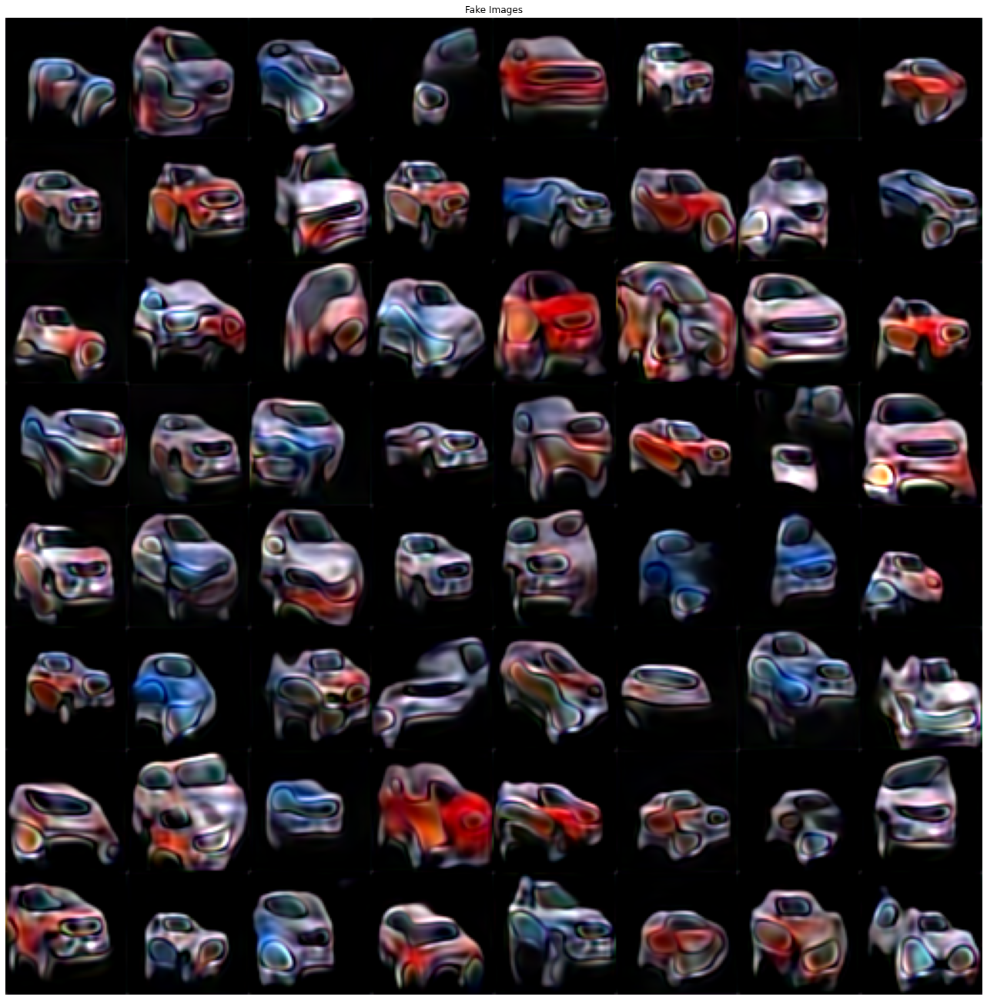

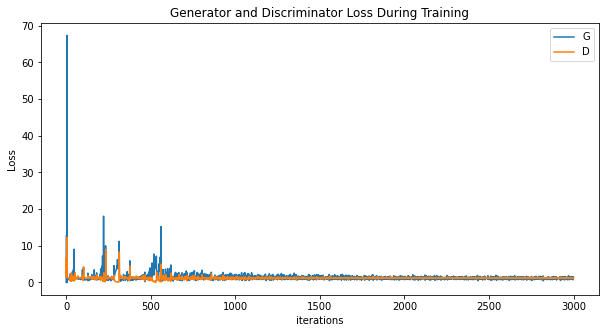

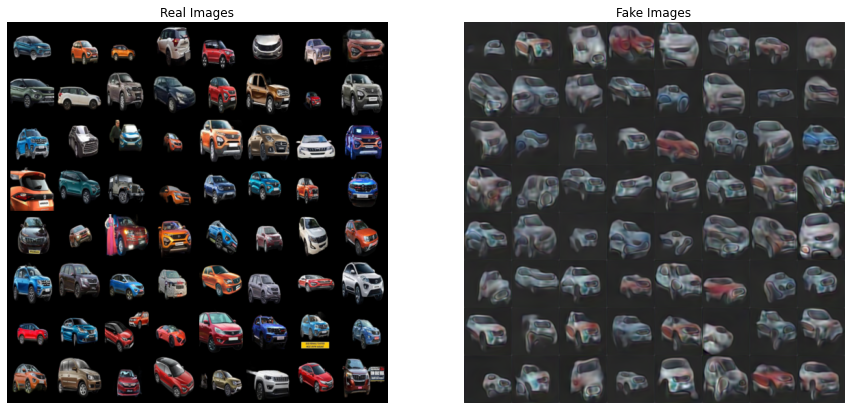

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


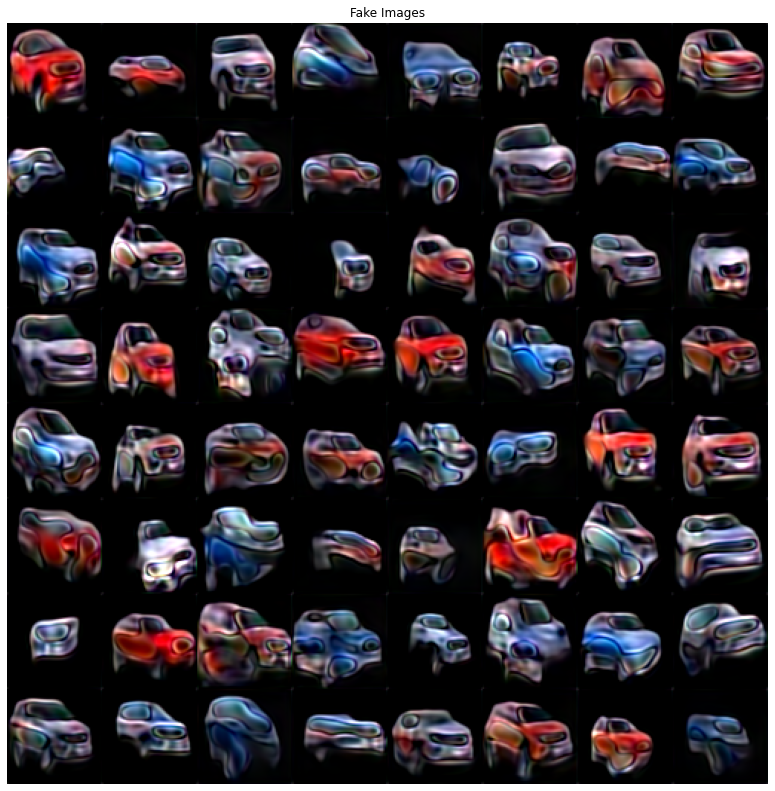

tensor([[ 0.6852, -0.7630, -0.7320,  ..., -0.4992,  0.1250,  0.7773],
        [ 0.5433,  0.4248, -0.0928,  ..., -0.4137,  0.4955,  0.7272],
        [ 0.0954, -0.7543,  0.7134,  ...,  0.7658, -0.5148,  0.0455],
        ...,
        [ 0.8642,  0.3048, -0.6784,  ..., -0.2548, -0.8364, -0.9629],
        [-0.4095,  0.4905, -0.6276,  ...,  0.6169,  0.5798, -0.2990],
        [ 0.8256, -0.8423, -0.0292,  ...,  0.9941, -0.6851, -0.0178]],
       device='cuda:0')

In [ ]:
# weights_path = "/content/ckpt/r1gan_steplr014000.pth.tar"
# checkpoint = torch.load(weights_path)
# D.load_state_dict(checkpoint['D'])
# G.load_state_dict(checkpoint['G'])
# D_opt.load_state_dict(checkpoint['d_optim'])
# G_opt.load_state_dict(checkpoint['g_optim'])



#rand_z = create_graphs_and_samples(img_list, data_loader,(50,50))

rand_z = generate_image_sample((50,50))

create_graphs_and_samples(img_list, data_loader)

In [ ]:
step_local=step
save_checkpoint({'global_step': step_local,
        'D':D.state_dict(),
        'G':G.state_dict(),
        'd_optim': D_opt.state_dict(),
        'g_optim' : G_opt.state_dict()},
    'ckpt/r1gan_adam2{:06d}.pth.tar'.format(step_local))

In [ ]:
!cp /content/ckpt/r1gan_adam2003000.pth.tar /content/drive/My\ Drive/EVA4/S2GAN/

In [ ]:
!cp /content/drive/My\ Drive/EVA4/S2GAN/r1gan_adam2003000.pth.tar /content/ckpt/r1gan_adam2003000.pth.tar 

cp: cannot stat '/content/drive/My Drive/EVA4/S2GAN/r1gan_adam2003000.pth.tar': No such file or directory


In [ ]:
!cp /content/ckpt/r1gan002800.pth.tar /content/drive/My\ Drive/EVA4/S2GAN
!cp /content/ckpt/r1gan003800.pth.tar /content/drive/My\ Drive/EVA4/S2GAN
!cp /content/ckpt/Newr1gan004651.pth.tar /content/drive/My\ Drive/EVA4/S2GAN

In [ ]:
from tqdm import tqdm_notebook as tqdm
#import tqdm.notebook.tqdm
import datetime

log_term = 10
save_term = 200
max_epoch = 200

# G_losses = []
# D_losses = []
# img_list = []

for epoch in range(max_epoch):
    for idx, images in enumerate(tqdm(data_loader, total=len(data_loader)),0):
        G.zero_grad()
        # Training Discriminator
        
        x = images.to(DEVICE)
        b_size = x.size(0)
        labels = torch.full((b_size,), 1., dtype=torch.float, device=device)

        x.requires_grad = True
        x_outputs = D(x)
        d_real_loss = r1loss(x_outputs, True)
        # Reference >> https://github.com/rosinality/style-based-gan-pytorch/blob/a3d000e707b70d1a5fc277912dc9d7432d6e6069/train.py
        # little different with original DiracGAN
        grad_real = grad(outputs=x_outputs.sum(), inputs=x, create_graph=True)[0]
        grad_penalty = (grad_real.view(grad_real.size(0), -1).norm(2, dim=1) ** 2).mean()
        grad_penalty = 0.5*r1_gamma*grad_penalty
        D_x_loss = d_real_loss + grad_penalty

        z = (torch.rand(size=[batch_size, n_noise])*2-1).to(DEVICE)
        x_fake = G(z)
        z_outputs = D(x_fake.detach())
        D_z_loss = r1loss(z_outputs, False)
        D_loss = D_x_loss + D_z_loss
        
        D.zero_grad()
        D_loss.backward()
        D_opt.step()

        # Training Generator
        z = (torch.rand(size=[batch_size, n_noise])*2-1).to(DEVICE)
        x_fake = G(z)
        z_outputs = D(x_fake)
        G_loss = r1loss(z_outputs, True)
        
        G.zero_grad()
        G_loss.backward()
        G_opt.step()
        
        G_losses.append(G_loss.item())
        D_losses.append(D_loss.item())

        if step % save_term == 0:
            save_checkpoint({'global_step': step,
                 'D':D.state_dict(),
                 'G':G.state_dict(),
                 'd_optim': D_opt.state_dict(),
                 'g_optim' : G_opt.state_dict()},
                'ckpt/r1gan{:06d}.pth.tar'.format(step))
        
        if step % log_term == 0:
            dt = datetime.datetime.now().strftime('%H:%M:%S')
            print('Epoch: {}/{}, Step: {}, D Loss: {:.4f}, G Loss: {:.4f}, gp: {:.4f}, Time:{}'.format(epoch, max_epoch, step, D_loss.item(), G_loss.item(), grad_penalty.item(), dt))
            
            # with torch.no_grad():
            #     fake = G(n_noise).detach().cpu()
            # img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            G.eval()
            img, rand_none = get_sample_image(G, n_noise, n_samples=64)
            img_data_np = img#.eval()
            min_val = np.min(img_data_np)
            max_val = np.max(img_data_np)
            img_data_clamped = (img_data_np - min_val) / (max_val - min_val)
            #img_list.append(vutils.make_grid(img, padding=2, normalize=True))
            img_list.append(img_data_clamped)
            #imsave('samples/{}_step{:06d}.jpg'.format(MODEL_NAME, step), img_data_clamped)
            G.train()
        
        step += 1
#     D_scheduler.step()
#     G_scheduler.step()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3121: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


Epoch: 0/200, Step: 3000, D Loss: 1.1662, G Loss: 1.3208, gp: 0.0903, Time:11:43:46
Epoch: 0/200, Step: 3010, D Loss: 1.2353, G Loss: 1.1620, gp: 0.0762, Time:11:43:59



Epoch: 1/200, Step: 3020, D Loss: 1.2114, G Loss: 1.4329, gp: 0.1296, Time:11:44:14



Epoch: 2/200, Step: 3030, D Loss: 1.1850, G Loss: 1.1852, gp: 0.0947, Time:11:44:29
Epoch: 2/200, Step: 3040, D Loss: 1.2471, G Loss: 0.8264, gp: 0.0379, Time:11:44:42



Epoch: 3/200, Step: 3050, D Loss: 1.1218, G Loss: 1.0805, gp: 0.1404, Time:11:44:57



Epoch: 4/200, Step: 3060, D Loss: 1.1738, G Loss: 0.7269, gp: 0.1401, Time:11:45:12
Epoch: 4/200, Step: 3070, D Loss: 1.2830, G Loss: 1.0547, gp: 0.1052, Time:11:45:25



Epoch: 5/200, Step: 3080, D Loss: 1.1789, G Loss: 1.3085, gp: 0.1020, Time:11:45:40



Epoch: 6/200, Step: 3090, D Loss: 1.1516, G Loss: 1.3170, gp: 0.1434, Time:11:45:56
Epoch: 6/200, Step: 3100, D Loss: 1.2785, G Loss: 0.9914, gp: 0.0408, Time:11:46:09



Epoch: 7/200, Step: 3110, D Loss: 1.1543, G Loss: 1.2375, gp: 0.0794, Time:11:46:24



Epoch: 8/200, Step: 3120, D Loss: 1.1720, G Loss: 1.2446, gp: 0.0998, Time:11:46:39
Epoch: 8/200, Step: 3130, D Loss: 1.1322, G Loss: 0.8357, gp: 0.0989, Time:11:46:52



Epoch: 9/200, Step: 3140, D Loss: 1.1109, G Loss: 0.8284, gp: 0.0779, Time:11:47:07



Epoch: 10/200, Step: 3150, D Loss: 1.1637, G Loss: 1.1599, gp: 0.1227, Time:11:47:22
Epoch: 10/200, Step: 3160, D Loss: 1.1974, G Loss: 0.9157, gp: 0.1162, Time:11:47:36



Epoch: 11/200, Step: 3170, D Loss: 1.1925, G Loss: 1.2516, gp: 0.1282, Time:11:47:51



Epoch: 12/200, Step: 3180, D Loss: 1.1332, G Loss: 1.2648, gp: 0.0966, Time:11:48:06
Epoch: 12/200, Step: 3190, D Loss: 1.2678, G Loss: 0.8335, gp: 0.0628, Time:11:48:19



Epoch: 13/200, Step: 3200, D Loss: 1.1919, G Loss: 0.7798, gp: 0.1003, Time:11:48:35



Epoch: 14/200, Step: 3210, D Loss: 1.2370, G Loss: 0.9582, gp: 0.1380, Time:11:48:50
Epoch: 14/200, Step: 3220, D Loss: 1.1930, G Loss: 0.8913, gp: 0.0774, Time:11:49:03



Epoch: 15/200, Step: 3230, D Loss: 1.1269, G Loss: 1.1277, gp: 0.1046, Time:11:49:18



Epoch: 16/200, Step: 3240, D Loss: 1.1237, G Loss: 1.0956, gp: 0.0758, Time:11:49:33
Epoch: 16/200, Step: 3250, D Loss: 1.3840, G Loss: 0.5977, gp: 0.1113, Time:11:49:47



Epoch: 17/200, Step: 3260, D Loss: 1.1437, G Loss: 0.8336, gp: 0.0898, Time:11:50:02



Epoch: 18/200, Step: 3270, D Loss: 1.2054, G Loss: 1.2664, gp: 0.1210, Time:11:50:17
Epoch: 18/200, Step: 3280, D Loss: 1.2657, G Loss: 1.4417, gp: 0.0873, Time:11:50:31



Epoch: 19/200, Step: 3290, D Loss: 1.2039, G Loss: 0.8024, gp: 0.1058, Time:11:50:46



Epoch: 20/200, Step: 3300, D Loss: 1.1633, G Loss: 0.9045, gp: 0.0972, Time:11:51:01
Epoch: 20/200, Step: 3310, D Loss: 1.1639, G Loss: 0.9758, gp: 0.0946, Time:11:51:14



Epoch: 21/200, Step: 3320, D Loss: 1.1820, G Loss: 1.3012, gp: 0.0891, Time:11:51:30



Epoch: 22/200, Step: 3330, D Loss: 1.1619, G Loss: 1.1765, gp: 0.1135, Time:11:51:44
Epoch: 22/200, Step: 3340, D Loss: 1.2622, G Loss: 0.7567, gp: 0.0422, Time:11:51:58



Epoch: 23/200, Step: 3350, D Loss: 1.1440, G Loss: 1.2217, gp: 0.1231, Time:11:52:13



Epoch: 24/200, Step: 3360, D Loss: 1.1727, G Loss: 1.2264, gp: 0.1031, Time:11:52:28
Epoch: 24/200, Step: 3370, D Loss: 1.2464, G Loss: 1.3224, gp: 0.0765, Time:11:52:41



Epoch: 25/200, Step: 3380, D Loss: 1.1833, G Loss: 1.1810, gp: 0.0859, Time:11:52:57



Epoch: 26/200, Step: 3390, D Loss: 1.1201, G Loss: 1.1230, gp: 0.0953, Time:11:53:12
Epoch: 26/200, Step: 3400, D Loss: 1.1642, G Loss: 1.0813, gp: 0.0917, Time:11:53:26



Epoch: 27/200, Step: 3410, D Loss: 1.1912, G Loss: 0.8063, gp: 0.0730, Time:11:53:41



Epoch: 28/200, Step: 3420, D Loss: 1.2125, G Loss: 1.0178, gp: 0.1199, Time:11:53:56
Epoch: 28/200, Step: 3430, D Loss: 1.2338, G Loss: 0.7665, gp: 0.1231, Time:11:54:09



Epoch: 29/200, Step: 3440, D Loss: 1.2024, G Loss: 1.0167, gp: 0.1010, Time:11:54:24



Epoch: 30/200, Step: 3450, D Loss: 1.1951, G Loss: 1.0661, gp: 0.0755, Time:11:54:39
Epoch: 30/200, Step: 3460, D Loss: 1.1899, G Loss: 1.1585, gp: 0.0900, Time:11:54:52



Epoch: 31/200, Step: 3470, D Loss: 1.2040, G Loss: 1.1216, gp: 0.1151, Time:11:55:08



Epoch: 32/200, Step: 3480, D Loss: 1.2258, G Loss: 1.0904, gp: 0.0743, Time:11:55:23
Epoch: 32/200, Step: 3490, D Loss: 1.1895, G Loss: 1.1343, gp: 0.1197, Time:11:55:36



Epoch: 33/200, Step: 3500, D Loss: 1.2746, G Loss: 1.3958, gp: 0.1200, Time:11:55:51



Epoch: 34/200, Step: 3510, D Loss: 1.1371, G Loss: 1.2283, gp: 0.1061, Time:11:56:06
Epoch: 34/200, Step: 3520, D Loss: 1.2551, G Loss: 1.1323, gp: 0.1110, Time:11:56:20



Epoch: 35/200, Step: 3530, D Loss: 1.2188, G Loss: 1.1650, gp: 0.0960, Time:11:56:35



Epoch: 36/200, Step: 3540, D Loss: 1.2511, G Loss: 1.3741, gp: 0.0803, Time:11:56:50
Epoch: 36/200, Step: 3550, D Loss: 1.1852, G Loss: 1.0133, gp: 0.1261, Time:11:57:04



Epoch: 37/200, Step: 3560, D Loss: 1.2111, G Loss: 1.4421, gp: 0.1134, Time:11:57:19



Epoch: 38/200, Step: 3570, D Loss: 1.1520, G Loss: 1.2910, gp: 0.1192, Time:11:57:34
Epoch: 38/200, Step: 3580, D Loss: 1.1741, G Loss: 1.4096, gp: 0.0939, Time:11:57:47



Epoch: 39/200, Step: 3590, D Loss: 1.1410, G Loss: 1.2199, gp: 0.0988, Time:11:58:02



Epoch: 40/200, Step: 3600, D Loss: 1.1658, G Loss: 1.2228, gp: 0.0857, Time:11:58:19
Epoch: 40/200, Step: 3610, D Loss: 1.1240, G Loss: 1.1998, gp: 0.1189, Time:11:58:32



Epoch: 41/200, Step: 3620, D Loss: 1.1800, G Loss: 0.9177, gp: 0.0892, Time:11:58:47



Epoch: 42/200, Step: 3630, D Loss: 1.1736, G Loss: 0.8767, gp: 0.0767, Time:11:59:02
Epoch: 42/200, Step: 3640, D Loss: 1.2474, G Loss: 1.2114, gp: 0.1045, Time:11:59:15



Epoch: 43/200, Step: 3650, D Loss: 1.1401, G Loss: 1.0254, gp: 0.1089, Time:11:59:30



Epoch: 44/200, Step: 3660, D Loss: 1.1971, G Loss: 0.8357, gp: 0.0946, Time:11:59:46
Epoch: 44/200, Step: 3670, D Loss: 1.2313, G Loss: 1.3401, gp: 0.1346, Time:11:59:59



Epoch: 45/200, Step: 3680, D Loss: 1.2039, G Loss: 1.0525, gp: 0.1079, Time:12:00:14



Epoch: 46/200, Step: 3690, D Loss: 1.2526, G Loss: 1.2083, gp: 0.0938, Time:12:00:29
Epoch: 46/200, Step: 3700, D Loss: 1.2797, G Loss: 1.1682, gp: 0.1442, Time:12:00:43



Epoch: 47/200, Step: 3710, D Loss: 1.1763, G Loss: 1.1482, gp: 0.1324, Time:12:00:58



Epoch: 48/200, Step: 3720, D Loss: 1.1600, G Loss: 1.0901, gp: 0.0803, Time:12:01:13
Epoch: 48/200, Step: 3730, D Loss: 1.2356, G Loss: 0.7650, gp: 0.1095, Time:12:01:26



Epoch: 49/200, Step: 3740, D Loss: 1.1675, G Loss: 1.0653, gp: 0.1158, Time:12:01:42



Epoch: 50/200, Step: 3750, D Loss: 1.1650, G Loss: 0.9162, gp: 0.0888, Time:12:01:57
Epoch: 50/200, Step: 3760, D Loss: 1.2525, G Loss: 0.9856, gp: 0.1095, Time:12:02:10



Epoch: 51/200, Step: 3770, D Loss: 1.2093, G Loss: 0.9758, gp: 0.1084, Time:12:02:26



Epoch: 52/200, Step: 3780, D Loss: 1.2942, G Loss: 1.6147, gp: 0.1168, Time:12:02:41
Epoch: 52/200, Step: 3790, D Loss: 1.2541, G Loss: 1.1379, gp: 0.0881, Time:12:02:54



Epoch: 53/200, Step: 3800, D Loss: 1.4194, G Loss: 0.6659, gp: 0.1117, Time:12:03:10



Epoch: 54/200, Step: 3810, D Loss: 1.2528, G Loss: 0.9569, gp: 0.0912, Time:12:03:25
Epoch: 54/200, Step: 3820, D Loss: 1.2078, G Loss: 1.3811, gp: 0.0903, Time:12:03:38



Epoch: 55/200, Step: 3830, D Loss: 1.1504, G Loss: 1.2307, gp: 0.1052, Time:12:03:54



Epoch: 56/200, Step: 3840, D Loss: 1.1925, G Loss: 1.2704, gp: 0.1021, Time:12:04:09
Epoch: 56/200, Step: 3850, D Loss: 1.2130, G Loss: 1.2903, gp: 0.0908, Time:12:04:22



Epoch: 57/200, Step: 3860, D Loss: 1.1071, G Loss: 1.3881, gp: 0.1095, Time:12:04:37



Epoch: 58/200, Step: 3870, D Loss: 1.1852, G Loss: 1.1627, gp: 0.1023, Time:12:04:52
Epoch: 58/200, Step: 3880, D Loss: 1.2560, G Loss: 1.2708, gp: 0.1032, Time:12:05:06



Epoch: 59/200, Step: 3890, D Loss: 1.1374, G Loss: 1.0694, gp: 0.0975, Time:12:05:21



Epoch: 60/200, Step: 3900, D Loss: 1.1985, G Loss: 1.0465, gp: 0.1185, Time:12:05:36
Epoch: 60/200, Step: 3910, D Loss: 1.2397, G Loss: 1.1981, gp: 0.1069, Time:12:05:49



Epoch: 61/200, Step: 3920, D Loss: 1.1870, G Loss: 1.2252, gp: 0.0970, Time:12:06:04



Epoch: 62/200, Step: 3930, D Loss: 1.1439, G Loss: 1.2542, gp: 0.1041, Time:12:06:19
Epoch: 62/200, Step: 3940, D Loss: 1.2374, G Loss: 1.2077, gp: 0.1044, Time:12:06:32



Epoch: 63/200, Step: 3950, D Loss: 1.1662, G Loss: 1.3367, gp: 0.1080, Time:12:06:47



Epoch: 64/200, Step: 3960, D Loss: 1.2703, G Loss: 1.1484, gp: 0.0661, Time:12:07:02
Epoch: 64/200, Step: 3970, D Loss: 1.2104, G Loss: 1.2920, gp: 0.0982, Time:12:07:16



Epoch: 65/200, Step: 3980, D Loss: 1.1221, G Loss: 1.2937, gp: 0.1169, Time:12:07:31



Epoch: 66/200, Step: 3990, D Loss: 1.1744, G Loss: 1.3330, gp: 0.1047, Time:12:07:46
Epoch: 66/200, Step: 4000, D Loss: 1.3185, G Loss: 0.7122, gp: 0.0966, Time:12:08:00



Epoch: 67/200, Step: 4010, D Loss: 1.1605, G Loss: 1.0745, gp: 0.1058, Time:12:08:15



Epoch: 68/200, Step: 4020, D Loss: 1.2470, G Loss: 1.1806, gp: 0.0709, Time:12:08:30
Epoch: 68/200, Step: 4030, D Loss: 1.1912, G Loss: 1.1303, gp: 0.0737, Time:12:08:44



Epoch: 69/200, Step: 4040, D Loss: 1.1689, G Loss: 0.9844, gp: 0.1279, Time:12:08:59



Epoch: 70/200, Step: 4050, D Loss: 1.2195, G Loss: 0.9031, gp: 0.1195, Time:12:09:14
Epoch: 70/200, Step: 4060, D Loss: 1.3676, G Loss: 1.5470, gp: 0.1171, Time:12:09:27



Epoch: 71/200, Step: 4070, D Loss: 1.2087, G Loss: 1.2800, gp: 0.1040, Time:12:09:42



Epoch: 72/200, Step: 4080, D Loss: 1.2047, G Loss: 1.2681, gp: 0.1080, Time:12:09:58
Epoch: 72/200, Step: 4090, D Loss: 1.1767, G Loss: 1.0499, gp: 0.1126, Time:12:10:11



Epoch: 73/200, Step: 4100, D Loss: 1.1564, G Loss: 1.1840, gp: 0.0947, Time:12:10:26



Epoch: 74/200, Step: 4110, D Loss: 1.1399, G Loss: 1.0475, gp: 0.1059, Time:12:10:41
Epoch: 74/200, Step: 4120, D Loss: 1.2526, G Loss: 1.1407, gp: 0.0706, Time:12:10:54



Epoch: 75/200, Step: 4130, D Loss: 1.2177, G Loss: 1.2135, gp: 0.1046, Time:12:11:10



Epoch: 76/200, Step: 4140, D Loss: 1.2379, G Loss: 1.1866, gp: 0.1118, Time:12:11:25
Epoch: 76/200, Step: 4150, D Loss: 1.1732, G Loss: 1.2056, gp: 0.1127, Time:12:11:38



Epoch: 77/200, Step: 4160, D Loss: 1.1646, G Loss: 1.2330, gp: 0.1128, Time:12:11:53



Epoch: 78/200, Step: 4170, D Loss: 1.1833, G Loss: 0.8686, gp: 0.1186, Time:12:12:08
Epoch: 78/200, Step: 4180, D Loss: 1.1034, G Loss: 1.0032, gp: 0.1125, Time:12:12:21



Epoch: 79/200, Step: 4190, D Loss: 1.1643, G Loss: 0.8686, gp: 0.0936, Time:12:12:37



Epoch: 80/200, Step: 4200, D Loss: 1.1664, G Loss: 0.8842, gp: 0.0891, Time:12:12:53
Epoch: 80/200, Step: 4210, D Loss: 1.2215, G Loss: 1.1067, gp: 0.1233, Time:12:13:06



Epoch: 81/200, Step: 4220, D Loss: 1.3017, G Loss: 1.1441, gp: 0.0635, Time:12:13:22



Epoch: 82/200, Step: 4230, D Loss: 1.1554, G Loss: 1.2952, gp: 0.1034, Time:12:13:37
Epoch: 82/200, Step: 4240, D Loss: 1.1992, G Loss: 1.2376, gp: 0.1022, Time:12:13:50



Epoch: 83/200, Step: 4250, D Loss: 1.1870, G Loss: 1.0900, gp: 0.1168, Time:12:14:05



Epoch: 84/200, Step: 4260, D Loss: 1.2648, G Loss: 1.3139, gp: 0.0888, Time:12:14:20
Epoch: 84/200, Step: 4270, D Loss: 1.2162, G Loss: 1.3435, gp: 0.1240, Time:12:14:33



Epoch: 85/200, Step: 4280, D Loss: 1.1562, G Loss: 1.2326, gp: 0.1089, Time:12:14:49



Epoch: 86/200, Step: 4290, D Loss: 1.2414, G Loss: 0.8814, gp: 0.1056, Time:12:15:04
Epoch: 86/200, Step: 4300, D Loss: 1.1829, G Loss: 1.3267, gp: 0.1210, Time:12:15:17



Epoch: 87/200, Step: 4310, D Loss: 1.1679, G Loss: 1.2715, gp: 0.1006, Time:12:15:32



Epoch: 88/200, Step: 4320, D Loss: 1.1592, G Loss: 0.9725, gp: 0.1064, Time:12:15:47
Epoch: 88/200, Step: 4330, D Loss: 1.2103, G Loss: 0.9006, gp: 0.1090, Time:12:16:01



Epoch: 89/200, Step: 4340, D Loss: 1.2449, G Loss: 0.7935, gp: 0.1019, Time:12:16:16



Epoch: 90/200, Step: 4350, D Loss: 1.1949, G Loss: 1.0220, gp: 0.1170, Time:12:16:31
Epoch: 90/200, Step: 4360, D Loss: 1.1821, G Loss: 1.4149, gp: 0.1064, Time:12:16:44



Epoch: 91/200, Step: 4370, D Loss: 1.1332, G Loss: 1.1164, gp: 0.1038, Time:12:16:59



Epoch: 92/200, Step: 4380, D Loss: 1.2822, G Loss: 0.6640, gp: 0.0560, Time:12:17:15
Epoch: 92/200, Step: 4390, D Loss: 1.1794, G Loss: 1.1622, gp: 0.1059, Time:12:17:28



Epoch: 93/200, Step: 4400, D Loss: 1.1307, G Loss: 1.0897, gp: 0.1336, Time:12:17:44



Epoch: 94/200, Step: 4410, D Loss: 1.1271, G Loss: 0.8933, gp: 0.1063, Time:12:18:00
Epoch: 94/200, Step: 4420, D Loss: 1.2404, G Loss: 0.8766, gp: 0.1235, Time:12:18:13



Epoch: 95/200, Step: 4430, D Loss: 1.1839, G Loss: 0.9972, gp: 0.1052, Time:12:18:28



Epoch: 96/200, Step: 4440, D Loss: 1.1913, G Loss: 0.9094, gp: 0.0952, Time:12:18:43
Epoch: 96/200, Step: 4450, D Loss: 1.2470, G Loss: 1.6434, gp: 0.1346, Time:12:18:57



Epoch: 97/200, Step: 4460, D Loss: 1.1341, G Loss: 1.1412, gp: 0.1146, Time:12:19:12



Epoch: 98/200, Step: 4470, D Loss: 1.1887, G Loss: 1.0704, gp: 0.0919, Time:12:19:27
Epoch: 98/200, Step: 4480, D Loss: 1.1602, G Loss: 1.1640, gp: 0.1037, Time:12:19:40



Epoch: 99/200, Step: 4490, D Loss: 1.2146, G Loss: 0.6735, gp: 0.1136, Time:12:19:55



Epoch: 100/200, Step: 4500, D Loss: 1.1682, G Loss: 1.0962, gp: 0.1147, Time:12:20:10
Epoch: 100/200, Step: 4510, D Loss: 1.1926, G Loss: 0.8475, gp: 0.1210, Time:12:20:23



Epoch: 101/200, Step: 4520, D Loss: 1.1630, G Loss: 0.8822, gp: 0.0990, Time:12:20:39



Epoch: 102/200, Step: 4530, D Loss: 1.1685, G Loss: 1.3501, gp: 0.1219, Time:12:20:54
Epoch: 102/200, Step: 4540, D Loss: 1.1796, G Loss: 1.0877, gp: 0.0972, Time:12:21:07



Epoch: 103/200, Step: 4550, D Loss: 1.2627, G Loss: 1.1493, gp: 0.0771, Time:12:21:22



Epoch: 104/200, Step: 4560, D Loss: 1.1274, G Loss: 1.1174, gp: 0.1141, Time:12:21:37
Epoch: 104/200, Step: 4570, D Loss: 1.1510, G Loss: 0.8636, gp: 0.0899, Time:12:21:51



Epoch: 105/200, Step: 4580, D Loss: 1.2008, G Loss: 0.8439, gp: 0.0879, Time:12:22:06



Epoch: 106/200, Step: 4590, D Loss: 1.2232, G Loss: 1.0578, gp: 0.1179, Time:12:22:21
Epoch: 106/200, Step: 4600, D Loss: 1.1863, G Loss: 1.0801, gp: 0.1048, Time:12:22:35



Epoch: 107/200, Step: 4610, D Loss: 1.2292, G Loss: 0.8793, gp: 0.1059, Time:12:22:50



Epoch: 108/200, Step: 4620, D Loss: 1.2165, G Loss: 0.7545, gp: 0.1114, Time:12:23:05
Epoch: 108/200, Step: 4630, D Loss: 1.2249, G Loss: 1.0178, gp: 0.1249, Time:12:23:18



Epoch: 109/200, Step: 4640, D Loss: 1.2405, G Loss: 0.8535, gp: 0.1098, Time:12:23:33



Epoch: 110/200, Step: 4650, D Loss: 1.1849, G Loss: 1.3733, gp: 0.1205, Time:12:23:48
Epoch: 110/200, Step: 4660, D Loss: 1.2093, G Loss: 1.1029, gp: 0.0856, Time:12:24:01



Epoch: 111/200, Step: 4670, D Loss: 1.1905, G Loss: 1.1469, gp: 0.1110, Time:12:24:16



Epoch: 112/200, Step: 4680, D Loss: 1.1881, G Loss: 1.1060, gp: 0.0728, Time:12:24:32
Epoch: 112/200, Step: 4690, D Loss: 1.2385, G Loss: 1.1868, gp: 0.1213, Time:12:24:45



Epoch: 113/200, Step: 4700, D Loss: 1.2326, G Loss: 1.2635, gp: 0.1106, Time:12:25:00



Epoch: 114/200, Step: 4710, D Loss: 1.2292, G Loss: 1.0909, gp: 0.0900, Time:12:25:15
Epoch: 114/200, Step: 4720, D Loss: 1.1602, G Loss: 1.0660, gp: 0.1123, Time:12:25:28



Epoch: 115/200, Step: 4730, D Loss: 1.1472, G Loss: 0.9233, gp: 0.0948, Time:12:25:43



Epoch: 116/200, Step: 4740, D Loss: 1.1281, G Loss: 1.0993, gp: 0.1156, Time:12:25:58
Epoch: 116/200, Step: 4750, D Loss: 1.2244, G Loss: 1.2434, gp: 0.1127, Time:12:26:12



Epoch: 117/200, Step: 4760, D Loss: 1.2010, G Loss: 1.2533, gp: 0.1146, Time:12:26:26



Epoch: 118/200, Step: 4770, D Loss: 1.2506, G Loss: 1.3320, gp: 0.1023, Time:12:26:41
Epoch: 118/200, Step: 4780, D Loss: 1.2037, G Loss: 1.2344, gp: 0.1034, Time:12:26:55



Epoch: 119/200, Step: 4790, D Loss: 1.2068, G Loss: 1.0726, gp: 0.1173, Time:12:27:10



Epoch: 120/200, Step: 4800, D Loss: 1.3185, G Loss: 1.2847, gp: 0.0963, Time:12:27:27
Epoch: 120/200, Step: 4810, D Loss: 1.2240, G Loss: 1.2461, gp: 0.0946, Time:12:27:40



Epoch: 121/200, Step: 4820, D Loss: 1.2337, G Loss: 1.2016, gp: 0.1023, Time:12:27:55



Epoch: 122/200, Step: 4830, D Loss: 1.1905, G Loss: 1.3084, gp: 0.1059, Time:12:28:10
Epoch: 122/200, Step: 4840, D Loss: 1.1552, G Loss: 1.1573, gp: 0.0979, Time:12:28:24



Epoch: 123/200, Step: 4850, D Loss: 1.2038, G Loss: 1.2225, gp: 0.1180, Time:12:28:39



Epoch: 124/200, Step: 4860, D Loss: 1.2207, G Loss: 1.2709, gp: 0.0992, Time:12:28:54
Epoch: 124/200, Step: 4870, D Loss: 1.2940, G Loss: 0.7429, gp: 0.1370, Time:12:29:08



Epoch: 125/200, Step: 4880, D Loss: 1.1970, G Loss: 0.8349, gp: 0.1170, Time:12:29:23



Epoch: 126/200, Step: 4890, D Loss: 1.1472, G Loss: 0.9435, gp: 0.1207, Time:12:29:38
Epoch: 126/200, Step: 4900, D Loss: 1.1733, G Loss: 1.2008, gp: 0.1186, Time:12:29:51



Epoch: 127/200, Step: 4910, D Loss: 1.1663, G Loss: 1.2854, gp: 0.1054, Time:12:30:06



Epoch: 128/200, Step: 4920, D Loss: 1.1879, G Loss: 1.1981, gp: 0.1112, Time:12:30:21
Epoch: 128/200, Step: 4930, D Loss: 1.2585, G Loss: 1.3035, gp: 0.0787, Time:12:30:35



Epoch: 129/200, Step: 4940, D Loss: 1.1988, G Loss: 1.2522, gp: 0.1221, Time:12:30:50



Epoch: 130/200, Step: 4950, D Loss: 1.1924, G Loss: 1.2468, gp: 0.1077, Time:12:31:05
Epoch: 130/200, Step: 4960, D Loss: 1.1674, G Loss: 1.2525, gp: 0.1253, Time:12:31:18



Epoch: 131/200, Step: 4970, D Loss: 1.2299, G Loss: 1.2272, gp: 0.0903, Time:12:31:34



Epoch: 132/200, Step: 4980, D Loss: 1.2319, G Loss: 1.1913, gp: 0.0836, Time:12:31:49
Epoch: 132/200, Step: 4990, D Loss: 1.1653, G Loss: 1.1962, gp: 0.1205, Time:12:32:02



Epoch: 133/200, Step: 5000, D Loss: 1.1924, G Loss: 1.2401, gp: 0.1163, Time:12:32:18



Epoch: 134/200, Step: 5010, D Loss: 1.1804, G Loss: 1.1318, gp: 0.0933, Time:12:32:33
Epoch: 134/200, Step: 5020, D Loss: 1.2206, G Loss: 0.9093, gp: 0.1111, Time:12:32:47



Epoch: 135/200, Step: 5030, D Loss: 1.1951, G Loss: 0.8782, gp: 0.1282, Time:12:33:02



Epoch: 136/200, Step: 5040, D Loss: 1.1364, G Loss: 0.9692, gp: 0.1089, Time:12:33:17
Epoch: 136/200, Step: 5050, D Loss: 1.1908, G Loss: 0.8472, gp: 0.1048, Time:12:33:30



Epoch: 137/200, Step: 5060, D Loss: 1.1877, G Loss: 0.8581, gp: 0.1338, Time:12:33:45



Epoch: 138/200, Step: 5070, D Loss: 1.1134, G Loss: 0.9041, gp: 0.1160, Time:12:34:01
Epoch: 138/200, Step: 5080, D Loss: 1.1495, G Loss: 1.1718, gp: 0.1244, Time:12:34:14



Epoch: 139/200, Step: 5090, D Loss: 1.1856, G Loss: 0.7792, gp: 0.1071, Time:12:34:30



Epoch: 140/200, Step: 5100, D Loss: 1.1554, G Loss: 0.9703, gp: 0.1082, Time:12:34:45
Epoch: 140/200, Step: 5110, D Loss: 1.1708, G Loss: 0.8659, gp: 0.1097, Time:12:34:58



Epoch: 141/200, Step: 5120, D Loss: 1.2005, G Loss: 0.8476, gp: 0.1365, Time:12:35:13



Epoch: 142/200, Step: 5130, D Loss: 1.1376, G Loss: 0.9714, gp: 0.1171, Time:12:35:28
Epoch: 142/200, Step: 5140, D Loss: 1.2385, G Loss: 0.7420, gp: 0.1123, Time:12:35:42



Epoch: 143/200, Step: 5150, D Loss: 1.1659, G Loss: 1.3513, gp: 0.1127, Time:12:35:57



Epoch: 144/200, Step: 5160, D Loss: 1.0881, G Loss: 1.1257, gp: 0.1068, Time:12:36:12
Epoch: 144/200, Step: 5170, D Loss: 1.4052, G Loss: 0.5697, gp: 0.1231, Time:12:36:25



Epoch: 145/200, Step: 5180, D Loss: 1.1208, G Loss: 1.2004, gp: 0.1126, Time:12:36:41



Epoch: 146/200, Step: 5190, D Loss: 1.1976, G Loss: 1.3100, gp: 0.1172, Time:12:36:56
Epoch: 146/200, Step: 5200, D Loss: 1.1595, G Loss: 1.1337, gp: 0.1178, Time:12:37:10



Epoch: 147/200, Step: 5210, D Loss: 1.1446, G Loss: 0.9130, gp: 0.1505, Time:12:37:26



Epoch: 148/200, Step: 5220, D Loss: 1.1912, G Loss: 0.8384, gp: 0.0974, Time:12:37:41
Epoch: 148/200, Step: 5230, D Loss: 1.2076, G Loss: 0.9289, gp: 0.1313, Time:12:37:54



Epoch: 149/200, Step: 5240, D Loss: 1.1558, G Loss: 1.2526, gp: 0.1269, Time:12:38:09



Epoch: 150/200, Step: 5250, D Loss: 1.1079, G Loss: 1.1119, gp: 0.1211, Time:12:38:24
Epoch: 150/200, Step: 5260, D Loss: 1.2010, G Loss: 1.1097, gp: 0.0879, Time:12:38:38



Epoch: 151/200, Step: 5270, D Loss: 1.1243, G Loss: 1.1217, gp: 0.1113, Time:12:38:53



Epoch: 152/200, Step: 5280, D Loss: 1.1843, G Loss: 1.1367, gp: 0.1348, Time:12:39:08
Epoch: 152/200, Step: 5290, D Loss: 1.1236, G Loss: 0.8779, gp: 0.1036, Time:12:39:21



Epoch: 153/200, Step: 5300, D Loss: 1.1968, G Loss: 0.7359, gp: 0.1414, Time:12:39:37



Epoch: 154/200, Step: 5310, D Loss: 1.1895, G Loss: 1.1456, gp: 0.1498, Time:12:39:53
Epoch: 154/200, Step: 5320, D Loss: 1.2164, G Loss: 1.3593, gp: 0.1264, Time:12:40:06



Epoch: 155/200, Step: 5330, D Loss: 1.1701, G Loss: 1.2467, gp: 0.1126, Time:12:40:21



Epoch: 156/200, Step: 5340, D Loss: 1.1256, G Loss: 1.2004, gp: 0.1178, Time:12:40:36
Epoch: 156/200, Step: 5350, D Loss: 1.2105, G Loss: 1.2200, gp: 0.0955, Time:12:40:49



Epoch: 157/200, Step: 5360, D Loss: 1.1712, G Loss: 0.8551, gp: 0.1027, Time:12:41:05



Epoch: 158/200, Step: 5370, D Loss: 1.1434, G Loss: 0.9285, gp: 0.1226, Time:12:41:20
Epoch: 158/200, Step: 5380, D Loss: 1.1939, G Loss: 0.8049, gp: 0.1087, Time:12:41:33



Epoch: 159/200, Step: 5390, D Loss: 1.2788, G Loss: 1.4403, gp: 0.1183, Time:12:41:48



Epoch: 160/200, Step: 5400, D Loss: 1.1470, G Loss: 1.2591, gp: 0.1110, Time:12:42:04
Epoch: 160/200, Step: 5410, D Loss: 1.1362, G Loss: 1.2222, gp: 0.1080, Time:12:42:17



Epoch: 161/200, Step: 5420, D Loss: 1.1642, G Loss: 1.2851, gp: 0.1210, Time:12:42:33



Epoch: 162/200, Step: 5430, D Loss: 1.1672, G Loss: 0.8708, gp: 0.1338, Time:12:42:47
Epoch: 162/200, Step: 5440, D Loss: 1.1796, G Loss: 0.8908, gp: 0.1093, Time:12:43:01



Epoch: 163/200, Step: 5450, D Loss: 1.2040, G Loss: 0.7212, gp: 0.1147, Time:12:43:16



Epoch: 164/200, Step: 5460, D Loss: 1.2564, G Loss: 0.8268, gp: 0.0975, Time:12:43:31
Epoch: 164/200, Step: 5470, D Loss: 1.2183, G Loss: 0.7829, gp: 0.1232, Time:12:43:44



Epoch: 165/200, Step: 5480, D Loss: 1.1560, G Loss: 0.9235, gp: 0.1276, Time:12:43:59



Epoch: 166/200, Step: 5490, D Loss: 1.1172, G Loss: 1.3025, gp: 0.1388, Time:12:44:14
Epoch: 166/200, Step: 5500, D Loss: 1.1963, G Loss: 1.1604, gp: 0.1034, Time:12:44:28



Epoch: 167/200, Step: 5510, D Loss: 1.2683, G Loss: 1.4335, gp: 0.1339, Time:12:44:43



Epoch: 168/200, Step: 5520, D Loss: 1.1930, G Loss: 0.7785, gp: 0.1419, Time:12:44:58
Epoch: 168/200, Step: 5530, D Loss: 1.1757, G Loss: 0.9023, gp: 0.1294, Time:12:45:11



Epoch: 169/200, Step: 5540, D Loss: 1.1975, G Loss: 1.4269, gp: 0.1245, Time:12:45:26



Epoch: 170/200, Step: 5550, D Loss: 1.0855, G Loss: 1.2472, gp: 0.1094, Time:12:45:41
Epoch: 170/200, Step: 5560, D Loss: 1.1748, G Loss: 1.1728, gp: 0.1274, Time:12:45:54



Epoch: 171/200, Step: 5570, D Loss: 1.2231, G Loss: 1.1777, gp: 0.1216, Time:12:46:10



Epoch: 172/200, Step: 5580, D Loss: 1.1700, G Loss: 1.2329, gp: 0.1109, Time:12:46:25
Epoch: 172/200, Step: 5590, D Loss: 1.0692, G Loss: 1.2335, gp: 0.1536, Time:12:46:38



Epoch: 173/200, Step: 5600, D Loss: 1.1276, G Loss: 1.3130, gp: 0.1113, Time:12:46:54



Epoch: 174/200, Step: 5610, D Loss: 1.2552, G Loss: 1.1730, gp: 0.1240, Time:12:47:09
Epoch: 174/200, Step: 5620, D Loss: 1.1653, G Loss: 1.3842, gp: 0.1325, Time:12:47:22



Epoch: 175/200, Step: 5630, D Loss: 1.1324, G Loss: 1.3266, gp: 0.1225, Time:12:47:37



Epoch: 176/200, Step: 5640, D Loss: 1.1385, G Loss: 1.3144, gp: 0.1263, Time:12:47:52
Epoch: 176/200, Step: 5650, D Loss: 1.1610, G Loss: 1.5058, gp: 0.1398, Time:12:48:05



Epoch: 177/200, Step: 5660, D Loss: 1.1208, G Loss: 1.1126, gp: 0.1224, Time:12:48:20



Epoch: 178/200, Step: 5670, D Loss: 1.2498, G Loss: 1.4268, gp: 0.1148, Time:12:48:36
Epoch: 178/200, Step: 5680, D Loss: 1.1201, G Loss: 1.2409, gp: 0.1304, Time:12:48:49



Epoch: 179/200, Step: 5690, D Loss: 1.1748, G Loss: 1.5307, gp: 0.1271, Time:12:49:04



Epoch: 180/200, Step: 5700, D Loss: 1.1950, G Loss: 1.3248, gp: 0.0943, Time:12:49:19
Epoch: 180/200, Step: 5710, D Loss: 1.0884, G Loss: 1.0692, gp: 0.1337, Time:12:49:33



Epoch: 181/200, Step: 5720, D Loss: 1.1858, G Loss: 1.2824, gp: 0.1101, Time:12:49:48



Epoch: 182/200, Step: 5730, D Loss: 1.1642, G Loss: 1.5368, gp: 0.1386, Time:12:50:03
Epoch: 182/200, Step: 5740, D Loss: 1.2201, G Loss: 1.3759, gp: 0.1324, Time:12:50:16



Epoch: 183/200, Step: 5750, D Loss: 1.2160, G Loss: 1.2856, gp: 0.1080, Time:12:50:31



Epoch: 184/200, Step: 5760, D Loss: 1.0893, G Loss: 1.2279, gp: 0.1199, Time:12:50:47
Epoch: 184/200, Step: 5770, D Loss: 1.0881, G Loss: 1.0781, gp: 0.1315, Time:12:51:00



Epoch: 185/200, Step: 5780, D Loss: 1.1743, G Loss: 0.8256, gp: 0.1226, Time:12:51:15



Epoch: 186/200, Step: 5790, D Loss: 1.1557, G Loss: 0.9185, gp: 0.1190, Time:12:51:30
Epoch: 186/200, Step: 5800, D Loss: 1.1357, G Loss: 1.4894, gp: 0.1318, Time:12:51:44



Epoch: 187/200, Step: 5810, D Loss: 1.1493, G Loss: 1.2191, gp: 0.1096, Time:12:51:59



Epoch: 188/200, Step: 5820, D Loss: 1.1854, G Loss: 1.4637, gp: 0.1197, Time:12:52:14
Epoch: 188/200, Step: 5830, D Loss: 1.1337, G Loss: 1.2293, gp: 0.1253, Time:12:52:28



Epoch: 189/200, Step: 5840, D Loss: 1.1278, G Loss: 1.2315, gp: 0.1274, Time:12:52:43



Epoch: 190/200, Step: 5850, D Loss: 1.1269, G Loss: 1.2619, gp: 0.1256, Time:12:52:58
Epoch: 190/200, Step: 5860, D Loss: 1.1123, G Loss: 1.2087, gp: 0.1281, Time:12:53:11



Epoch: 191/200, Step: 5870, D Loss: 1.1406, G Loss: 1.3645, gp: 0.1235, Time:12:53:27



Epoch: 192/200, Step: 5880, D Loss: 1.1191, G Loss: 0.9729, gp: 0.1288, Time:12:53:42
Epoch: 192/200, Step: 5890, D Loss: 1.2049, G Loss: 0.8464, gp: 0.1424, Time:12:53:55



Epoch: 193/200, Step: 5900, D Loss: 1.1324, G Loss: 0.9024, gp: 0.1373, Time:12:54:10



Epoch: 194/200, Step: 5910, D Loss: 1.1623, G Loss: 0.8986, gp: 0.1259, Time:12:54:25
Epoch: 194/200, Step: 5920, D Loss: 1.1160, G Loss: 1.0290, gp: 0.1245, Time:12:54:38



Epoch: 195/200, Step: 5930, D Loss: 1.1421, G Loss: 1.3179, gp: 0.1249, Time:12:54:54



Epoch: 196/200, Step: 5940, D Loss: 1.1190, G Loss: 1.3994, gp: 0.1465, Time:12:55:09
Epoch: 196/200, Step: 5950, D Loss: 1.1480, G Loss: 1.2167, gp: 0.1219, Time:12:55:22



Epoch: 197/200, Step: 5960, D Loss: 1.1562, G Loss: 1.2600, gp: 0.1175, Time:12:55:37



Epoch: 198/200, Step: 5970, D Loss: 1.1161, G Loss: 1.1585, gp: 0.1040, Time:12:55:52
Epoch: 198/200, Step: 5980, D Loss: 1.1391, G Loss: 1.4707, gp: 0.1384, Time:12:56:06



Epoch: 199/200, Step: 5990, D Loss: 1.1182, G Loss: 1.0898, gp: 0.1270, Time:12:56:21



In [ ]:
#### Epoch: 199/200, Step: 2990, D Loss: 1.1744, G Loss: 1.4858, gp: 0.1405, Time:17:40:12


(64, 64, 3)

In [ ]:
import torchvision.utils as vutils

plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()


real_batch = next(iter(data_loader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch.to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
# plt.subplot(1,2,2)
# plt.axis("off")
# plt.title("Fake Images")
# plt.imshow(np.transpose(img_list[-1],(1,2,0)))
# plt.show()

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.array(img_list[-1]))#np.transpose(np.array(img_list[-1]),(1,2,0)))
plt.show()

output_images = get_sample_image(G, n_noise=n_noise, n_samples=64)
#output_images_list = vutils.make_grid(output_images, padding=2, normalize=True)

# img_data_np = output_images#.eval()
# min_val = np.min(img_data_np)
# max_val = np.max(img_data_np)
# img_data_clamped = (img_data_np - min_val) / (max_val - min_val)
plt.figure(figsize=(50,50))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
#plt.imshow(np.transpose(output_images_list,(1,2,0)))
plt.imshow(np.array(output_images))
plt.show()

In [ ]:

#new_noise = torch.rand(64*n_noise)
#new_noise = new_noise.reshape((64,n_noise,1,1))
weights_path = "/content/ckpt/r1gan000200.pth.tar"
checkpoint = torch.load(weights_path)
D.load_state_dict(checkpoint['D'])
G.load_state_dict(checkpoint['G'])
D_opt.load_state_dict(checkpoint['d_optim'])
G_opt.load_state_dict(checkpoint['g_optim'])
#with torch.no_grad():
#    output_images = netG(new_noise.to(DEVICE))
G.eval()
output_images = get_sample_image(G, n_noise=n_noise, n_samples=64)
#output_images_list = vutils.make_grid(output_images, padding=2, normalize=True)

# img_data_np = output_images#.eval()
# min_val = np.min(img_data_np)
# max_val = np.max(img_data_np)
# img_data_clamped = (img_data_np - min_val) / (max_val - min_val)
plt.figure(figsize=(50,50))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
#plt.imshow(np.transpose(output_images_list,(1,2,0)))
plt.imshow(np.array(output_images))
plt.show()

In [ ]:
from tqdm import tqdm_notebook as tqdm
#import tqdm.notebook.tqdm
import datetime

log_term = 10
save_term = 200
max_epoch = 200

# G_losses = []
# D_losses = []
# img_list = []

for epoch in range(max_epoch):
    for idx, images in enumerate(tqdm(data_loader, total=len(data_loader)),0):
        G.zero_grad()
        # Training Discriminator
        
        x = images.to(DEVICE)
        b_size = x.size(0)
        labels = torch.full((b_size,), 1., dtype=torch.float, device=device)

        x.requires_grad = True
        x_outputs = D(x)
        d_real_loss = r1loss(x_outputs, True)
        # Reference >> https://github.com/rosinality/style-based-gan-pytorch/blob/a3d000e707b70d1a5fc277912dc9d7432d6e6069/train.py
        # little different with original DiracGAN
        grad_real = grad(outputs=x_outputs.sum(), inputs=x, create_graph=True)[0]
        grad_penalty = (grad_real.view(grad_real.size(0), -1).norm(2, dim=1) ** 2).mean()
        grad_penalty = 0.5*r1_gamma*grad_penalty
        D_x_loss = d_real_loss + grad_penalty

        z = (torch.rand(size=[batch_size, n_noise])*2-1).to(DEVICE)
        x_fake = G(z)
        z_outputs = D(x_fake.detach())
        D_z_loss = r1loss(z_outputs, False)
        D_loss = D_x_loss + D_z_loss
        
        D.zero_grad()
        D_loss.backward()
        D_opt.step()

        # Training Generator
        z = (torch.rand(size=[batch_size, n_noise])*2-1).to(DEVICE)
        x_fake = G(z)
        z_outputs = D(x_fake)
        G_loss = r1loss(z_outputs, True)
        
        G.zero_grad()
        G_loss.backward()
        G_opt.step()
        
        G_losses.append(G_loss.item())
        D_losses.append(D_loss.item())

        if step % save_term == 0:
            save_checkpoint({'global_step': step,
                 'D':D.state_dict(),
                 'G':G.state_dict(),
                 'd_optim': D_opt.state_dict(),
                 'g_optim' : G_opt.state_dict()},
                'ckpt/r1gan{:06d}.pth.tar'.format(step))
        
        if step % log_term == 0:
            dt = datetime.datetime.now().strftime('%H:%M:%S')
            print('Epoch: {}/{}, Step: {}, D Loss: {:.4f}, G Loss: {:.4f}, gp: {:.4f}, Time:{}'.format(epoch, max_epoch, step, D_loss.item(), G_loss.item(), grad_penalty.item(), dt))
            
            # with torch.no_grad():
            #     fake = G(n_noise).detach().cpu()
            # img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            G.eval()
            img = get_sample_image(G, n_noise, n_samples=64)
            img_data_np = img#.eval()
            min_val = np.min(img_data_np)
            max_val = np.max(img_data_np)
            img_data_clamped = (img_data_np - min_val) / (max_val - min_val)
            #img_list.append(vutils.make_grid(img, padding=2, normalize=True))
            img_list.append(img_data_clamped)
            #imsave('samples/{}_step{:06d}.jpg'.format(MODEL_NAME, step), img_data_clamped)
            G.train()
        
        step += 1
#     D_scheduler.step()
#     G_scheduler.step()

In [ ]:
!ls -lrt /content/drive/My\ Drive/EVA4/S2GAN/

In [ ]:
!cp  /content/drive/My\ Drive/EVA4/S2GAN/r1gan007600.pth.tar /content/ckpt

In [ ]:
!cp $(ls -1rt /content/ckpt/* |tail -1) /content/drive/My\ Drive/EVA4/S2GAN/

In [ ]:
import matplotlib.animation as animation
from IPython.display import HTML
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(i, animated=True)] for i in img_list[730:]]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())


In [ ]:
#new_noise = (torch.rand(size=[batch_size, n_noise])*2-1).to(DEVICE)
new_noise = torch.rand((1,256))
with torch.no_grad():
    output_images = G(new_noise.to(DEVICE))
output_images_list = vutils.make_grid(output_images.detach().cpu()[:1], padding=2, normalize=True)
plt.figure(figsize=(10,10))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(output_images_list,(1,2,0)))
plt.show()

In [ ]:
torch.rand((1,256)).shape

torch.Size([1, 256])

In [ ]:
step_local=step
save_checkpoint({'global_step': step_local,
        'D':D.state_dict(),
        'G':G.state_dict(),
        'd_optim': D_opt.state_dict(),
        'g_optim' : G_opt.state_dict()},
    'ckpt/Newr1gan{:06d}.pth.tar'.format(step_local))

In [ ]:
!cp  /content/drive/My\ Drive/EVA4/S2GAN/r1gan007600.pth.tar /content/ckpt
from torch.optim.lr_scheduler import StepLR, OneCycleLR, MultiStepLR, CyclicLR

D_scheduler = StepLR(D_opt, step_size=2, gamma=0.5)
G_scheduler = StepLR(G_opt, step_size=2, gamma=0.5)

In [ ]:
from tqdm import tqdm_notebook as tqdm
#import tqdm.notebook.tqdm
import datetime

log_term = 10
save_term = 200
max_epoch = 100
step = 200
#G_losses = []
#D_losses = []
#img_list = []

for epoch in range(max_epoch):
    
    for idx, images in enumerate(tqdm(data_loader, total=len(data_loader)),0):
        G.zero_grad()
        # Training Discriminator
        
        x = images.to(DEVICE)
        b_size = x.size(0)
        labels = torch.full((b_size,), 1., dtype=torch.float, device=device)

        x.requires_grad = True
        x_outputs = D(x)
        d_real_loss = r1loss(x_outputs, True)
        # Reference >> https://github.com/rosinality/style-based-gan-pytorch/blob/a3d000e707b70d1a5fc277912dc9d7432d6e6069/train.py
        # little different with original DiracGAN
        grad_real = grad(outputs=x_outputs.sum(), inputs=x, create_graph=True)[0]
        grad_penalty = (grad_real.view(grad_real.size(0), -1).norm(2, dim=1) ** 2).mean()
        grad_penalty = 0.5*r1_gamma*grad_penalty
        D_x_loss = d_real_loss + grad_penalty

        z = (torch.rand(size=[batch_size, n_noise])*2-1).to(DEVICE)
        x_fake = G(z)
        z_outputs = D(x_fake.detach())
        D_z_loss = r1loss(z_outputs, False)
        D_loss = D_x_loss + D_z_loss
        
        D.zero_grad()
        D_loss.backward()
        D_opt.step()

        # Training Generator
        z = (torch.rand(size=[batch_size, n_noise])*2-1).to(DEVICE)
        x_fake = G(z)
        z_outputs = D(x_fake)
        G_loss = r1loss(z_outputs, True)
        
        G.zero_grad()
        G_loss.backward()
        G_opt.step()
        
        G_losses.append(G_loss.item())
        D_losses.append(D_loss.item())

        if step % save_term == 0:
            save_checkpoint({'global_step': step,
                 'D':D.state_dict(),
                 'G':G.state_dict(),
                 'd_optim': D_opt.state_dict(),
                 'g_optim' : G_opt.state_dict()},
                'ckpt/r1gan{:06d}.pth.tar'.format(step))
        
        if step % log_term == 0:
            dt = datetime.datetime.now().strftime('%H:%M:%S')
            print('Epoch: {}/{}, Step: {}, D Loss: {:.4f}, G Loss: {:.4f}, gp: {:.4f}, Time:{}'.format(epoch, max_epoch, step, D_loss.item(), G_loss.item(), grad_penalty.item(), dt))
            
            # with torch.no_grad():
            #     fake = G(n_noise).detach().cpu()
            # img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            G.eval()
            img = get_sample_image(G, n_noise, n_samples=64)
            img_data_np = img#.eval()
            min_val = np.min(img_data_np)
            max_val = np.max(img_data_np)
            img_data_clamped = (img_data_np - min_val) / (max_val - min_val)
            #img_list.append(vutils.make_grid(img, padding=2, normalize=True))
            img_list.append(img_data_clamped)
            #imsave('samples/{}_step{:06d}.jpg'.format(MODEL_NAME, step), img_data_clamped)
            G.train()
        
        step += 1
        
#     D_scheduler.step()
#     G_scheduler.step()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3121: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


Epoch: 0/100, Step: 0, D Loss: 0.7573, G Loss: 2.2868, gp: 0.2135, Time:14:38:03
Epoch: 0/100, Step: 10, D Loss: 0.8389, G Loss: 1.8716, gp: 0.2354, Time:14:38:12



Epoch: 1/100, Step: 20, D Loss: 0.8887, G Loss: 1.7676, gp: 0.1862, Time:14:38:23



Epoch: 2/100, Step: 30, D Loss: 0.7434, G Loss: 1.9527, gp: 0.2133, Time:14:38:34
Epoch: 2/100, Step: 40, D Loss: 0.7788, G Loss: 1.9875, gp: 0.2139, Time:14:38:42



Epoch: 3/100, Step: 50, D Loss: 0.7262, G Loss: 1.5580, gp: 0.2217, Time:14:38:53



Epoch: 4/100, Step: 60, D Loss: 0.8353, G Loss: 1.1460, gp: 0.2029, Time:14:39:04
Epoch: 4/100, Step: 70, D Loss: 0.8258, G Loss: 1.2561, gp: 0.2261, Time:14:39:13



Epoch: 5/100, Step: 80, D Loss: 0.8612, G Loss: 1.2477, gp: 0.2180, Time:14:39:24



Epoch: 6/100, Step: 90, D Loss: 0.8300, G Loss: 2.5540, gp: 0.2280, Time:14:39:35
Epoch: 6/100, Step: 100, D Loss: 0.8433, G Loss: 1.7929, gp: 0.2668, Time:14:39:43



Epoch: 7/100, Step: 110, D Loss: 0.8681, G Loss: 2.0245, gp: 0.2239, Time:14:39:54



Epoch: 8/100, Step: 120, D Loss: 0.8651, G Loss: 2.1453, gp: 0.2306, Time:14:40:05
Epoch: 8/100, Step: 130, D Loss: 0.8485, G Loss: 2.1728, gp: 0.2144, Time:14:40:13



Epoch: 9/100, Step: 140, D Loss: 0.8557, G Loss: 1.5454, gp: 0.2406, Time:14:40:24



Epoch: 10/100, Step: 150, D Loss: 0.7996, G Loss: 1.7762, gp: 0.2565, Time:14:40:36
Epoch: 10/100, Step: 160, D Loss: 0.9034, G Loss: 1.2455, gp: 0.2039, Time:14:40:45



Epoch: 11/100, Step: 170, D Loss: 0.7399, G Loss: 1.8042, gp: 0.2259, Time:14:40:55



Epoch: 12/100, Step: 180, D Loss: 0.8226, G Loss: 1.6474, gp: 0.2317, Time:14:41:06
Epoch: 12/100, Step: 190, D Loss: 0.9536, G Loss: 1.0563, gp: 0.1918, Time:14:41:15



Epoch: 13/100, Step: 200, D Loss: 0.8294, G Loss: 1.4171, gp: 0.2258, Time:14:41:27



Epoch: 14/100, Step: 210, D Loss: 0.7894, G Loss: 1.3010, gp: 0.2171, Time:14:41:37
Epoch: 14/100, Step: 220, D Loss: 0.7499, G Loss: 1.4112, gp: 0.2221, Time:14:41:46



Epoch: 15/100, Step: 230, D Loss: 0.7462, G Loss: 1.4328, gp: 0.2317, Time:14:41:57



Epoch: 16/100, Step: 240, D Loss: 0.7550, G Loss: 1.2784, gp: 0.2233, Time:14:42:08
Epoch: 16/100, Step: 250, D Loss: 0.7882, G Loss: 2.1396, gp: 0.2305, Time:14:42:17



Epoch: 17/100, Step: 260, D Loss: 0.8272, G Loss: 2.0048, gp: 0.2076, Time:14:42:27



Epoch: 18/100, Step: 270, D Loss: 0.8446, G Loss: 2.0775, gp: 0.2550, Time:14:42:38
Epoch: 18/100, Step: 280, D Loss: 0.7953, G Loss: 2.0361, gp: 0.2291, Time:14:42:47



Epoch: 19/100, Step: 290, D Loss: 0.8287, G Loss: 2.2028, gp: 0.2276, Time:14:42:58



Epoch: 20/100, Step: 300, D Loss: 0.8270, G Loss: 2.1249, gp: 0.2128, Time:14:43:09
Epoch: 20/100, Step: 310, D Loss: 0.8462, G Loss: 1.8543, gp: 0.2351, Time:14:43:18



Epoch: 21/100, Step: 320, D Loss: 0.7677, G Loss: 2.0852, gp: 0.2352, Time:14:43:29



Epoch: 22/100, Step: 330, D Loss: 0.8465, G Loss: 2.1480, gp: 0.2250, Time:14:43:39
Epoch: 22/100, Step: 340, D Loss: 0.8161, G Loss: 2.0499, gp: 0.2219, Time:14:43:48



Epoch: 23/100, Step: 350, D Loss: 0.8825, G Loss: 2.3152, gp: 0.2213, Time:14:43:59



Epoch: 24/100, Step: 360, D Loss: 0.7675, G Loss: 2.0022, gp: 0.2236, Time:14:44:09
Epoch: 24/100, Step: 370, D Loss: 0.6998, G Loss: 2.0690, gp: 0.2045, Time:14:44:18



Epoch: 25/100, Step: 380, D Loss: 0.7589, G Loss: 2.0877, gp: 0.2194, Time:14:44:29



Epoch: 26/100, Step: 390, D Loss: 0.6991, G Loss: 1.9043, gp: 0.2349, Time:14:44:40
Epoch: 26/100, Step: 400, D Loss: 0.7753, G Loss: 1.2019, gp: 0.2248, Time:14:44:50



Epoch: 27/100, Step: 410, D Loss: 0.7928, G Loss: 1.5536, gp: 0.2345, Time:14:45:01



Epoch: 28/100, Step: 420, D Loss: 0.9310, G Loss: 1.3500, gp: 0.2638, Time:14:45:12
Epoch: 28/100, Step: 430, D Loss: 0.7903, G Loss: 1.2664, gp: 0.2178, Time:14:45:21



Epoch: 29/100, Step: 440, D Loss: 0.9231, G Loss: 1.1816, gp: 0.1960, Time:14:45:31



Epoch: 30/100, Step: 450, D Loss: 0.8592, G Loss: 1.4951, gp: 0.2671, Time:14:45:42
Epoch: 30/100, Step: 460, D Loss: 0.7410, G Loss: 2.1373, gp: 0.2419, Time:14:45:51



Epoch: 31/100, Step: 470, D Loss: 0.9037, G Loss: 2.2127, gp: 0.2297, Time:14:46:02



Epoch: 32/100, Step: 480, D Loss: 0.7735, G Loss: 2.2605, gp: 0.2095, Time:14:46:13
Epoch: 32/100, Step: 490, D Loss: 0.7718, G Loss: 1.9793, gp: 0.2343, Time:14:46:21



Epoch: 33/100, Step: 500, D Loss: 0.7219, G Loss: 1.8978, gp: 0.2369, Time:14:46:32



Epoch: 34/100, Step: 510, D Loss: 0.8769, G Loss: 2.1514, gp: 0.2164, Time:14:46:43
Epoch: 34/100, Step: 520, D Loss: 0.7936, G Loss: 1.7452, gp: 0.2227, Time:14:46:52



Epoch: 35/100, Step: 530, D Loss: 1.0088, G Loss: 1.0900, gp: 0.2221, Time:14:47:02



Epoch: 36/100, Step: 540, D Loss: 0.9608, G Loss: 1.1688, gp: 0.1676, Time:14:47:13
Epoch: 36/100, Step: 550, D Loss: 0.7699, G Loss: 1.9257, gp: 0.2140, Time:14:47:22



Epoch: 37/100, Step: 560, D Loss: 0.7491, G Loss: 2.2274, gp: 0.2050, Time:14:47:32



Epoch: 38/100, Step: 570, D Loss: 0.7265, G Loss: 2.0092, gp: 0.2087, Time:14:47:43
Epoch: 38/100, Step: 580, D Loss: 0.7679, G Loss: 2.0002, gp: 0.2154, Time:14:47:52



Epoch: 39/100, Step: 590, D Loss: 0.7628, G Loss: 2.0596, gp: 0.2325, Time:14:48:02



Epoch: 40/100, Step: 600, D Loss: 0.7476, G Loss: 2.2728, gp: 0.2271, Time:14:48:15
Epoch: 40/100, Step: 610, D Loss: 0.7796, G Loss: 2.1781, gp: 0.2251, Time:14:48:24



Epoch: 41/100, Step: 620, D Loss: 0.7609, G Loss: 2.1084, gp: 0.2180, Time:14:48:34



Epoch: 42/100, Step: 630, D Loss: 0.6788, G Loss: 2.0118, gp: 0.2296, Time:14:48:45
Epoch: 42/100, Step: 640, D Loss: 0.7855, G Loss: 2.2539, gp: 0.1990, Time:14:48:54



Epoch: 43/100, Step: 650, D Loss: 0.7449, G Loss: 1.8877, gp: 0.2098, Time:14:49:05



Epoch: 44/100, Step: 660, D Loss: 0.7499, G Loss: 1.6282, gp: 0.2249, Time:14:49:15
Epoch: 44/100, Step: 670, D Loss: 0.9694, G Loss: 1.9172, gp: 0.1867, Time:14:49:24



Epoch: 45/100, Step: 680, D Loss: 0.7130, G Loss: 2.0700, gp: 0.2146, Time:14:49:35



Epoch: 46/100, Step: 690, D Loss: 0.7060, G Loss: 2.2298, gp: 0.2429, Time:14:49:45
Epoch: 46/100, Step: 700, D Loss: 0.7470, G Loss: 2.1375, gp: 0.2136, Time:14:49:54



Epoch: 47/100, Step: 710, D Loss: 0.7780, G Loss: 1.8646, gp: 0.2267, Time:14:50:06



Epoch: 48/100, Step: 720, D Loss: 0.8433, G Loss: 2.1088, gp: 0.2247, Time:14:50:16
Epoch: 48/100, Step: 730, D Loss: 0.7394, G Loss: 2.1230, gp: 0.2149, Time:14:50:25



Epoch: 49/100, Step: 740, D Loss: 0.7187, G Loss: 2.1648, gp: 0.2365, Time:14:50:36



Epoch: 50/100, Step: 750, D Loss: 0.7763, G Loss: 1.9757, gp: 0.1828, Time:14:50:47
Epoch: 50/100, Step: 760, D Loss: 0.7286, G Loss: 2.0353, gp: 0.2353, Time:14:50:55



Epoch: 51/100, Step: 770, D Loss: 0.7742, G Loss: 1.8882, gp: 0.2070, Time:14:51:06



Epoch: 52/100, Step: 780, D Loss: 0.7012, G Loss: 2.0104, gp: 0.2393, Time:14:51:17
Epoch: 52/100, Step: 790, D Loss: 0.7208, G Loss: 1.6902, gp: 0.2269, Time:14:51:26



Epoch: 53/100, Step: 800, D Loss: 0.9054, G Loss: 1.1956, gp: 0.2323, Time:14:51:39



Epoch: 54/100, Step: 810, D Loss: 0.7957, G Loss: 1.3891, gp: 0.2064, Time:14:51:50
Epoch: 54/100, Step: 820, D Loss: 0.7316, G Loss: 1.5943, gp: 0.2218, Time:14:51:58



Epoch: 55/100, Step: 830, D Loss: 0.7845, G Loss: 1.5216, gp: 0.2412, Time:14:52:09



Epoch: 56/100, Step: 840, D Loss: 0.7272, G Loss: 2.0003, gp: 0.2354, Time:14:52:20
Epoch: 56/100, Step: 850, D Loss: 0.7736, G Loss: 1.9887, gp: 0.2280, Time:14:52:29



Epoch: 57/100, Step: 860, D Loss: 0.7851, G Loss: 2.1709, gp: 0.2212, Time:14:52:40



Epoch: 58/100, Step: 870, D Loss: 0.7356, G Loss: 2.1115, gp: 0.2117, Time:14:52:50
Epoch: 58/100, Step: 880, D Loss: 0.7319, G Loss: 1.6872, gp: 0.2364, Time:14:52:59



Epoch: 59/100, Step: 890, D Loss: 0.7379, G Loss: 1.4385, gp: 0.2444, Time:14:53:10



Epoch: 60/100, Step: 900, D Loss: 0.6820, G Loss: 1.5035, gp: 0.2269, Time:14:53:21
Epoch: 60/100, Step: 910, D Loss: 0.7177, G Loss: 1.8527, gp: 0.2505, Time:14:53:30



Epoch: 61/100, Step: 920, D Loss: 0.7479, G Loss: 2.3627, gp: 0.2296, Time:14:53:41



Epoch: 62/100, Step: 930, D Loss: 0.6750, G Loss: 1.6900, gp: 0.2270, Time:14:53:51
Epoch: 62/100, Step: 940, D Loss: 0.8640, G Loss: 1.2200, gp: 0.2316, Time:14:54:00



Epoch: 63/100, Step: 950, D Loss: 0.7085, G Loss: 1.4661, gp: 0.2412, Time:14:54:11



Epoch: 64/100, Step: 960, D Loss: 0.8505, G Loss: 1.1776, gp: 0.2214, Time:14:54:22
Epoch: 64/100, Step: 970, D Loss: 0.6904, G Loss: 1.8420, gp: 0.2356, Time:14:54:30



Epoch: 65/100, Step: 980, D Loss: 0.7510, G Loss: 1.1787, gp: 0.2184, Time:14:54:42



Epoch: 66/100, Step: 990, D Loss: 0.8153, G Loss: 1.0184, gp: 0.1916, Time:14:54:53
Epoch: 66/100, Step: 1000, D Loss: 0.7325, G Loss: 1.5837, gp: 0.2191, Time:14:55:03



Epoch: 67/100, Step: 1010, D Loss: 0.7840, G Loss: 2.3027, gp: 0.2398, Time:14:55:14



Epoch: 68/100, Step: 1020, D Loss: 0.7392, G Loss: 2.3084, gp: 0.2149, Time:14:55:25
Epoch: 68/100, Step: 1030, D Loss: 0.7323, G Loss: 1.7581, gp: 0.2387, Time:14:55:34



Epoch: 69/100, Step: 1040, D Loss: 0.8083, G Loss: 1.3366, gp: 0.2216, Time:14:55:45



Epoch: 70/100, Step: 1050, D Loss: 0.7666, G Loss: 1.2905, gp: 0.2179, Time:14:55:56
Epoch: 70/100, Step: 1060, D Loss: 0.6904, G Loss: 1.8021, gp: 0.2422, Time:14:56:05



Epoch: 71/100, Step: 1070, D Loss: 0.8033, G Loss: 1.2960, gp: 0.2281, Time:14:56:16



Epoch: 72/100, Step: 1080, D Loss: 0.7523, G Loss: 1.4582, gp: 0.2213, Time:14:56:27
Epoch: 72/100, Step: 1090, D Loss: 0.7870, G Loss: 1.4083, gp: 0.2296, Time:14:56:35



Epoch: 73/100, Step: 1100, D Loss: 0.7746, G Loss: 1.6724, gp: 0.2404, Time:14:56:46



Epoch: 74/100, Step: 1110, D Loss: 0.8483, G Loss: 1.1206, gp: 0.2129, Time:14:56:57
Epoch: 74/100, Step: 1120, D Loss: 0.7476, G Loss: 1.3512, gp: 0.2289, Time:14:57:06



Epoch: 75/100, Step: 1130, D Loss: 0.7481, G Loss: 1.5862, gp: 0.2154, Time:14:57:17



Epoch: 76/100, Step: 1140, D Loss: 0.7561, G Loss: 1.7737, gp: 0.2492, Time:14:57:27
Epoch: 76/100, Step: 1150, D Loss: 0.7682, G Loss: 1.4241, gp: 0.2381, Time:14:57:36



Epoch: 77/100, Step: 1160, D Loss: 0.7445, G Loss: 1.4858, gp: 0.2379, Time:14:57:47



Epoch: 78/100, Step: 1170, D Loss: 0.6957, G Loss: 1.7711, gp: 0.2241, Time:14:57:58
Epoch: 78/100, Step: 1180, D Loss: 0.7868, G Loss: 2.0656, gp: 0.2133, Time:14:58:06



Epoch: 79/100, Step: 1190, D Loss: 0.7528, G Loss: 1.7008, gp: 0.2301, Time:14:58:18



Epoch: 80/100, Step: 1200, D Loss: 0.9915, G Loss: 0.9015, gp: 0.2059, Time:14:58:30
Epoch: 80/100, Step: 1210, D Loss: 1.1480, G Loss: 1.0072, gp: 0.1072, Time:14:58:39



Epoch: 81/100, Step: 1220, D Loss: 0.6524, G Loss: 1.9217, gp: 0.2168, Time:14:58:50



Epoch: 82/100, Step: 1230, D Loss: 0.6826, G Loss: 2.1722, gp: 0.2235, Time:14:59:00
Epoch: 82/100, Step: 1240, D Loss: 0.8298, G Loss: 2.0385, gp: 0.2120, Time:14:59:09



Epoch: 83/100, Step: 1250, D Loss: 0.7847, G Loss: 1.9578, gp: 0.2053, Time:14:59:20



Epoch: 84/100, Step: 1260, D Loss: 0.8434, G Loss: 2.4140, gp: 0.2107, Time:14:59:30
Epoch: 84/100, Step: 1270, D Loss: 0.7067, G Loss: 1.6060, gp: 0.2598, Time:14:59:39



Epoch: 85/100, Step: 1280, D Loss: 0.8478, G Loss: 1.7086, gp: 0.2077, Time:14:59:50



Epoch: 86/100, Step: 1290, D Loss: 0.6976, G Loss: 2.1911, gp: 0.2092, Time:15:00:01
Epoch: 86/100, Step: 1300, D Loss: 0.6910, G Loss: 2.0694, gp: 0.2232, Time:15:00:10



Epoch: 87/100, Step: 1310, D Loss: 0.9061, G Loss: 1.3805, gp: 0.2634, Time:15:00:21



Epoch: 88/100, Step: 1320, D Loss: 0.7074, G Loss: 1.4272, gp: 0.2337, Time:15:00:32
Epoch: 88/100, Step: 1330, D Loss: 0.6958, G Loss: 1.4696, gp: 0.2338, Time:15:00:40



Epoch: 89/100, Step: 1340, D Loss: 0.6796, G Loss: 1.5758, gp: 0.2224, Time:15:00:51



Epoch: 90/100, Step: 1350, D Loss: 0.6533, G Loss: 1.4905, gp: 0.2434, Time:15:01:02
Epoch: 90/100, Step: 1360, D Loss: 0.6792, G Loss: 1.6648, gp: 0.2422, Time:15:01:10



Epoch: 91/100, Step: 1370, D Loss: 0.6770, G Loss: 1.6962, gp: 0.2207, Time:15:01:22



Epoch: 92/100, Step: 1380, D Loss: 0.6920, G Loss: 1.5834, gp: 0.2362, Time:15:01:32
Epoch: 92/100, Step: 1390, D Loss: 0.8178, G Loss: 1.4949, gp: 0.2344, Time:15:01:41



Epoch: 93/100, Step: 1400, D Loss: 0.7962, G Loss: 1.3064, gp: 0.2320, Time:15:01:53



Epoch: 94/100, Step: 1410, D Loss: 0.6952, G Loss: 1.5629, gp: 0.2278, Time:15:02:04
Epoch: 94/100, Step: 1420, D Loss: 0.7870, G Loss: 1.4772, gp: 0.2621, Time:15:02:13



Epoch: 95/100, Step: 1430, D Loss: 0.6883, G Loss: 1.6546, gp: 0.2305, Time:15:02:23



Epoch: 96/100, Step: 1440, D Loss: 0.7412, G Loss: 1.5407, gp: 0.2643, Time:15:02:34
Epoch: 96/100, Step: 1450, D Loss: 0.7309, G Loss: 1.6492, gp: 0.2380, Time:15:02:42



Epoch: 97/100, Step: 1460, D Loss: 0.7770, G Loss: 1.2867, gp: 0.2358, Time:15:02:53



Epoch: 98/100, Step: 1470, D Loss: 0.7005, G Loss: 1.8688, gp: 0.2311, Time:15:03:04
Epoch: 98/100, Step: 1480, D Loss: 0.7202, G Loss: 2.0421, gp: 0.2351, Time:15:03:13



Epoch: 99/100, Step: 1490, D Loss: 0.8602, G Loss: 2.2761, gp: 0.2430, Time:15:03:23



In [ ]:
def adjust_lr(optimizer, lr):
    for group in optimizer.param_groups:
        mult = group.get('mult', 1)
        group['lr'] = lr * mult

In [ ]:
from tqdm import tqdm_notebook as tqdm
#import tqdm.notebook.tqdm
import datetime

log_term = 10
save_term = 200
max_epoch = 200
r1_gamma = 10

# step = 14000
# G_losses = []
# D_losses = []
# img_list = []

for epoch in range(max_epoch):
    #adjust_lr(g_optimizer, args.lr.get(resolution, 0.001))
    #adjust_lr(d_optimizer, args.lr.get(resolution, 0.001))
    for idx, images in enumerate(tqdm(data_loader, total=len(data_loader)),0):
        G.zero_grad()
        # Training Discriminator
        
        x = images.to(DEVICE)
        b_size = x.size(0)
        labels = torch.full((b_size,), 1., dtype=torch.float, device=device)

        x.requires_grad = True
        x_outputs = D(x)
        d_real_loss = r1loss(x_outputs, True)
        # Reference >> https://github.com/rosinality/style-based-gan-pytorch/blob/a3d000e707b70d1a5fc277912dc9d7432d6e6069/train.py
        # little different with original DiracGAN
        grad_real = grad(outputs=x_outputs.sum(), inputs=x, create_graph=True)[0]
        grad_penalty = (grad_real.view(grad_real.size(0), -1).norm(2, dim=1) ** 2).mean()
        grad_penalty = 0.5*r1_gamma*grad_penalty
        D_x_loss = d_real_loss + grad_penalty

        z = (torch.rand(size=[batch_size, n_noise])*2-1).to(DEVICE)
        x_fake = G(z)
        z_outputs = D(x_fake.detach())
        D_z_loss = r1loss(z_outputs, False)
        D_loss = D_x_loss + D_z_loss
        
        D.zero_grad()
        D_loss.backward()
        D_opt.step()

        # Training Generator
        z = (torch.rand(size=[batch_size, n_noise])*2-1).to(DEVICE)
        x_fake = G(z)
        z_outputs = D(x_fake)
        G_loss = r1loss(z_outputs, True)
        
        G.zero_grad()
        G_loss.backward()
        G_opt.step()
        
        G_losses.append(G_loss.item())
        D_losses.append(D_loss.item())

        if step % save_term == 0:
            save_checkpoint({'global_step': step,
                 'D':D.state_dict(),
                 'G':G.state_dict(),
                 'd_optim': D_opt.state_dict(),
                 'g_optim' : G_opt.state_dict()},
                'ckpt/r1gan_steplr{:06d}.pth.tar'.format(step))
        
        if step % log_term == 0:
            dt = datetime.datetime.now().strftime('%H:%M:%S')
            print('Epoch: {}/{}, Step: {}, D Loss: {:.4f}, G Loss: {:.4f}, gp: {:.4f}, Time:{}'.format(epoch, max_epoch, step, D_loss.item(), G_loss.item(), grad_penalty.item(), dt))
            
            # with torch.no_grad():
            #     fake = G(n_noise).detach().cpu()
            # img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            G.eval()
            img,rand_z_none = get_sample_image(G, n_noise, n_samples=64)
            img_data_np = img#.eval()
            min_val = np.min(img_data_np)
            max_val = np.max(img_data_np)
            img_data_clamped = (img_data_np - min_val) / (max_val - min_val)
            #img_list.append(vutils.make_grid(img, padding=2, normalize=True))
            img_list.append(img_data_clamped)
            #imsave('samples/{}_step{:06d}.jpg'.format(MODEL_NAME, step), img_data_clamped)
            G.train()
        
        step += 1
    D_scheduler.step()
    G_scheduler.step()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3121: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


Epoch: 0/200, Step: 17000, D Loss: 0.7049, G Loss: 1.8806, gp: 0.3554, Time:18:35:26
Epoch: 0/200, Step: 17010, D Loss: 0.7151, G Loss: 1.8758, gp: 0.3445, Time:18:35:34



Epoch: 1/200, Step: 17020, D Loss: 0.7197, G Loss: 1.9040, gp: 0.3595, Time:18:35:45



Epoch: 2/200, Step: 17030, D Loss: 0.7270, G Loss: 1.8294, gp: 0.3522, Time:18:35:55
Epoch: 2/200, Step: 17040, D Loss: 0.7134, G Loss: 1.9137, gp: 0.3489, Time:18:36:04



Epoch: 3/200, Step: 17050, D Loss: 0.6974, G Loss: 1.7979, gp: 0.3473, Time:18:36:14



Epoch: 4/200, Step: 17060, D Loss: 0.6987, G Loss: 1.7925, gp: 0.3340, Time:18:36:25
Epoch: 4/200, Step: 17070, D Loss: 0.7014, G Loss: 1.8459, gp: 0.3441, Time:18:36:33



Epoch: 5/200, Step: 17080, D Loss: 0.6979, G Loss: 1.8896, gp: 0.3437, Time:18:36:44



Epoch: 6/200, Step: 17090, D Loss: 0.7047, G Loss: 1.8699, gp: 0.3462, Time:18:36:54
Epoch: 6/200, Step: 17100, D Loss: 0.7196, G Loss: 1.8942, gp: 0.3485, Time:18:37:03



Epoch: 7/200, Step: 17110, D Loss: 0.7104, G Loss: 1.8644, gp: 0.3455, Time:18:37:13



Epoch: 8/200, Step: 17120, D Loss: 0.6992, G Loss: 1.8109, gp: 0.3426, Time:18:37:23
Epoch: 8/200, Step: 17130, D Loss: 0.7305, G Loss: 1.9002, gp: 0.3545, Time:18:37:32



Epoch: 9/200, Step: 17140, D Loss: 0.7232, G Loss: 1.8811, gp: 0.3378, Time:18:37:43



Epoch: 10/200, Step: 17150, D Loss: 0.7271, G Loss: 1.8193, gp: 0.3610, Time:18:37:53
Epoch: 10/200, Step: 17160, D Loss: 0.7107, G Loss: 1.8327, gp: 0.3458, Time:18:38:02



Epoch: 11/200, Step: 17170, D Loss: 0.7041, G Loss: 1.8221, gp: 0.3529, Time:18:38:12



Epoch: 12/200, Step: 17180, D Loss: 0.7027, G Loss: 1.8671, gp: 0.3439, Time:18:38:23
Epoch: 12/200, Step: 17190, D Loss: 0.7177, G Loss: 1.8423, gp: 0.3517, Time:18:38:32



Epoch: 13/200, Step: 17200, D Loss: 0.7145, G Loss: 1.8391, gp: 0.3431, Time:18:38:43



Epoch: 14/200, Step: 17210, D Loss: 0.6894, G Loss: 1.9708, gp: 0.3452, Time:18:38:54
Epoch: 14/200, Step: 17220, D Loss: 0.6854, G Loss: 1.8526, gp: 0.3469, Time:18:39:03



Epoch: 15/200, Step: 17230, D Loss: 0.7303, G Loss: 1.8269, gp: 0.3442, Time:18:39:13



Epoch: 16/200, Step: 17240, D Loss: 0.6810, G Loss: 1.8788, gp: 0.3404, Time:18:39:24
Epoch: 16/200, Step: 17250, D Loss: 0.7204, G Loss: 1.7867, gp: 0.3470, Time:18:39:32



Epoch: 17/200, Step: 17260, D Loss: 0.7205, G Loss: 1.8217, gp: 0.3564, Time:18:39:43



Epoch: 18/200, Step: 17270, D Loss: 0.6956, G Loss: 1.8106, gp: 0.3437, Time:18:39:53
Epoch: 18/200, Step: 17280, D Loss: 0.7324, G Loss: 1.9112, gp: 0.3597, Time:18:40:02



Epoch: 19/200, Step: 17290, D Loss: 0.7163, G Loss: 1.8226, gp: 0.3565, Time:18:40:12



Epoch: 20/200, Step: 17300, D Loss: 0.7255, G Loss: 1.8471, gp: 0.3547, Time:18:40:23
Epoch: 20/200, Step: 17310, D Loss: 0.7105, G Loss: 1.7695, gp: 0.3443, Time:18:40:32



Epoch: 21/200, Step: 17320, D Loss: 0.7061, G Loss: 1.8868, gp: 0.3495, Time:18:40:42



Epoch: 22/200, Step: 17330, D Loss: 0.7081, G Loss: 1.8383, gp: 0.3356, Time:18:40:52
Epoch: 22/200, Step: 17340, D Loss: 0.7267, G Loss: 1.8258, gp: 0.3578, Time:18:41:01



Epoch: 23/200, Step: 17350, D Loss: 0.7342, G Loss: 1.8201, gp: 0.3506, Time:18:41:12



Epoch: 24/200, Step: 17360, D Loss: 0.7083, G Loss: 1.8582, gp: 0.3497, Time:18:41:22
Epoch: 24/200, Step: 17370, D Loss: 0.7168, G Loss: 1.8493, gp: 0.3464, Time:18:41:31



Epoch: 25/200, Step: 17380, D Loss: 0.6934, G Loss: 1.7513, gp: 0.3435, Time:18:41:41



Epoch: 26/200, Step: 17390, D Loss: 0.7083, G Loss: 1.8031, gp: 0.3415, Time:18:41:51
Epoch: 26/200, Step: 17400, D Loss: 0.7017, G Loss: 1.8864, gp: 0.3534, Time:18:42:01



Epoch: 27/200, Step: 17410, D Loss: 0.7260, G Loss: 1.8428, gp: 0.3498, Time:18:42:11



Epoch: 28/200, Step: 17420, D Loss: 0.7148, G Loss: 1.8637, gp: 0.3465, Time:18:42:22
Epoch: 28/200, Step: 17430, D Loss: 0.7109, G Loss: 1.8821, gp: 0.3435, Time:18:42:30



Epoch: 29/200, Step: 17440, D Loss: 0.7257, G Loss: 1.8185, gp: 0.3498, Time:18:42:41



Epoch: 30/200, Step: 17450, D Loss: 0.6900, G Loss: 1.8558, gp: 0.3458, Time:18:42:51
Epoch: 30/200, Step: 17460, D Loss: 0.7321, G Loss: 1.8314, gp: 0.3557, Time:18:43:00



Epoch: 31/200, Step: 17470, D Loss: 0.7002, G Loss: 1.8860, gp: 0.3457, Time:18:43:11



Epoch: 32/200, Step: 17480, D Loss: 0.7021, G Loss: 1.8689, gp: 0.3510, Time:18:43:21
Epoch: 32/200, Step: 17490, D Loss: 0.7300, G Loss: 1.8293, gp: 0.3511, Time:18:43:30



Epoch: 33/200, Step: 17500, D Loss: 0.6875, G Loss: 1.8733, gp: 0.3518, Time:18:43:41



Epoch: 34/200, Step: 17510, D Loss: 0.7241, G Loss: 1.8832, gp: 0.3532, Time:18:43:51
Epoch: 34/200, Step: 17520, D Loss: 0.7159, G Loss: 1.8721, gp: 0.3572, Time:18:44:00



Epoch: 35/200, Step: 17530, D Loss: 0.7341, G Loss: 1.8238, gp: 0.3554, Time:18:44:10



Epoch: 36/200, Step: 17540, D Loss: 0.7319, G Loss: 1.8467, gp: 0.3470, Time:18:44:21
Epoch: 36/200, Step: 17550, D Loss: 0.7350, G Loss: 1.8579, gp: 0.3569, Time:18:44:30



Epoch: 37/200, Step: 17560, D Loss: 0.7251, G Loss: 1.9063, gp: 0.3502, Time:18:44:40



Epoch: 38/200, Step: 17570, D Loss: 0.7284, G Loss: 1.8760, gp: 0.3475, Time:18:44:51
Epoch: 38/200, Step: 17580, D Loss: 0.7145, G Loss: 1.8856, gp: 0.3561, Time:18:45:00



Epoch: 39/200, Step: 17590, D Loss: 0.7060, G Loss: 1.8072, gp: 0.3510, Time:18:45:10



Epoch: 40/200, Step: 17600, D Loss: 0.7267, G Loss: 1.8264, gp: 0.3478, Time:18:45:21
Epoch: 40/200, Step: 17610, D Loss: 0.7353, G Loss: 1.8609, gp: 0.3573, Time:18:45:30



Epoch: 41/200, Step: 17620, D Loss: 0.7247, G Loss: 1.8504, gp: 0.3462, Time:18:45:40



Epoch: 42/200, Step: 17630, D Loss: 0.7267, G Loss: 1.8824, gp: 0.3484, Time:18:45:51
Epoch: 42/200, Step: 17640, D Loss: 0.7378, G Loss: 1.8953, gp: 0.3524, Time:18:46:00



Epoch: 43/200, Step: 17650, D Loss: 0.7101, G Loss: 1.8863, gp: 0.3569, Time:18:46:10



Epoch: 44/200, Step: 17660, D Loss: 0.6978, G Loss: 1.9181, gp: 0.3455, Time:18:46:21
Epoch: 44/200, Step: 17670, D Loss: 0.6911, G Loss: 1.9074, gp: 0.3477, Time:18:46:29



Epoch: 45/200, Step: 17680, D Loss: 0.6973, G Loss: 1.9049, gp: 0.3486, Time:18:46:40



Epoch: 46/200, Step: 17690, D Loss: 0.7113, G Loss: 1.8269, gp: 0.3535, Time:18:46:50
Epoch: 46/200, Step: 17700, D Loss: 0.6912, G Loss: 1.7952, gp: 0.3378, Time:18:46:59



Epoch: 47/200, Step: 17710, D Loss: 0.7200, G Loss: 1.9229, gp: 0.3339, Time:18:47:09



Epoch: 48/200, Step: 17720, D Loss: 0.7279, G Loss: 1.9291, gp: 0.3570, Time:18:47:20
Epoch: 48/200, Step: 17730, D Loss: 0.6785, G Loss: 1.8791, gp: 0.3446, Time:18:47:28



Epoch: 49/200, Step: 17740, D Loss: 0.7004, G Loss: 1.8960, gp: 0.3511, Time:18:47:39



Epoch: 50/200, Step: 17750, D Loss: 0.7231, G Loss: 1.8823, gp: 0.3489, Time:18:47:49
Epoch: 50/200, Step: 17760, D Loss: 0.6926, G Loss: 1.9069, gp: 0.3464, Time:18:47:58



Epoch: 51/200, Step: 17770, D Loss: 0.7239, G Loss: 1.8059, gp: 0.3517, Time:18:48:08



Epoch: 52/200, Step: 17780, D Loss: 0.7155, G Loss: 1.8602, gp: 0.3487, Time:18:48:19
Epoch: 52/200, Step: 17790, D Loss: 0.7043, G Loss: 1.9206, gp: 0.3387, Time:18:48:27



Epoch: 53/200, Step: 17800, D Loss: 0.7177, G Loss: 1.8483, gp: 0.3439, Time:18:48:39



Epoch: 54/200, Step: 17810, D Loss: 0.7189, G Loss: 1.8919, gp: 0.3487, Time:18:48:49
Epoch: 54/200, Step: 17820, D Loss: 0.7003, G Loss: 1.8511, gp: 0.3469, Time:18:48:58



Epoch: 55/200, Step: 17830, D Loss: 0.7135, G Loss: 1.8914, gp: 0.3539, Time:18:49:08



Epoch: 56/200, Step: 17840, D Loss: 0.6962, G Loss: 1.8506, gp: 0.3539, Time:18:49:19
Epoch: 56/200, Step: 17850, D Loss: 0.7049, G Loss: 1.8327, gp: 0.3409, Time:18:49:28



Epoch: 57/200, Step: 17860, D Loss: 0.7105, G Loss: 1.8377, gp: 0.3488, Time:18:49:38



Epoch: 58/200, Step: 17870, D Loss: 0.7289, G Loss: 1.8145, gp: 0.3489, Time:18:49:48
Epoch: 58/200, Step: 17880, D Loss: 0.7163, G Loss: 1.8474, gp: 0.3458, Time:18:49:57



Epoch: 59/200, Step: 17890, D Loss: 0.7202, G Loss: 1.8473, gp: 0.3502, Time:18:50:08



Epoch: 60/200, Step: 17900, D Loss: 0.6934, G Loss: 1.8461, gp: 0.3552, Time:18:50:18
Epoch: 60/200, Step: 17910, D Loss: 0.7088, G Loss: 1.8681, gp: 0.3513, Time:18:50:27



Epoch: 61/200, Step: 17920, D Loss: 0.7366, G Loss: 1.8739, gp: 0.3508, Time:18:50:37



Epoch: 62/200, Step: 17930, D Loss: 0.6987, G Loss: 1.8647, gp: 0.3437, Time:18:50:48
Epoch: 62/200, Step: 17940, D Loss: 0.7399, G Loss: 1.8072, gp: 0.3523, Time:18:50:56



Epoch: 63/200, Step: 17950, D Loss: 0.7020, G Loss: 1.8363, gp: 0.3521, Time:18:51:07



Epoch: 64/200, Step: 17960, D Loss: 0.7275, G Loss: 1.8610, gp: 0.3476, Time:18:51:17
Epoch: 64/200, Step: 17970, D Loss: 0.7229, G Loss: 1.9017, gp: 0.3502, Time:18:51:26



Epoch: 65/200, Step: 17980, D Loss: 0.7103, G Loss: 1.8763, gp: 0.3484, Time:18:51:36



Epoch: 66/200, Step: 17990, D Loss: 0.7167, G Loss: 1.8326, gp: 0.3482, Time:18:51:47
Epoch: 66/200, Step: 18000, D Loss: 0.6904, G Loss: 1.7957, gp: 0.3508, Time:18:51:57



Epoch: 67/200, Step: 18010, D Loss: 0.7210, G Loss: 1.8426, gp: 0.3454, Time:18:52:07



Epoch: 68/200, Step: 18020, D Loss: 0.7257, G Loss: 1.8397, gp: 0.3413, Time:18:52:17
Epoch: 68/200, Step: 18030, D Loss: 0.7214, G Loss: 1.8387, gp: 0.3584, Time:18:52:26



Epoch: 69/200, Step: 18040, D Loss: 0.7230, G Loss: 1.8472, gp: 0.3516, Time:18:52:36



Epoch: 70/200, Step: 18050, D Loss: 0.7174, G Loss: 1.8281, gp: 0.3417, Time:18:52:47
Epoch: 70/200, Step: 18060, D Loss: 0.7368, G Loss: 1.9288, gp: 0.3525, Time:18:52:56



Epoch: 71/200, Step: 18070, D Loss: 0.6936, G Loss: 1.8998, gp: 0.3455, Time:18:53:06



Epoch: 72/200, Step: 18080, D Loss: 0.7094, G Loss: 1.8194, gp: 0.3485, Time:18:53:17
Epoch: 72/200, Step: 18090, D Loss: 0.7314, G Loss: 1.8587, gp: 0.3577, Time:18:53:26



Epoch: 73/200, Step: 18100, D Loss: 0.7290, G Loss: 1.8186, gp: 0.3547, Time:18:53:36



Epoch: 74/200, Step: 18110, D Loss: 0.7079, G Loss: 1.8791, gp: 0.3538, Time:18:53:46
Epoch: 74/200, Step: 18120, D Loss: 0.7196, G Loss: 1.8860, gp: 0.3436, Time:18:53:55



Epoch: 75/200, Step: 18130, D Loss: 0.7244, G Loss: 1.8269, gp: 0.3572, Time:18:54:06



Epoch: 76/200, Step: 18140, D Loss: 0.6979, G Loss: 1.8043, gp: 0.3463, Time:18:54:16
Epoch: 76/200, Step: 18150, D Loss: 0.7340, G Loss: 1.9090, gp: 0.3496, Time:18:54:25



Epoch: 77/200, Step: 18160, D Loss: 0.6996, G Loss: 1.8618, gp: 0.3451, Time:18:54:35



Epoch: 78/200, Step: 18170, D Loss: 0.7279, G Loss: 1.8510, gp: 0.3441, Time:18:54:46
Epoch: 78/200, Step: 18180, D Loss: 0.7157, G Loss: 1.8563, gp: 0.3496, Time:18:54:54



Epoch: 79/200, Step: 18190, D Loss: 0.7293, G Loss: 1.8891, gp: 0.3621, Time:18:55:05



Epoch: 80/200, Step: 18200, D Loss: 0.7196, G Loss: 1.8151, gp: 0.3506, Time:18:55:16
Epoch: 80/200, Step: 18210, D Loss: 0.7172, G Loss: 1.8979, gp: 0.3554, Time:18:55:25



Epoch: 81/200, Step: 18220, D Loss: 0.7138, G Loss: 1.8942, gp: 0.3367, Time:18:55:35



Epoch: 82/200, Step: 18230, D Loss: 0.7222, G Loss: 1.7987, gp: 0.3477, Time:18:55:46
Epoch: 82/200, Step: 18240, D Loss: 0.7199, G Loss: 1.8856, gp: 0.3508, Time:18:55:54



Epoch: 83/200, Step: 18250, D Loss: 0.7214, G Loss: 1.8853, gp: 0.3449, Time:18:56:05



Epoch: 84/200, Step: 18260, D Loss: 0.6975, G Loss: 1.8704, gp: 0.3482, Time:18:56:15
Epoch: 84/200, Step: 18270, D Loss: 0.7023, G Loss: 1.8040, gp: 0.3447, Time:18:56:24



Epoch: 85/200, Step: 18280, D Loss: 0.7177, G Loss: 1.8527, gp: 0.3501, Time:18:56:34



Epoch: 86/200, Step: 18290, D Loss: 0.6734, G Loss: 1.8236, gp: 0.3424, Time:18:56:45
Epoch: 86/200, Step: 18300, D Loss: 0.6953, G Loss: 1.9095, gp: 0.3425, Time:18:56:54



Epoch: 87/200, Step: 18310, D Loss: 0.7275, G Loss: 1.7743, gp: 0.3492, Time:18:57:04



Epoch: 88/200, Step: 18320, D Loss: 0.7111, G Loss: 1.8329, gp: 0.3476, Time:18:57:15
Epoch: 88/200, Step: 18330, D Loss: 0.7196, G Loss: 1.8288, gp: 0.3458, Time:18:57:24



Epoch: 89/200, Step: 18340, D Loss: 0.7345, G Loss: 1.8555, gp: 0.3517, Time:18:57:34



Epoch: 90/200, Step: 18350, D Loss: 0.7053, G Loss: 1.8052, gp: 0.3419, Time:18:57:44
Epoch: 90/200, Step: 18360, D Loss: 0.7516, G Loss: 1.8224, gp: 0.3602, Time:18:57:53



Epoch: 91/200, Step: 18370, D Loss: 0.7162, G Loss: 1.8551, gp: 0.3420, Time:18:58:04



Epoch: 92/200, Step: 18380, D Loss: 0.7121, G Loss: 1.8494, gp: 0.3573, Time:18:58:14
Epoch: 92/200, Step: 18390, D Loss: 0.7048, G Loss: 1.8395, gp: 0.3461, Time:18:58:23



Epoch: 93/200, Step: 18400, D Loss: 0.7441, G Loss: 1.8709, gp: 0.3508, Time:18:58:34



Epoch: 94/200, Step: 18410, D Loss: 0.7477, G Loss: 1.8487, gp: 0.3652, Time:18:58:44
Epoch: 94/200, Step: 18420, D Loss: 0.7079, G Loss: 1.8238, gp: 0.3370, Time:18:58:53



Epoch: 95/200, Step: 18430, D Loss: 0.6994, G Loss: 1.8302, gp: 0.3459, Time:18:59:04



Epoch: 96/200, Step: 18440, D Loss: 0.7213, G Loss: 1.8414, gp: 0.3509, Time:18:59:14
Epoch: 96/200, Step: 18450, D Loss: 0.6798, G Loss: 1.8501, gp: 0.3406, Time:18:59:23



Epoch: 97/200, Step: 18460, D Loss: 0.7102, G Loss: 1.8842, gp: 0.3447, Time:18:59:33



Epoch: 98/200, Step: 18470, D Loss: 0.6841, G Loss: 1.8940, gp: 0.3459, Time:18:59:44
Epoch: 98/200, Step: 18480, D Loss: 0.6995, G Loss: 1.8771, gp: 0.3534, Time:18:59:52



Epoch: 99/200, Step: 18490, D Loss: 0.6960, G Loss: 1.8743, gp: 0.3506, Time:19:00:03



Epoch: 100/200, Step: 18500, D Loss: 0.7269, G Loss: 1.8997, gp: 0.3517, Time:19:00:13
Epoch: 100/200, Step: 18510, D Loss: 0.7025, G Loss: 1.8514, gp: 0.3487, Time:19:00:22



Epoch: 101/200, Step: 18520, D Loss: 0.7084, G Loss: 1.8656, gp: 0.3493, Time:19:00:32



Epoch: 102/200, Step: 18530, D Loss: 0.7148, G Loss: 1.8300, gp: 0.3495, Time:19:00:43
Epoch: 102/200, Step: 18540, D Loss: 0.7146, G Loss: 1.8531, gp: 0.3539, Time:19:00:52



Epoch: 103/200, Step: 18550, D Loss: 0.7218, G Loss: 1.8835, gp: 0.3568, Time:19:01:02



Epoch: 104/200, Step: 18560, D Loss: 0.6887, G Loss: 1.8483, gp: 0.3530, Time:19:01:12
Epoch: 104/200, Step: 18570, D Loss: 0.7223, G Loss: 1.8303, gp: 0.3578, Time:19:01:21



Epoch: 105/200, Step: 18580, D Loss: 0.7179, G Loss: 1.8819, gp: 0.3491, Time:19:01:32



Epoch: 106/200, Step: 18590, D Loss: 0.7237, G Loss: 1.8748, gp: 0.3478, Time:19:01:42
Epoch: 106/200, Step: 18600, D Loss: 0.6759, G Loss: 1.8579, gp: 0.3410, Time:19:01:52



Epoch: 107/200, Step: 18610, D Loss: 0.7328, G Loss: 1.8322, gp: 0.3503, Time:19:02:02



Epoch: 108/200, Step: 18620, D Loss: 0.7054, G Loss: 1.8694, gp: 0.3388, Time:19:02:12
Epoch: 108/200, Step: 18630, D Loss: 0.7124, G Loss: 1.8526, gp: 0.3502, Time:19:02:21



Epoch: 109/200, Step: 18640, D Loss: 0.6889, G Loss: 1.8130, gp: 0.3414, Time:19:02:31



Epoch: 110/200, Step: 18650, D Loss: 0.7119, G Loss: 1.8615, gp: 0.3541, Time:19:02:42
Epoch: 110/200, Step: 18660, D Loss: 0.7015, G Loss: 1.8016, gp: 0.3512, Time:19:02:50



Epoch: 111/200, Step: 18670, D Loss: 0.7129, G Loss: 1.8816, gp: 0.3525, Time:19:03:01



Epoch: 112/200, Step: 18680, D Loss: 0.7099, G Loss: 1.8185, gp: 0.3543, Time:19:03:11
Epoch: 112/200, Step: 18690, D Loss: 0.7065, G Loss: 1.8347, gp: 0.3394, Time:19:03:20



Epoch: 113/200, Step: 18700, D Loss: 0.7192, G Loss: 1.9612, gp: 0.3494, Time:19:03:30



Epoch: 114/200, Step: 18710, D Loss: 0.7559, G Loss: 1.8822, gp: 0.3498, Time:19:03:41
Epoch: 114/200, Step: 18720, D Loss: 0.7186, G Loss: 1.8647, gp: 0.3452, Time:19:03:50



Epoch: 115/200, Step: 18730, D Loss: 0.7148, G Loss: 1.8309, gp: 0.3492, Time:19:04:00



Epoch: 116/200, Step: 18740, D Loss: 0.7343, G Loss: 1.8498, gp: 0.3606, Time:19:04:10
Epoch: 116/200, Step: 18750, D Loss: 0.7273, G Loss: 1.8414, gp: 0.3437, Time:19:04:19



Epoch: 117/200, Step: 18760, D Loss: 0.7174, G Loss: 1.8474, gp: 0.3608, Time:19:04:29



Epoch: 118/200, Step: 18770, D Loss: 0.7027, G Loss: 1.8735, gp: 0.3508, Time:19:04:40
Epoch: 118/200, Step: 18780, D Loss: 0.7288, G Loss: 1.8187, gp: 0.3547, Time:19:04:48



Epoch: 119/200, Step: 18790, D Loss: 0.6954, G Loss: 1.9175, gp: 0.3415, Time:19:04:59



Epoch: 120/200, Step: 18800, D Loss: 0.6935, G Loss: 1.8601, gp: 0.3551, Time:19:05:10
Epoch: 120/200, Step: 18810, D Loss: 0.6952, G Loss: 1.8751, gp: 0.3535, Time:19:05:19



Epoch: 121/200, Step: 18820, D Loss: 0.7210, G Loss: 1.8401, gp: 0.3441, Time:19:05:29



Epoch: 122/200, Step: 18830, D Loss: 0.6954, G Loss: 1.8830, gp: 0.3416, Time:19:05:40
Epoch: 122/200, Step: 18840, D Loss: 0.6919, G Loss: 1.7997, gp: 0.3534, Time:19:05:48



Epoch: 123/200, Step: 18850, D Loss: 0.7168, G Loss: 1.7933, gp: 0.3458, Time:19:05:59



Epoch: 124/200, Step: 18860, D Loss: 0.7018, G Loss: 1.7882, gp: 0.3462, Time:19:06:10
Epoch: 124/200, Step: 18870, D Loss: 0.7501, G Loss: 1.8475, gp: 0.3568, Time:19:06:18



Epoch: 125/200, Step: 18880, D Loss: 0.7131, G Loss: 1.8631, gp: 0.3525, Time:19:06:29



Epoch: 126/200, Step: 18890, D Loss: 0.7233, G Loss: 1.7600, gp: 0.3526, Time:19:06:39
Epoch: 126/200, Step: 18900, D Loss: 0.7095, G Loss: 1.8317, gp: 0.3507, Time:19:06:48



Epoch: 127/200, Step: 18910, D Loss: 0.7329, G Loss: 1.8443, gp: 0.3562, Time:19:06:58



Epoch: 128/200, Step: 18920, D Loss: 0.7231, G Loss: 1.8397, gp: 0.3540, Time:19:07:09
Epoch: 128/200, Step: 18930, D Loss: 0.7162, G Loss: 1.8462, gp: 0.3446, Time:19:07:18



Epoch: 129/200, Step: 18940, D Loss: 0.6942, G Loss: 1.8282, gp: 0.3529, Time:19:07:28



Epoch: 130/200, Step: 18950, D Loss: 0.7453, G Loss: 1.8070, gp: 0.3631, Time:19:07:38
Epoch: 130/200, Step: 18960, D Loss: 0.7075, G Loss: 1.8189, gp: 0.3472, Time:19:07:47



Epoch: 131/200, Step: 18970, D Loss: 0.6905, G Loss: 1.8387, gp: 0.3560, Time:19:07:57



Epoch: 132/200, Step: 18980, D Loss: 0.7147, G Loss: 1.8723, gp: 0.3553, Time:19:08:07
Epoch: 132/200, Step: 18990, D Loss: 0.7143, G Loss: 1.8390, gp: 0.3477, Time:19:08:16



Epoch: 133/200, Step: 19000, D Loss: 0.7064, G Loss: 1.8978, gp: 0.3544, Time:19:08:28



Epoch: 134/200, Step: 19010, D Loss: 0.7347, G Loss: 1.8244, gp: 0.3606, Time:19:08:38
Epoch: 134/200, Step: 19020, D Loss: 0.6808, G Loss: 1.8057, gp: 0.3456, Time:19:08:47



Epoch: 135/200, Step: 19030, D Loss: 0.6978, G Loss: 1.8560, gp: 0.3414, Time:19:08:57



Epoch: 136/200, Step: 19040, D Loss: 0.7000, G Loss: 1.9123, gp: 0.3485, Time:19:09:08
Epoch: 136/200, Step: 19050, D Loss: 0.7057, G Loss: 1.9011, gp: 0.3463, Time:19:09:17



Epoch: 137/200, Step: 19060, D Loss: 0.7251, G Loss: 1.8968, gp: 0.3482, Time:19:09:27



Epoch: 138/200, Step: 19070, D Loss: 0.7089, G Loss: 1.8844, gp: 0.3536, Time:19:09:38
Epoch: 138/200, Step: 19080, D Loss: 0.7188, G Loss: 1.8770, gp: 0.3488, Time:19:09:47



Epoch: 139/200, Step: 19090, D Loss: 0.6918, G Loss: 1.8786, gp: 0.3419, Time:19:09:57



Epoch: 140/200, Step: 19100, D Loss: 0.7058, G Loss: 1.8891, gp: 0.3445, Time:19:10:08
Epoch: 140/200, Step: 19110, D Loss: 0.7288, G Loss: 1.8669, gp: 0.3568, Time:19:10:16



Epoch: 141/200, Step: 19120, D Loss: 0.6999, G Loss: 1.8850, gp: 0.3446, Time:19:10:27



Epoch: 142/200, Step: 19130, D Loss: 0.6841, G Loss: 1.8804, gp: 0.3467, Time:19:10:37
Epoch: 142/200, Step: 19140, D Loss: 0.7073, G Loss: 1.8817, gp: 0.3389, Time:19:10:46



Epoch: 143/200, Step: 19150, D Loss: 0.7175, G Loss: 1.8162, gp: 0.3540, Time:19:10:56



Epoch: 144/200, Step: 19160, D Loss: 0.6827, G Loss: 1.8217, gp: 0.3404, Time:19:11:07
Epoch: 144/200, Step: 19170, D Loss: 0.6948, G Loss: 1.9159, gp: 0.3505, Time:19:11:16



Epoch: 145/200, Step: 19180, D Loss: 0.7265, G Loss: 1.9051, gp: 0.3581, Time:19:11:26



Epoch: 146/200, Step: 19190, D Loss: 0.6867, G Loss: 1.8798, gp: 0.3443, Time:19:11:36
Epoch: 146/200, Step: 19200, D Loss: 0.7406, G Loss: 1.8756, gp: 0.3583, Time:19:11:46



Epoch: 147/200, Step: 19210, D Loss: 0.6927, G Loss: 1.7981, gp: 0.3526, Time:19:11:56



Epoch: 148/200, Step: 19220, D Loss: 0.7026, G Loss: 1.9149, gp: 0.3506, Time:19:12:07
Epoch: 148/200, Step: 19230, D Loss: 0.6975, G Loss: 1.8875, gp: 0.3451, Time:19:12:16



Epoch: 149/200, Step: 19240, D Loss: 0.6977, G Loss: 1.8140, gp: 0.3504, Time:19:12:26



Epoch: 150/200, Step: 19250, D Loss: 0.7205, G Loss: 1.8902, gp: 0.3563, Time:19:12:36
Epoch: 150/200, Step: 19260, D Loss: 0.7188, G Loss: 1.8472, gp: 0.3476, Time:19:12:45



Epoch: 151/200, Step: 19270, D Loss: 0.7186, G Loss: 1.8700, gp: 0.3501, Time:19:12:56



Epoch: 152/200, Step: 19280, D Loss: 0.6963, G Loss: 1.8436, gp: 0.3529, Time:19:13:06
Epoch: 152/200, Step: 19290, D Loss: 0.7221, G Loss: 1.8601, gp: 0.3576, Time:19:13:15



Epoch: 153/200, Step: 19300, D Loss: 0.7336, G Loss: 1.8786, gp: 0.3564, Time:19:13:25



Epoch: 154/200, Step: 19310, D Loss: 0.7249, G Loss: 1.9199, gp: 0.3525, Time:19:13:36
Epoch: 154/200, Step: 19320, D Loss: 0.6992, G Loss: 1.8371, gp: 0.3422, Time:19:13:44



Epoch: 155/200, Step: 19330, D Loss: 0.7267, G Loss: 1.8506, gp: 0.3500, Time:19:13:55



Epoch: 156/200, Step: 19340, D Loss: 0.7000, G Loss: 1.8442, gp: 0.3432, Time:19:14:05
Epoch: 156/200, Step: 19350, D Loss: 0.7135, G Loss: 1.8952, gp: 0.3491, Time:19:14:14



Epoch: 157/200, Step: 19360, D Loss: 0.6908, G Loss: 1.8738, gp: 0.3497, Time:19:14:24



Epoch: 158/200, Step: 19370, D Loss: 0.7187, G Loss: 1.8943, gp: 0.3563, Time:19:14:34
Epoch: 158/200, Step: 19380, D Loss: 0.6883, G Loss: 1.8610, gp: 0.3484, Time:19:14:43



Epoch: 159/200, Step: 19390, D Loss: 0.7079, G Loss: 1.8754, gp: 0.3542, Time:19:14:54



Epoch: 160/200, Step: 19400, D Loss: 0.6907, G Loss: 1.8916, gp: 0.3398, Time:19:15:05
Epoch: 160/200, Step: 19410, D Loss: 0.7015, G Loss: 1.8485, gp: 0.3547, Time:19:15:14



Epoch: 161/200, Step: 19420, D Loss: 0.7139, G Loss: 1.8552, gp: 0.3641, Time:19:15:24



Epoch: 162/200, Step: 19430, D Loss: 0.6862, G Loss: 1.8438, gp: 0.3417, Time:19:15:35
Epoch: 162/200, Step: 19440, D Loss: 0.7415, G Loss: 1.9170, gp: 0.3546, Time:19:15:44



Epoch: 163/200, Step: 19450, D Loss: 0.7249, G Loss: 1.8477, gp: 0.3450, Time:19:15:54



Epoch: 164/200, Step: 19460, D Loss: 0.6863, G Loss: 1.9139, gp: 0.3424, Time:19:16:05
Epoch: 164/200, Step: 19470, D Loss: 0.7091, G Loss: 1.9168, gp: 0.3546, Time:19:16:14



Epoch: 165/200, Step: 19480, D Loss: 0.7197, G Loss: 1.8224, gp: 0.3526, Time:19:16:24



Epoch: 166/200, Step: 19490, D Loss: 0.7183, G Loss: 1.7937, gp: 0.3546, Time:19:16:34
Epoch: 166/200, Step: 19500, D Loss: 0.7103, G Loss: 1.9220, gp: 0.3479, Time:19:16:43



Epoch: 167/200, Step: 19510, D Loss: 0.7384, G Loss: 1.8131, gp: 0.3485, Time:19:16:53



Epoch: 168/200, Step: 19520, D Loss: 0.7171, G Loss: 1.7899, gp: 0.3517, Time:19:17:04
Epoch: 168/200, Step: 19530, D Loss: 0.7197, G Loss: 1.8443, gp: 0.3467, Time:19:17:13



Epoch: 169/200, Step: 19540, D Loss: 0.7153, G Loss: 1.9021, gp: 0.3441, Time:19:17:23



Epoch: 170/200, Step: 19550, D Loss: 0.7007, G Loss: 1.8797, gp: 0.3530, Time:19:17:34
Epoch: 170/200, Step: 19560, D Loss: 0.7047, G Loss: 1.8486, gp: 0.3583, Time:19:17:43



Epoch: 171/200, Step: 19570, D Loss: 0.7184, G Loss: 1.8658, gp: 0.3486, Time:19:17:53



Epoch: 172/200, Step: 19580, D Loss: 0.7069, G Loss: 1.8482, gp: 0.3533, Time:19:18:03
Epoch: 172/200, Step: 19590, D Loss: 0.7161, G Loss: 1.8378, gp: 0.3557, Time:19:18:12



Epoch: 173/200, Step: 19600, D Loss: 0.6904, G Loss: 1.8691, gp: 0.3483, Time:19:18:23



Epoch: 174/200, Step: 19610, D Loss: 0.6900, G Loss: 1.7983, gp: 0.3404, Time:19:18:34
Epoch: 174/200, Step: 19620, D Loss: 0.6993, G Loss: 1.8699, gp: 0.3504, Time:19:18:43



Epoch: 175/200, Step: 19630, D Loss: 0.7290, G Loss: 1.8734, gp: 0.3480, Time:19:18:53



Epoch: 176/200, Step: 19640, D Loss: 0.7153, G Loss: 1.8187, gp: 0.3570, Time:19:19:04
Epoch: 176/200, Step: 19650, D Loss: 0.7361, G Loss: 1.8889, gp: 0.3527, Time:19:19:13



Epoch: 177/200, Step: 19660, D Loss: 0.6994, G Loss: 1.8741, gp: 0.3444, Time:19:19:23



Epoch: 178/200, Step: 19670, D Loss: 0.7148, G Loss: 1.8886, gp: 0.3557, Time:19:19:33
Epoch: 178/200, Step: 19680, D Loss: 0.7140, G Loss: 1.8042, gp: 0.3445, Time:19:19:42



Epoch: 179/200, Step: 19690, D Loss: 0.7272, G Loss: 1.8979, gp: 0.3590, Time:19:19:52



Epoch: 180/200, Step: 19700, D Loss: 0.7292, G Loss: 1.9063, gp: 0.3488, Time:19:20:03
Epoch: 180/200, Step: 19710, D Loss: 0.6809, G Loss: 1.9126, gp: 0.3415, Time:19:20:12



Epoch: 181/200, Step: 19720, D Loss: 0.7152, G Loss: 1.8805, gp: 0.3479, Time:19:20:22



Epoch: 182/200, Step: 19730, D Loss: 0.7195, G Loss: 1.8930, gp: 0.3418, Time:19:20:32
Epoch: 182/200, Step: 19740, D Loss: 0.6976, G Loss: 1.8487, gp: 0.3481, Time:19:20:41



Epoch: 183/200, Step: 19750, D Loss: 0.6922, G Loss: 1.8183, gp: 0.3354, Time:19:20:52



Epoch: 184/200, Step: 19760, D Loss: 0.7028, G Loss: 1.8520, gp: 0.3525, Time:19:21:02
Epoch: 184/200, Step: 19770, D Loss: 0.6866, G Loss: 1.8097, gp: 0.3504, Time:19:21:11



Epoch: 185/200, Step: 19780, D Loss: 0.7135, G Loss: 1.8638, gp: 0.3549, Time:19:21:22



Epoch: 186/200, Step: 19790, D Loss: 0.7118, G Loss: 1.8740, gp: 0.3420, Time:19:21:32
Epoch: 186/200, Step: 19800, D Loss: 0.7305, G Loss: 1.7952, gp: 0.3517, Time:19:21:42



Epoch: 187/200, Step: 19810, D Loss: 0.6982, G Loss: 1.8833, gp: 0.3511, Time:19:21:52



Epoch: 188/200, Step: 19820, D Loss: 0.7242, G Loss: 1.8458, gp: 0.3538, Time:19:22:02
Epoch: 188/200, Step: 19830, D Loss: 0.7532, G Loss: 1.9150, gp: 0.3611, Time:19:22:11



Epoch: 189/200, Step: 19840, D Loss: 0.7219, G Loss: 1.8529, gp: 0.3549, Time:19:22:22



Epoch: 190/200, Step: 19850, D Loss: 0.6837, G Loss: 1.8032, gp: 0.3422, Time:19:22:33
Epoch: 190/200, Step: 19860, D Loss: 0.7230, G Loss: 1.8537, gp: 0.3628, Time:19:22:42



Epoch: 191/200, Step: 19870, D Loss: 0.7272, G Loss: 1.9010, gp: 0.3604, Time:19:22:52



Epoch: 192/200, Step: 19880, D Loss: 0.7309, G Loss: 1.8883, gp: 0.3464, Time:19:23:02
Epoch: 192/200, Step: 19890, D Loss: 0.7171, G Loss: 1.8282, gp: 0.3508, Time:19:23:11



Epoch: 193/200, Step: 19900, D Loss: 0.6969, G Loss: 1.8740, gp: 0.3477, Time:19:23:22



Epoch: 194/200, Step: 19910, D Loss: 0.7196, G Loss: 1.7917, gp: 0.3590, Time:19:23:32
Epoch: 194/200, Step: 19920, D Loss: 0.6783, G Loss: 1.7913, gp: 0.3387, Time:19:23:41



Epoch: 195/200, Step: 19930, D Loss: 0.7303, G Loss: 1.8172, gp: 0.3585, Time:19:23:52



Epoch: 196/200, Step: 19940, D Loss: 0.7282, G Loss: 1.8607, gp: 0.3493, Time:19:24:02
Epoch: 196/200, Step: 19950, D Loss: 0.7257, G Loss: 1.8247, gp: 0.3608, Time:19:24:11



Epoch: 197/200, Step: 19960, D Loss: 0.6995, G Loss: 1.9071, gp: 0.3489, Time:19:24:21



Epoch: 198/200, Step: 19970, D Loss: 0.7102, G Loss: 1.8563, gp: 0.3509, Time:19:24:32
Epoch: 198/200, Step: 19980, D Loss: 0.7409, G Loss: 1.8368, gp: 0.3523, Time:19:24:40



Epoch: 199/200, Step: 19990, D Loss: 0.7120, G Loss: 1.8560, gp: 0.3442, Time:19:24:51



In [ ]:
!ls /content/drive/My\ Drive/EVA4/S2GAN/r1gan_steplr*

'/content/drive/My Drive/EVA4/S2GAN/r1gan_steplr014000.pth.tar'


In [ ]:
!cp /content/drive/My\ Drive/EVA4/S2GAN/r1gan_steplr014000.pth.tar  /content/ckpt

In [ ]:
def tensor2img(tensor):
    img = (np.transpose(tensor.detach().cpu().numpy(), [1,2,0])+1)/2.
    return img
def get_sample_image(G, n_noise=100, n_samples=64):
    """
        save sample 100 images
    """
    n_rows = int(np.sqrt(n_samples))
    z = (torch.rand(size=[n_samples, n_noise])*2-1).to(DEVICE) # U[-1, 1]
    x_fake = G(z)
    x_fake = torch.cat([torch.cat([x_fake[n_rows*j+i] for i in range(n_rows)], dim=1) for j in range(n_rows)], dim=2)
    result = tensor2img(x_fake)
    return result,z

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3121: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


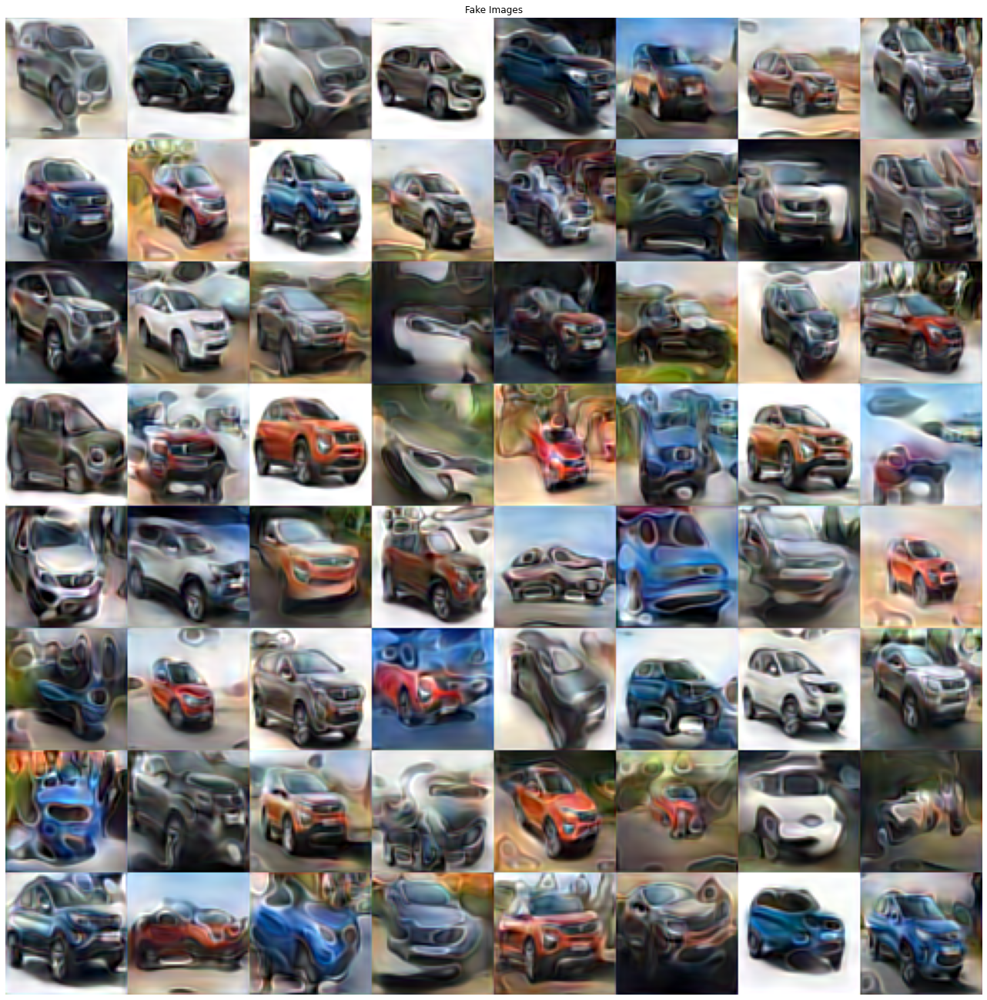

In [ ]:

# weights_path = "/content/ckpt/r1gan_steplr014000.pth.tar"
# checkpoint = torch.load(weights_path)
# D.load_state_dict(checkpoint['D'])
# G.load_state_dict(checkpoint['G'])
# D_opt.load_state_dict(checkpoint['d_optim'])
# G_opt.load_state_dict(checkpoint['g_optim'])



#rand_z = create_graphs_and_samples(img_list, data_loader,(50,50))

rand_z = generate_image_sample((50,50))




In [ ]:
rand_z_local =rand_z.clone()

In [ ]:
rand_z_local[offset][2]

tensor(-0.8106, device='cuda:0')

In [ ]:
offset = 0
#rand_z_local[offset][2] = 20
# rand_z[offset][100] = 1
output_z = G(rand_z_local[offset].reshape((1,256)).to(DEVICE))

plt.imshow(tensor2img(output_z[-1]))

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3121: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..2

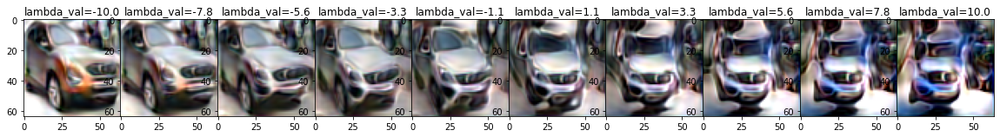

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

'\nDim(3) == Red to Blue + hood length \nDim(4) == Height (1, 20)--> SUV shaper\nDim(5) == car length+ head lights(1,20)\nDim(7) == Red Gloss active on the negative range (-20, 0)\nDim(38) ==  SUV + Background (10, 20)\nDim(25) == Ground clearance+Redness (-10,10)\nDim(239) == White to Blue SUV  (-20, -5)\nDim(244) == red Padmini  (-20, -9)\nDim(245) == red sports car to hatchback  (-20, 0)\n\n\n\nDim(254) == Zoom + background (1, 10)\n\n\n'

In [ ]:
rand_z_local =rand_z.clone()
offset = 4
#rand_z_local[offset][2] = 20
# rand_z[offset][100] = 1
output_z = G(rand_z_local[offset].reshape((1,256)).to(DEVICE))
fig, axs = plt.subplots(1,10, figsize=(20, 20))



lambda_range=np.linspace(-10,10,10)
feature = 25


for feature in [1,2]:
    fig.subplots_adjust(hspace = .5, wspace=.001)
    axs = axs.ravel()

    for ind,l in enumerate(lambda_range):
        #inter_image=interpolation(float(l), generator, latent_1, latent_2)
        rand_z_local[offset][feature] = l
        #rand_z_local[offset][12] = l
        output_z = G(rand_z_local[offset].reshape((1,256)).to(DEVICE))
        #inter_image = to_img(inter_image)
        
        image = tensor2img(output_z[-1])
    
        axs[ind].imshow(image)
        
        axs[ind].set_title('lambda_val='+str(round(l,1)))
    plt.show() 

'''
Dim(3) == Red to Blue + hood length 
Dim(4) == Height (1, 20)--> SUV shaper
Dim(5) == car length+ head lights(1,20)
Dim(7) == Red Gloss active on the negative range (-20, 0)
Dim(38) ==  SUV + Background (10, 20)
Dim(25) == Ground clearance+Redness (-10,10)
Dim(239) == White to Blue SUV  (-20, -5)
Dim(244) == red Padmini  (-20, -9)
Dim(245) == red sports car to hatchback  (-20, 0)



Dim(254) == Zoom + background (1, 10)


'''

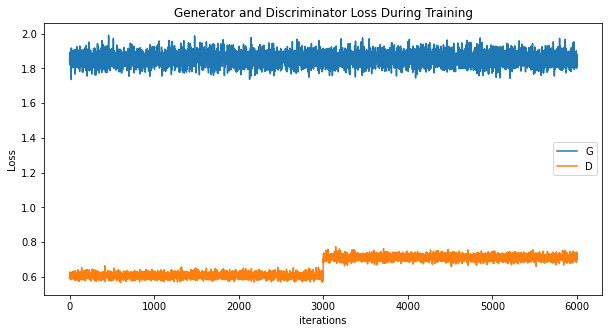

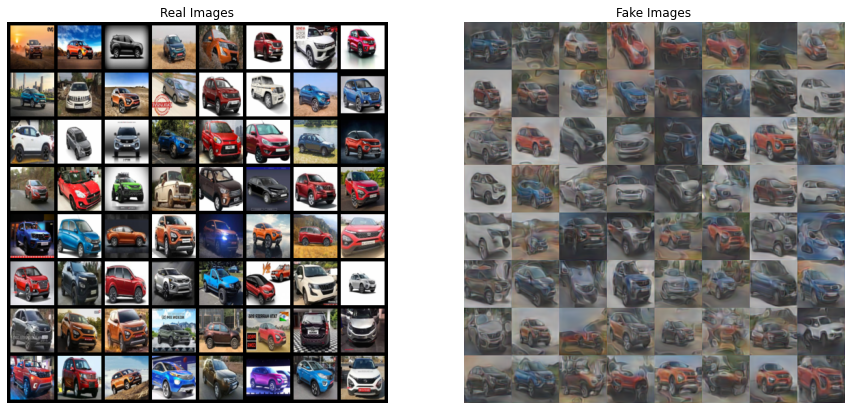

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3121: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


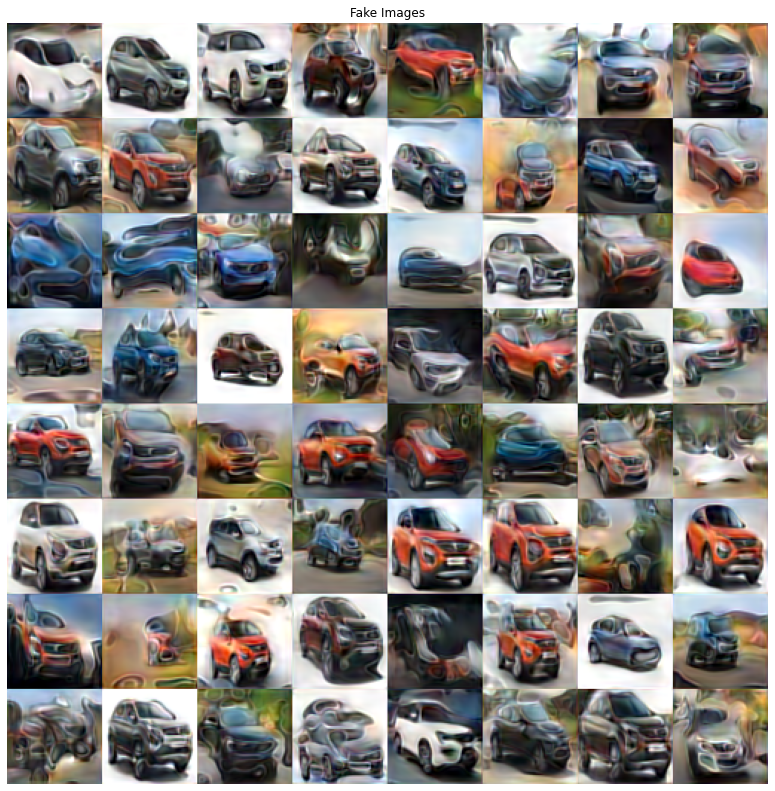

tensor([[ 0.8818,  0.5521,  0.2935,  ..., -0.9431, -0.6860, -0.6416],
        [ 0.0294,  0.9879, -0.9860,  ...,  0.6631, -0.6597, -0.6594],
        [ 0.4379, -0.6371, -0.5612,  ...,  0.4608, -0.0945,  0.5288],
        ...,
        [ 0.8358, -0.8778,  0.3017,  ..., -0.4591,  0.6917,  0.4016],
        [ 0.3821, -0.8100, -0.1388,  ..., -0.7525, -0.9215, -0.8872],
        [-0.1213,  0.5881,  0.3948,  ..., -0.2525,  0.3067, -0.6360]],
       device='cuda:0')

In [ ]:
create_graphs_and_samples(img_list, data_loader)

In [ ]:
output_z[-1].shape

torch.Size([3, 64, 64])

In [ ]:
save_checkpoint({'global_step': step,
        'D':D.state_dict(),
        'G':G.state_dict(),
        'd_optim': D_opt.state_dict(),
        'g_optim' : G_opt.state_dict()},
    'ckpt/r1gan_steplr{:06d}.pth.tar'.format(step))

#!cp $(ls -1rt /content/ckpt/*|tail -3)  /content/drive/My\ Drive/EVA4/S2GAN

In [ ]:
!ls -lrt /content/drive/My\ Drive/EVA4/S2GAN/*step*

-rw------- 1 root root 271295493 Sep 15 20:00 '/content/drive/My Drive/EVA4/S2GAN/r1gan003678.pth.tar_steplr'
-rw------- 1 root root 271295493 Sep 15 20:00 '/content/drive/My Drive/EVA4/S2GAN/r1gan003600.pth.tar_steplr'
-rw------- 1 root root 271295495 Sep 16 20:33 '/content/drive/My Drive/EVA4/S2GAN/r1gan008052.pth.tar_steplr'
-rw------- 1 root root 271295495 Sep 16 20:38 '/content/drive/My Drive/EVA4/S2GAN/r1gan005600.pth.tar_steplr'


In [ ]:
!cp /content/ckpt/r1gan_steplr020000.pth.tar /content/drive/My\ Drive/EVA4/S2GAN/

In [ ]:
#!cp /content/ckpt/r1gan003678.pth.tar /content/drive/My\ Drive/EVA4/S2GAN/r1gan003678.pth.tar_steplr  
!cp /content/ckpt/r1gan_steplr014000.pth.tar /content/drive/My\ Drive/EVA4/S2GAN/r1gan_steplr014000.pth.tar

In [ ]:
!cp /content/drive/My\ Drive/EVA4/S2GAN/r1gan008052.pth.tar_steplr   /content/ckpt/r1gan008052.pth

In [ ]:
next(iter(data_loader)).shape

torch.Size([128, 3, 64, 64])

In [ ]:
criterion = nn.BCELoss()
D_opt = torch.optim.Adam(D.parameters(), lr=0.001, betas=(0.5, 0.999))
G_opt = torch.optim.Adam(G.parameters(), lr=0.001, betas=(0.5, 0.999))

In [ ]:
max_epoch = 100
step = 0
n_critic = 1 # for training more k steps about Discriminator
n_noise = 100

In [ ]:
D_labels = torch.ones([batch_size, 1]).to(DEVICE) # Discriminator Label to real
D_fakes = torch.zeros([batch_size, 1]).to(DEVICE) # Discriminator Label to fake

In [ ]:
torch.rand(1,100).view(20,5).size()

torch.Size([20, 5])

## Sample

In [ ]:
import torchvision.utils as vutils

def create_graphs_and_samples(img_list, data_loader,size_tuple=(30,30)):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()


    real_batch = next(iter(data_loader))

    # Plot the real images
    plt.figure(figsize=(15,15))
    plt.subplot(1,2,1)
    plt.axis("off")
    plt.title("Real Images")
    plt.imshow(np.transpose(vutils.make_grid(real_batch.to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

    # Plot the fake images from the last epoch
    # plt.subplot(1,2,2)
    # plt.axis("off")
    # plt.title("Fake Images")
    # plt.imshow(np.transpose(img_list[-1],(1,2,0)))
    # plt.show()

    plt.subplot(1,2,2)
    plt.axis("off")
    plt.title("Fake Images")
    plt.imshow(np.array(img_list[-1]))#np.transpose(np.array(img_list[-1]),(1,2,0)))
    plt.show()

    return generate_image_sample(size_tuple)

def generate_image_sample(size_tuple=(30,30)):
    output_images,rand_z = get_sample_image(G, n_noise=n_noise, n_samples=64)
    #output_images_list = vutils.make_grid(output_images, padding=2, normalize=True)

    # img_data_np = output_images#.eval()
    # min_val = np.min(img_data_np)
    # max_val = np.max(img_data_np)
    # img_data_clamped = (img_data_np - min_val) / (max_val - min_val)
    plt.figure(figsize=size_tuple)

    plt.subplot(1,2,2)
    plt.axis("off")
    plt.title("Fake Images")
    #plt.imshow(np.transpose(output_images_list,(1,2,0)))
    plt.imshow(np.array(output_images))
    plt.show()
    return rand_z

In [ ]:
glob.glob("/content/allCars/*jpg")[1]

'/content/allCars/duster_00000237.jpg'

In [ ]:
import numpy as np
from PIL import Image


src1 = np.array(Image.open('/content/allCars/duster_00000237.jpg'))

my_bg_array = np.ones_like(src1)*255

src2 = Image.fromarray(my_bg_array).save("whiteback.png","PNG")

#dst = src1 * 0.2 + src2 * 0.8

rgb_im = Image.open('/content/allCars/duster_00000237.jpg').convert('RGB')
rgb_im.save("tes.png", "PNG")

#Image.fromarray(dst.astype(np.uint8)).save('numpy_image_alpha_blend.jpg')

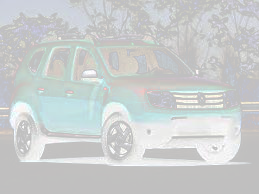

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
# Read the images
foreground = cv2.imread("/content/tes.png")
background = cv2.imread("/content/whiteback.png")
alpha = cv2.imread("tes.png")

# Convert uint8 to float
# foreground = foreground.astype(float)
# background = background.astype(float)

# # Normalize the alpha mask to keep intensity between 0 and 1
# alpha = alpha.astype(float)/255

# # Multiply the foreground with the alpha matte
# foreground = cv2.multiply(alpha, foreground)

# # Multiply the background with ( 1 - alpha )
# background = cv2.multiply(1.0 - alpha, background)

# # Add the masked foreground and background.
# outImage = cv2.add(foreground, background)

added_image = cv2.addWeighted(background,0.4,foreground,0.1,0)

cv2.imwrite('combined.png', added_image)

# Display image
cv2_imshow(outImage)
#cv2.waitKey(0)


In [ ]:
alpha

In [ ]:
!pip install rembg


  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 71kB 5.2MB/s 
     |████████████████████████████████| 12.4MB 246kB/s 
     |████████████████████████████████| 61kB 10.0MB/s 
     |████████████████████████████████| 14.5MB 237kB/s 
     |████████████████████████████████| 2.2MB 53.2MB/s 
     |████████████████████████████████| 71kB 10.3MB/s 
  Created wheel for rembg: filename=rembg-1.0.10-cp36-none-any.whl size=10906 sha256=1e928c327c105ab3aec2bbfb1591e85fabfc1ca63913abf33880731b954b029b
  Stored in directory: /root/.cache/pip/wheels/5a/90/51/cdc48712cac8df3ebc8881f12cec8a1d461648808f4373c3e7
Successfully built rembg
ERROR: tensorflow 2.3.0 has requirement numpy<1.19.0,>=1.16.0, but you'll have numpy 1.19.1 which is incompatible.
ERROR: google-colab 1.0.0 has requirement requests~=2.23.0, but you'll have requests 2.24.0 which is incompatible.
ERROR: datascience 0.10.6 has 

In [ ]:
!rembg /content/tes.png

u2net.pth: 100% 168M/168M [00:08<00:00, 21.7MiB/s]
u2netp.pth: 100% 4.47M/4.47M [00:00<00:00, 18.7MiB/s]


UnicodeDecodeError: ignored

In [ ]:
!rembg -o output.png /content/tes.png

In [ ]:
import sys
from rembg.bg import remove

In [ ]:
from io import BytesIO
with open("tes.png", "rb") as image:
  f = image.read()
  b = bytearray(f)


my_out = remove(b)

In [ ]:
type(my_out)

memoryview

In [ ]:
os.path.join("/content/png_format", "aa"+".png")

'/content/png_format/aa.png'

In [ ]:
!rm -rf /content/png_format*

In [ ]:
import os
import sys 

output_png_path = "/content/png_format"

for file_name in glob.glob("/content/allCars/*.jpg"):
    base_name = os.path.basename(file_name).split(".")[0]
    rgb_im = Image.open(file_name).convert('RGB')
    rgb_im.save(os.path.join(output_png_path , base_name+".png"), "PNG")


In [ ]:
!rembg -p /content/png_format

In [ ]:
glob.glob("/content/png_format/*out*png")[0]

'/content/png_format/Harrier_00000373.out.png'

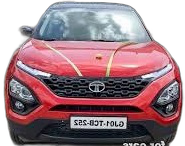

In [ ]:
Image.open(glob.glob("/content/png_format/*out*png")[0])

In [ ]:
jpeg_out_path = "/content/allCars_nobg"
for file_name in glob.glob("/content/png_format/*out*png"):
    base_name = os.path.basename(file_name).split(".")[0]
    rgb_im = Image.open(file_name).convert('RGB')
    rgb_im.save(os.path.join(jpeg_out_path , base_name+".jpg"),  quality=95)

In [ ]:
len(glob.glob("/content/allCars_nobg/*.*"))

1019

In [ ]:
len(glob.glob("/content/allCars/*.*"))

1019

In [ ]:
!tar -czvf allCars_nobg.tar.gz /content/allCars_nobg/

In [ ]:
!cp /content/allCars_nobg.tar.gz /content/drive/My\ Drive/EVA4/S2GAN